## Test de DBSCAN/Kmeans/Ward + Comparaisons des méthodes

In [1]:
%matplotlib inline
from nuscenes.nuscenes import NuScenes
nusc = NuScenes(version='v1.0-mini', dataroot='/Users/tiffanydarini/nuscenes-devkit/python-sdk/tutorials/data/sets/nuscenes/v1.0-mini', verbose=True)

Loading NuScenes tables for version v1.0-mini...
23 category,
8 attribute,
4 visibility,
911 instance,
12 sensor,
120 calibrated_sensor,
31206 ego_pose,
8 log,
10 scene,
404 sample,
31206 sample_data,
18538 sample_annotation,
4 map,
Done loading in 0.314 seconds.
Reverse indexing ...
Done reverse indexing in 0.1 seconds.


### Fonction utiles et imports nécessaires

In [2]:
# Fonction qui renvoie les tables ego_pose d'une scène donnée
def get_poses(scene_token):
    pose_list = []
    scene_rec = nusc.get('scene', scene_token)
    sample_rec = nusc.get('sample', scene_rec['first_sample_token'])
    sd_rec = nusc.get('sample_data', sample_rec['data']['LIDAR_TOP'])
    
    ego_pose = nusc.get('ego_pose', sd_rec['token'])
    pose_list.append(ego_pose)

    while sd_rec['next'] != '':
        sd_rec = nusc.get('sample_data', sd_rec['next'])
        ego_pose = nusc.get('ego_pose', sd_rec['token'])
        pose_list.append(ego_pose)

    return pose_list

In [3]:
# On crée une fonction qui renvoie la liste des rangs dans les listes X,Y des objets immobiles de 
# cette liste et donc d'une même catégorie, ainsi que la liste des objets mobiles 
from math import sqrt

def immobile(X,Y):
    Immo = []
    Mobile = []
    n = len(X) # Nombre d'élément dans la catégorie 
    for i in range(0,n-1):
        X_coord = X[i]
        Y_coord = Y[i]
        if len(X_coord)==1 :
            Immo.append(i)
        else : 
            d = 0 
            for k in range(0,len(X_coord)-1):
                d+= sqrt((X_coord[k+1]-X_coord[k])**2+(Y_coord[k+1]-Y_coord[k])**2)
            if d<2 : # Si la distance totale parcourue par l'objet est inférieur à 2m, on considère que l'objet bouge pas
                Immo.append(i)
            else :
                Mobile.append(i)
    return Immo,Mobile  

In [4]:
from dtw import *
import matplotlib.pyplot as plt
from datetime import timedelta

Importing the dtw module. When using in academic works please cite:
  T. Giorgino. Computing and Visualizing Dynamic Time Warping Alignments in R: The dtw Package.
  J. Stat. Soft., doi:10.18637/jss.v031.i07.



In [5]:
import numpy as np 
from math import sqrt 

# Fonction qui renvoie la matrice des distances 
def Matrice_distance(X_ego,Y_ego,X_veh,Y_veh):
    M = np.zeros((len(X_veh),len(X_ego)))
    for i in range(0,len(X_veh)):
        for j in range(0,len(X_ego)):
            #M[i,j] = sqrt((X_veh[len(X_veh)-1-i]-X_ego[j])**2+(Y_veh[len(Y_veh)-1-i]-Y_ego[j])**2)
            M[i,j] = sqrt((X_veh[i]-X_ego[j])**2+(Y_veh[i]-Y_ego[j])**2)
    return M 
     

In [6]:
import numpy as np 
from math import sqrt 

# Fonction qui renvoie la matrice des distances entre 
# les pts qui interagissent dans le temps 

def M_distance_time(X_ego,Y_ego,T_ego,X_veh,Y_veh,T_veh):
    
    debut = max(T_ego[0],T_veh[0]) # Temps début detection vehicule 1 
    fin = min(T_ego[len(T_ego)-1],T_veh[len(T_veh)-1]) # Temps fin detection vehicule 1 

    # On va créer la liste des indices des élements du veh 1 qui sont en même temps que le veh 2
    L_indice_ego = []
    for k in range(0,len(T_ego)):
        if debut<=T_ego[k]<=fin:
            L_indice_ego.append(k)
            
    # Pareil pour le veh 
    L_indice_veh = []
    for k in range(0,len(T_veh)):
        if debut<=T_veh[k]<=fin:
            L_indice_veh.append(k)
    
    M = np.zeros((len(L_indice_veh),len(L_indice_ego)))
    for i in range(0,len(L_indice_veh)):
        for j in range(0,len(L_indice_ego)):
            M[i,j] = sqrt((X_veh[L_indice_veh[i]]-X_ego[L_indice_ego[j]])**2+(Y_veh[L_indice_veh[i]]-Y_ego[L_indice_ego[j]])**2)
    
    return M 

In [7]:
# Pour normaliser le calcul de DTW, on va créer une fonction qui calcule
# la distance parcourue par un véhicule au cours de la scène, en prenant
# en entrée ses coordonnées

def distance_parcourue(X,Y,Z):
    D =[0]
    for k in range(0,len(X)-1):
        d = D[k]+ sqrt((X[k+1]-X[k])**2+(Y[k+1]-Y[k])**2+(Z[k+1]-Z[k])**2)
        D.append(d)
    return D[len(D)-1]

#### Fenêtre glissante

In [8]:
## Fonction qui renvoie une dataframe avec les valeurs de dtw calculés sur des intervalles de temps d'une seconde : 

#imports nécessaires
import matplotlib.pyplot as plt
from math import sqrt
import datetime 
from datetime import timedelta
from dtw import *
import pandas as pd

def dtw_glissante(scene_name):
    
    # On crée une dataframe 
    df = pd.DataFrame()
    L_intervalle = [[k,k+1] for k in range(0,20)]
    df['index']= L_intervalle
    df.set_index('index',inplace=True)
    df.index.name = None
    
    scene_token = nusc.field2token('scene','name',scene_name)[0]
    sample_token = nusc.field2token('sample','scene_token',scene_token)# Ensemble des token des échantillons de la scene 
    
    # Pour tracer la trajectoire du véhicule ego
    Liste_ego_poses = get_poses(scene_token) 
    X_coord =[]
    Y_coord =[]
    Z_coord =[]
    T_timestamp = [] # liste des timestamps
    for k in range(0,len(Liste_ego_poses)):
        X_coord.append(Liste_ego_poses[k]['translation'][0])
        Y_coord.append(Liste_ego_poses[k]['translation'][1])
        Z_coord.append(Liste_ego_poses[k]['translation'][2])
        T_timestamp.append(Liste_ego_poses[k]['timestamp'])
        
    # Ensemble des sample_annotation de la scène :
    sample_annotation_token = []
    for k in sample_token : 
        L = nusc.field2token('sample_annotation','sample_token',k)
        sample_annotation_token = sample_annotation_token + L
    
    # On créé la liste des token des instances présents dans les sample_annotation
    L_instance_token = []
    for k in sample_annotation_token :
        exemple = nusc.get('sample_annotation', k)
        L_instance_token.append(exemple['instance_token'])
    # Puisque pour un même objet, on peut avoir plusieurs annotations, on supprime les doublons de L
    L_instance_token = list(set(L_instance_token))
    
    # Liste des catégories d'objet dans la scène 
    L_category_name = []
    for k in sample_annotation_token :
        exemple = nusc.get('sample_annotation', k)
        L_category_name.append(exemple['category_name'])
    L_category_name = list(set(L_category_name)) #on supprime les doublons 
   
    L_vehicule = ['vehicle.bicycle','vehicle.bus.bendy','vehicle.bus.rigid','vehicle.car','vehicle.construction','vehicle.emergency.ambulance','vehicle.emergency.police','vehicle.motorcycle','vehicle.trailer','vehicle.truck']
    
    L_category_name = [k for k in L_category_name if k in L_vehicule]
    
    # Boucle sur chaque catégorie trouvée
    for j in range(0,len(L_category_name)):   
        catego_name = L_category_name[j]
        catego_token = nusc.field2token('category','name',catego_name)
        category = nusc.get('category',catego_token[0])

        # Ensemble des instances appartenant à la fois à la scène et à la catégorie
        L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
        L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 
        L_instance_category
        
        # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
        # les token des sample_annotation pour un élément de cette catégorie. 

        L=[]
        for k in L_instance_category : 
            instance_category = nusc.get('instance',k)
            nbr_annotations = instance_category['nbr_annotations']
            if nbr_annotations == 1:
                L.append([instance_category['first_annotation_token']])
            else : 
                H = []
                first_token = instance_category['first_annotation_token']
                last_token = instance_category['last_annotation_token']
                current_token = first_token 
        
                s = 0 
                while s!= nbr_annotations :
                    current_ann = nusc.get('sample_annotation', current_token)
                    H.append(current_ann['token'])
                    current_token = current_ann['next'] #On passe au suivant
                    s+=1
                L.append(H)
        
        # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
        # on va pouvoir récupérer leurs positions et tracer leurs trajectoires

        X = []
        Y = []
        Z = []
        T_time = []
        for k in L :
            x = []
            y = []
            z = []
            t=[]
            for j in k :
                sample_annotation = nusc.get('sample_annotation',j)
                x.append(sample_annotation['translation'][0])
                y.append(sample_annotation['translation'][1])
                z.append(sample_annotation['translation'][2])
                t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
            X.append(x)
            Y.append(y)
            Z.append(z)
            T_time.append(t)
    
        # On crée les listes des objets immobiles et mobiles de la catégorie
        Immo, Mobile = immobile(X,Y)
        
        # On conserve uniquement les objets mobiles 
        X_mobile=[X[i] for i in Mobile]
        Y_mobile=[Y[i] for i in Mobile]
        Z_mobile=[Z[i] for i in Mobile]
        T_mobile = [T_time[i] for i in Mobile]
        
        if len(X_mobile)>0:
        
            for i in range(0,len(X_mobile)):
            
                L_df = []
                # On fait une boucle sur les intervalles de temps 
                for k in range(0,20):
                    current_intervalle = [k,k+1]
                    # On crée les listes des coordonnées qu'on va garder ie qui sont dans l'intervalle de temps ci-dessus
                    Lx_pt_veh = []
                    Ly_pt_veh = []
                    Lt_pt_veh = []
                    Lx_pt_ego = []
                    Ly_pt_ego = []
                    Lt_pt_ego = []
                
                    # On remplit avec les pts du véhicule dont le timestamp est dans l'intervalle 
                    for s in range(len(X_mobile[i])):
                        tveh = (datetime.datetime.fromtimestamp(T_mobile[i][s]/1e6)-datetime.datetime.fromtimestamp(T_timestamp[0]/ 1e6)).total_seconds()
                        if tveh <= current_intervalle[1] and tveh >= current_intervalle[0] :
                            Lx_pt_veh.append(X_mobile[i][s])
                            Ly_pt_veh.append(Y_mobile[i][s])
                            Lt_pt_veh.append(T_mobile[i][s])
                    
                
                
                    # On remplit avec les pts du véhicule ego dont le timestamp est dans l'intervalle 
                    for s in range(len(X_coord)):
                        tego = (datetime.datetime.fromtimestamp(T_timestamp[s]/1e6)-datetime.datetime.fromtimestamp(T_timestamp[0]/ 1e6)).total_seconds()
                        if tego <= current_intervalle[1] and tego >= current_intervalle[0]:
                            Lx_pt_ego.append(X_coord[s])
                            Ly_pt_ego.append(Y_coord[s])
                            Lt_pt_ego.append(T_timestamp[s])
                
                            
                    if len(Lx_pt_veh)==0:
                        L_df.append(np.nan)
                    else :
                        #M_distance = M_distance_time(Lx_pt_ego,Ly_pt_ego,Lt_pt_ego,Lx_pt_veh,Ly_pt_veh,Lt_pt_veh)
                        M_distance = Matrice_distance(Lx_pt_ego,Ly_pt_ego,Lx_pt_veh,Ly_pt_veh)
                        alignment = dtw(M_distance)
                        distance = alignment.normalizedDistance
                        L_df.append(distance) 


                nom = catego_name +' '+str(i+1)
                df[nom]= L_df
    
    return df

#M_distance_time(X_coord,Y_coord,T_timestamp,X_mobile[i],Y_mobile[i],T_mobile[i])

In [9]:
scene_name = 'scene-0061'
df_glissante = dtw_glissante(scene_name)
df_glissante

,vehicle.car 1,vehicle.car 2,vehicle.car 3,vehicle.car 4,vehicle.car 5,vehicle.truck 1,vehicle.bus.rigid 1
"[0, 1]",24.142933,30.496933,35.404644,32.984968,72.845804,40.799903,55.787752
"[1, 2]",40.586937,23.331444,38.301036,29.549825,68.295421,36.055663,73.237145
"[2, 3]",NaN,18.449771,41.083774,26.569462,68.405882,32.986513,88.573954
"[3, 4]",NaN,15.947720,NaN,23.462511,70.101673,31.024287,NaN
"[4, 5]",NaN,15.506647,NaN,20.642470,72.894331,30.573171,NaN
"[5, 6]",NaN,18.349097,NaN,19.167695,76.961201,33.314116,NaN
"[6, 7]",NaN,19.956462,NaN,16.683242,78.957768,34.661234,NaN
"[7, 8]",NaN,20.535479,NaN,13.643041,NaN,35.264882,NaN
"[8, 9]",NaN,25.524104,NaN,12.589354,NaN,40.640636,NaN
"[9, 10]",NaN,31.787413,NaN,11.977253,NaN,48.562025,NaN


#### Produit scalaire entre les vecteurs

In [10]:
# Fonction qui renvoie la matrice des produits scalaires
import numpy as np

def Matrice_produit_scalaire(X_coord,Y_coord,T_timestamp,X_veh,Y_veh,T_veh):
    
        
    debut = max(T_timestamp[0],T_veh[0]) # Temps début detection vehicule 1 
    fin = min(T_timestamp[len(T_timestamp)-1],T_veh[len(T_veh)-1]) # Temps fin detection vehicule 1 

    # On va créer la liste des indices des élements du veh 1 qui sont en même temps que le veh 2
    L_indice_ego = []
    for k in range(0,len(T_timestamp)):
        if debut<=T_timestamp[k]<=fin:
            L_indice_ego.append(k)
            
    # Pareil pour le veh 
    L_indice_veh = []
    for k in range(0,len(T_veh)):
        if debut<=T_veh[k]<=fin:
            L_indice_veh.append(k)
    
    # On crée la liste des vecteurs pour le véhicule ego avec les points qu'on peut garder
    V_ego = []
    for k in range(0,len(L_indice_ego)-1):
        t2 = datetime.datetime.fromtimestamp(T_timestamp[L_indice_ego[k+1]]/ 1e6)
        t1 = datetime.datetime.fromtimestamp(T_timestamp[L_indice_ego[k]]/ 1e6)
        t = (t2-t1).total_seconds()
        v = np.array([X_coord[L_indice_ego[k+1]]-X_coord[L_indice_ego[k]],Y_coord[L_indice_ego[k+1]]-Y_coord[L_indice_ego[k]]])/t # Le vecteur a pour norme la vitesse à l'instant k
        V_ego.append(v)
        
        
    # On crée la liste des vecteurs pour le veh avec les points qu'on peut garder
    V = []
    for k in range(0,len(L_indice_veh)-1):
        t2 = datetime.datetime.fromtimestamp(T_veh[L_indice_veh[k+1]]/ 1e6)
        t1 = datetime.datetime.fromtimestamp(T_veh[L_indice_veh[k]]/ 1e6)
        t = (t2-t1).total_seconds()
        v = np.array([X_veh[L_indice_veh[k+1]]-X_veh[L_indice_veh[k]],Y_veh[L_indice_veh[k+1]]-Y_veh[L_indice_veh[k]]])/t
        V.append(v)
        
    # On crée la matrice des produits scalaires : 
    M = np.zeros((len(V),len(V_ego)))
    for i in range(0,len(V)):
        for j in range(0,len(V_ego)):
            M[i,j] = np.dot(V[i],V_ego[j])/(np.linalg.norm(V[i])*np.linalg.norm(V_ego[j]))
    return M 

In [11]:
# Fonction qui renvoie la norme du produit vectoriel divisée par la norme des vecteurs

def Matrice_produit_vectoriel(X_coord,Y_coord,T_timestamp,X_veh,Y_veh,T_veh):
    
         
    debut = max(T_timestamp[0],T_veh[0]) # Temps début detection vehicule 1 
    fin = min(T_timestamp[len(T_timestamp)-1],T_veh[len(T_veh)-1]) # Temps fin detection vehicule 1 

    # On va créer la liste des indices des élements du veh 1 qui sont en même temps que le veh 2
    L_indice_ego = []
    for k in range(0,len(T_timestamp)):
        if debut<=T_timestamp[k]<=fin:
            L_indice_ego.append(k)
            
    # Pareil pour le veh 
    L_indice_veh = []
    for k in range(0,len(T_veh)):
        if debut<=T_veh[k]<=fin:
            L_indice_veh.append(k)
    
    # On crée la liste des vecteurs pour le véhicule ego avec les points qu'on peut garder
    V_ego = []
    for k in range(0,len(L_indice_ego)-1):
        t2 = datetime.datetime.fromtimestamp(T_timestamp[L_indice_ego[k+1]]/ 1e6)
        t1 = datetime.datetime.fromtimestamp(T_timestamp[L_indice_ego[k]]/ 1e6)
        t = (t2-t1).total_seconds()
        v = np.array([X_coord[L_indice_ego[k+1]]-X_coord[L_indice_ego[k]],Y_coord[L_indice_ego[k+1]]-Y_coord[L_indice_ego[k]]])/t # Le vecteur a pour norme la vitesse à l'instant k
        V_ego.append(v)
        
        
    # On crée la liste des vecteurs pour le veh avec les points qu'on peut garder
    V = []
    for k in range(0,len(L_indice_veh)-1):
        t2 = datetime.datetime.fromtimestamp(T_veh[L_indice_veh[k+1]]/ 1e6)
        t1 = datetime.datetime.fromtimestamp(T_veh[L_indice_veh[k]]/ 1e6)
        t = (t2-t1).total_seconds()
        v = np.array([X_veh[L_indice_veh[k+1]]-X_veh[L_indice_veh[k]],Y_veh[L_indice_veh[k+1]]-Y_veh[L_indice_veh[k]]])/t
        V.append(v)

    # On crée la matrice des produits scalaires : 
    M = np.zeros((len(V),len(V_ego)))
    for i in range(0,len(V)):
        for j in range(0,len(V_ego)):
            M[i,j] = np.linalg.norm(np.cross(V[i],V_ego[j]))/(np.linalg.norm(V[i])*np.linalg.norm(V_ego[j]))
    return M 

In [12]:
# Fonction qui renvoie la vitesse moyenne de deux véhicules pendant le temps où ils interagissent 

def vitesse_moyenne(X_coord,Y_coord,T_timestamp,X_veh,Y_veh,T_veh):
    
    debut = max(T_timestamp[0],T_veh[0]) # Temps début detection vehicule 1 
    fin = min(T_timestamp[len(T_timestamp)-1],T_veh[len(T_veh)-1]) # Temps fin detection vehicule 1 

    # On va créer la liste des indices des élements du veh 1 qui sont en même temps que le veh 2
    L_indice_ego = []
    for k in range(0,len(T_timestamp)):
        if debut<=T_timestamp[k]<=fin:
            L_indice_ego.append(k)
            
    # Pareil pour le veh 
    L_indice_veh = []
    for k in range(0,len(T_veh)):
        if debut<=T_veh[k]<=fin:
            L_indice_veh.append(k)
    
    # On crée la liste des vecteurs pour le véhicule ego avec les points qu'on peut garder
    V_ego = []
    for k in range(0,len(L_indice_ego)-1):
        t2 = datetime.datetime.fromtimestamp(T_timestamp[L_indice_ego[k+1]]/ 1e6)
        t1 = datetime.datetime.fromtimestamp(T_timestamp[L_indice_ego[k]]/ 1e6)
        t = (t2-t1).total_seconds()
        v = np.array([X_coord[L_indice_ego[k+1]]-X_coord[L_indice_ego[k]],Y_coord[L_indice_ego[k+1]]-Y_coord[L_indice_ego[k]]])/t # Le vecteur a pour norme la vitesse à l'instant k
        V_ego.append(v)
    # Il faut créer le vecteur des normes de V_ego qui contient lui que des vecteurs 
    v_ego_moy = np.mean([np.linalg.norm(V_ego[i]) for i in range(0,len(V_ego))])
        
    # On crée la liste des vecteurs pour le veh avec les points qu'on peut garder
    V = []
    for k in range(0,len(L_indice_veh)-1):
        t2 = datetime.datetime.fromtimestamp(T_veh[L_indice_veh[k+1]]/ 1e6)
        t1 = datetime.datetime.fromtimestamp(T_veh[L_indice_veh[k]]/ 1e6)
        t = (t2-t1).total_seconds()
        v = np.array([X_veh[L_indice_veh[k+1]]-X_veh[L_indice_veh[k]],Y_veh[L_indice_veh[k+1]]-Y_veh[L_indice_veh[k]]])/t
        V.append(v)
    v_veh_moy = np.mean([np.linalg.norm(V[i]) for i in range(0,len(V))])
        
    return v_ego_moy,v_veh_moy

### Création des dataframes contenant les indicateurs 

In [34]:
#imports nécessaires
import matplotlib.pyplot as plt
from math import sqrt
import datetime 
from datetime import timedelta
from dtw import *
import pandas as pd
from statistics import mean

def indicateur_similarite(scene_name):
    
    # On crée une dataframe vide 
    df = pd.DataFrame()
    # Ligne de la dataframe 
    L_ligne = ['scene','Catégorie Véhicule 1','Numéro Véhicule 1','Catégorie Véhicule 2',\
               'Numéro Véhicule 2','Vitesse moyenne veh 1','Vitesse moyenne veh 2',\
               "Durée d'interaction",'DTW normalisée','Distance instantannée moyenne',\
               'Distance instantannée minimale','Distance instantannée maximale','TimeLag moyen horizontal',\
               'TimeLag moyen vertical',"Indicateur d'orthogonalité moyen","Indicateur d'orthogonalité min",\
               "Indicateur d'orthogonalité max",'Indicateur de colinéarité moyen',\
               'Indicateur de colinéarité min','Indicateur de colinéarité max','Sens',\
               'Distance minimale dans matrice distance','Distance maximale dans matrice distance',\
               'Distance moyenne dans matrice distance']
    # Les lignes en plus : 'Time log moyen'
    # On met ça en index 
    df['index']= L_ligne
    df.set_index('index',inplace=True)
    df.index.name = None
    
    # Dataframe des fenêtre glissantes 
    df_glissante = dtw_glissante(scene_name) 
    
    scene_token = nusc.field2token('scene','name',scene_name)[0]
    sample_token = nusc.field2token('sample','scene_token',scene_token)# Ensemble des token des échantillons de la scene 
    
    # Pour tracer la trajectoire du véhicule ego
    Liste_ego_poses = get_poses(scene_token) 
    X_coord =[]
    Y_coord =[]
    Z_coord =[]
    T_timestamp = [] # liste des timestamps
    for k in range(0,len(Liste_ego_poses)):
        X_coord.append(Liste_ego_poses[k]['translation'][0])
        Y_coord.append(Liste_ego_poses[k]['translation'][1])
        Z_coord.append(Liste_ego_poses[k]['translation'][2])
        T_timestamp.append(Liste_ego_poses[k]['timestamp'])
        
    # Ensemble des sample_annotation de la scène :
    sample_annotation_token = []
    for k in sample_token : 
        L = nusc.field2token('sample_annotation','sample_token',k)
        sample_annotation_token = sample_annotation_token + L
    
    # On créé la liste des token des instances présents dans les sample_annotation
    L_instance_token = []
    for k in sample_annotation_token :
        exemple = nusc.get('sample_annotation', k)
        L_instance_token.append(exemple['instance_token'])
    # Puisque pour un même objet, on peut avoir plusieurs annotations, on supprime les doublons de L
    L_instance_token = list(set(L_instance_token))
    
    # Liste des catégories d'objet dans la scène 
    L_category_name = []
    for k in sample_annotation_token :
        exemple = nusc.get('sample_annotation', k)
        L_category_name.append(exemple['category_name'])
    L_category_name = list(set(L_category_name)) #on supprime les doublons 
   
    L_vehicule = ['vehicle.bicycle','vehicle.bus.bendy','vehicle.bus.rigid','vehicle.car','vehicle.construction','vehicle.emergency.ambulance','vehicle.emergency.police','vehicle.motorcycle','vehicle.trailer','vehicle.truck']
    
    L_category_name = [k for k in L_category_name if k in L_vehicule]
    L_category_name.sort()
    
    # Boucle sur chaque catégorie trouvée
    for j in range(0,len(L_category_name)):   
        catego_name = L_category_name[j]
        catego_token = nusc.field2token('category','name',catego_name)
        category = nusc.get('category',catego_token[0])

        # Ensemble des instances appartenant à la fois à la scène et à la catégorie
        L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
        L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 
        
        # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
        # les token des sample_annotation pour un élément de cette catégorie. 

        L=[]
        for k in L_instance_category : 
            instance_category = nusc.get('instance',k)
            nbr_annotations = instance_category['nbr_annotations']
            if nbr_annotations == 1:
                L.append([instance_category['first_annotation_token']])
            else : 
                H = []
                first_token = instance_category['first_annotation_token']
                last_token = instance_category['last_annotation_token']
                current_token = first_token 
        
                s = 0 
                while s!= nbr_annotations :
                    current_ann = nusc.get('sample_annotation', current_token)
                    H.append(current_ann['token'])
                    current_token = current_ann['next'] #On passe au suivant
                    s+=1
                L.append(H)
        
        # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
        # on va pouvoir récupérer leurs positions et tracer leurs trajectoires

        X = []
        Y = []
        Z = []
        T_time = []
        for k in L :
            x = []
            y = []
            z = []
            t=[]
            for j in k :
                sample_annotation = nusc.get('sample_annotation',j)
                x.append(sample_annotation['translation'][0])
                y.append(sample_annotation['translation'][1])
                z.append(sample_annotation['translation'][2])
                t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
            X.append(x)
            Y.append(y)
            Z.append(z)
            T_time.append(t)
    
        # On crée les listes des objets immobiles et mobiles de la catégorie
        Immo, Mobile = immobile(X,Y)
        
        # On conserve uniquement les objets mobiles 
        X_mobile=[X[i] for i in Mobile]
        Y_mobile=[Y[i] for i in Mobile]
        Z_mobile=[Z[i] for i in Mobile]
        T_mobile = [T_time[i] for i in Mobile]
        
        for i in range(0,len(X_mobile)):
            L_objet = [] 
            # nom du véhicule 
            nom = catego_name +' '+str(i+1)
            
            ## Scene 
            L_objet.append(scene_name)
            
            ## Catégorie Véhicule 1
            L_objet.append('vehicle.ego')
            
            ## Numéro véhicule 1
            L_objet.append(1)
        
            ## Catégoie Véhicule 2
            L_objet.append(catego_name)
            
            ## Catégoie Véhicule 2
            L_objet.append(i+1)
            
            ## Vitesses moyennes 
            v_moy_ego, v_moy_veh = vitesse_moyenne(X_coord,Y_coord,T_timestamp,X_mobile[i],Y_mobile[i],T_mobile[i])
            L_objet.append(v_moy_ego)
            L_objet.append(v_moy_veh)
            
            ## Durée d'interaction 
            debut = max(T_mobile[i][0],T_timestamp[0])
            fin = min(T_mobile[i][-1],T_timestamp[-1])
            temps_ego = (datetime.datetime.fromtimestamp(T_timestamp[-1]/1e6)-datetime.datetime.fromtimestamp(T_timestamp[0]/ 1e6)).total_seconds()
            t_total = (datetime.datetime.fromtimestamp(fin/1e6)-datetime.datetime.fromtimestamp(debut/ 1e6)).total_seconds()
            L_objet.append(t_total/temps_ego)
            #L_objet.append(t_total)
            
            ## DTW normalisée
            #M_distance = Matrice_distance(X_coord,Y_coord,X_mobile[i],Y_mobile[i])
            M_distance = M_distance_time(X_coord,Y_coord,T_timestamp,X_mobile[i],Y_mobile[i],T_mobile[i])
            alignment = dtw(M_distance)
            distance = alignment.normalizedDistance
            L_objet.append(distance)
            
            Chemin = [[alignment.index1[k],alignment.index2[k]] for k in range(0,len(alignment.index1))]
            
            ## Distance instannée moyenne 
            L_objet.append(df_glissante[nom].mean())
            
            ## Distance instannée minimale
            L_objet.append(df_glissante[nom].min())
            
            ## Distance instannée maximale
            L_objet.append(df_glissante[nom].max())
            
            ## Time log moyen horizontal
            recurrence_0 = list(alignment.index1).count(0)
            indice_max_ego = alignment.index2[recurrence_0-1]
            t_horizontal = (datetime.datetime.fromtimestamp(T_timestamp[indice_max_ego]/1e6)-datetime.datetime.fromtimestamp(T_timestamp[0]/ 1e6)).total_seconds()
            L_objet.append(t_horizontal)
            
            ## Time log moyen vertical
            N = max(alignment.index2)
            recurrence_N = list(alignment.index2).count(N)
            indice_min_veh = alignment.index1[len(alignment.index1)-recurrence_N]
            t_vertical = (datetime.datetime.fromtimestamp(T_mobile[i][max(alignment.index1)]/1e6)-datetime.datetime.fromtimestamp(T_mobile[i][indice_min_veh]/ 1e6)).total_seconds()
            L_objet.append(t_vertical)
            
            ## Indicateur d'orthogonalité moyen : sin 
            M_pv = Matrice_produit_vectoriel(X_coord,Y_coord,T_timestamp,X_mobile[i],Y_mobile[i],T_mobile[i])
            L_pv = [M_pv[i,j] for(i,j) in Chemin[:len(Chemin)] if i<max(alignment.index1) and j<max(alignment.index2)]
            L_objet.append(mean(L_pv))
            
            ## Indicateur d'orthogonalité min 
            L_objet.append(min(L_pv))
            
            ## Indicateur d'orthogonalité max
            L_objet.append(max(L_pv))
            
            ## Indicateur de colinéarité moyen : cos
            M_ps = Matrice_produit_scalaire(X_coord,Y_coord,T_timestamp,X_mobile[i],Y_mobile[i],T_mobile[i])
            L_ps = [M_ps[i,j] for(i,j) in Chemin[:len(Chemin)] if i<max(alignment.index1) and j<max(alignment.index2)]
            L_objet.append(mean(L_ps))
            
            ## Indicateur de colinéarité min
            L_objet.append(min(L_ps))
            
            ## Indicateur de colinéarité max
            L_objet.append(max(L_ps))
            
            ## Sens 
            if mean(L_ps)>0:
                L_objet.append(1)
            else :
                L_objet.append(0)

            ## Distance min dans la matrice 
            L_objet.append(M_distance.min())
            
            ## Distance max dans la matrice 
            L_objet.append(M_distance.max()) 
            
            ## Distance moyenne dans la matrice 
            L_objet.append(M_distance.mean()) 
            
            nom = catego_name +' '+str(i+1)+'/ego dans '+scene_name
            df[nom]=L_objet
    return df.transpose()
    

In [35]:
scene_name = 'scene-0061'
df_61 = indicateur_similarite(scene_name)
df_61

,scene,Catégorie Véhicule 1,Numéro Véhicule 1,Catégorie Véhicule 2,Numéro Véhicule 2,Vitesse moyenne veh 1,Vitesse moyenne veh 2,Durée d'interaction,DTW normalisée,Distance instantannée moyenne,...,Indicateur d'orthogonalité moyen,Indicateur d'orthogonalité min,Indicateur d'orthogonalité max,Indicateur de colinéarité moyen,Indicateur de colinéarité min,Indicateur de colinéarité max,Sens,Distance minimale dans matrice distance,Distance maximale dans matrice distance,Distance moyenne dans matrice distance
vehicle.bus.rigid 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.bus.rigid,1,8.564618,9.255912,0.107044,62.784244,72.53295,...,0.011213,0.000274,0.03069,-0.999907,-1.0,-0.999529,0,53.479254,89.795179,71.922482
vehicle.car 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,1,8.862925,9.459852,0.054837,24.953401,32.364935,...,0.076894,0.063754,0.084432,-0.997027,-0.997966,-0.996429,0,20.739661,38.735602,29.578912
vehicle.car 2/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,2,6.155384,5.78235,0.600504,15.844434,26.217761,...,0.393398,0.092346,0.996106,0.831509,0.088161,0.995727,1,6.787707,88.709867,33.192634
vehicle.car 3/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,3,8.564618,11.088804,0.107044,32.294648,38.263151,...,0.059173,0.036886,0.078373,0.99819,0.996924,0.999319,1,23.975892,64.147662,43.973192
vehicle.car 4/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,4,4.77538,3.222342,1.0,5.050621,14.823187,...,0.035928,0.00008,0.140614,0.998951,0.990065,1.0,1,0.037589,77.803221,25.983685
vehicle.car 5/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,5,7.172089,8.206919,0.313245,53.675439,72.63744,...,0.108906,0.055613,0.226646,0.993171,0.973977,0.998452,1,34.032382,125.55427,78.287636
vehicle.truck 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.truck,1,6.155384,6.667293,0.600504,21.272493,41.538593,...,0.384397,0.082333,0.993241,0.827521,0.116069,0.996605,1,8.451707,100.054996,43.899822


In [36]:
# scene-0103
scene_name = 'scene-0103'
df_103 = indicateur_similarite(scene_name)
#df_103

/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in double_scalars
/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in double_scalars


In [37]:
# scene-0655
scene_name = 'scene-0655'
df_655 = indicateur_similarite(scene_name)
#df_655

In [38]:
# scene-0553
scene_name = 'scene-0553'
df_553 = indicateur_similarite(scene_name)
#df_553

/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in double_scalars
/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in double_scalars


In [39]:
# scene-0757
scene_name = 'scene-0757'
df_757 = indicateur_similarite(scene_name)
#df_757

/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in double_scalars
/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in double_scalars


In [40]:
# scene-0796
scene_name = 'scene-0796'
df_796 = indicateur_similarite(scene_name)
#df_796

/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in double_scalars
/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in double_scalars


In [41]:
# scene-0916
scene_name = 'scene-0916'
df_916 = indicateur_similarite(scene_name)
#df_916

/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in double_scalars
/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in double_scalars


In [42]:
# scene-1077
scene_name = 'scene-1077'
df_1077 = indicateur_similarite(scene_name)
#df_1077

/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in double_scalars
/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in double_scalars


In [43]:
# scene-1094
scene_name = 'scene-1094'
df_1094 = indicateur_similarite(scene_name)
#df_1094

In [44]:
# scene-1100
scene_name = 'scene-1100'
df_1100 = indicateur_similarite(scene_name)
#df_1100

/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in double_scalars
/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in double_scalars


In [45]:
# On rassemble toutes ces dataframe en une seule 
DF = pd.concat([df_61, df_103, df_655, df_553,df_757, df_796, df_916, df_1077, df_1094, df_1100])
DF

,scene,Catégorie Véhicule 1,Numéro Véhicule 1,Catégorie Véhicule 2,Numéro Véhicule 2,Vitesse moyenne veh 1,Vitesse moyenne veh 2,Durée d'interaction,DTW normalisée,Distance instantannée moyenne,...,Indicateur d'orthogonalité moyen,Indicateur d'orthogonalité min,Indicateur d'orthogonalité max,Indicateur de colinéarité moyen,Indicateur de colinéarité min,Indicateur de colinéarité max,Sens,Distance minimale dans matrice distance,Distance maximale dans matrice distance,Distance moyenne dans matrice distance
vehicle.bus.rigid 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.bus.rigid,1,8.564618,9.255912,0.107044,62.784244,72.53295,...,0.011213,0.000274,0.03069,-0.999907,-1.0,-0.999529,0,53.479254,89.795179,71.922482
vehicle.car 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,1,8.862925,9.459852,0.054837,24.953401,32.364935,...,0.076894,0.063754,0.084432,-0.997027,-0.997966,-0.996429,0,20.739661,38.735602,29.578912
vehicle.car 2/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,2,6.155384,5.78235,0.600504,15.844434,26.217761,...,0.393398,0.092346,0.996106,0.831509,0.088161,0.995727,1,6.787707,88.709867,33.192634
vehicle.car 3/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,3,8.564618,11.088804,0.107044,32.294648,38.263151,...,0.059173,0.036886,0.078373,0.99819,0.996924,0.999319,1,23.975892,64.147662,43.973192
vehicle.car 4/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,4,4.77538,3.222342,1.0,5.050621,14.823187,...,0.035928,0.00008,0.140614,0.998951,0.990065,1.0,1,0.037589,77.803221,25.983685
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
vehicle.car 10/ego dans scene-1100,scene-1100,vehicle.ego,1,vehicle.car,10,0.000904,10.875512,0.076936,36.300017,40.119013,...,0.892753,0.457852,0.999624,0.099266,-0.537538,0.889029,1,36.422604,52.501291,44.453959
vehicle.car 11/ego dans scene-1100,scene-1100,vehicle.ego,1,vehicle.car,11,0.008808,10.122451,0.384567,7.559059,27.860522,...,0.450298,0.00907,0.97395,0.393722,-0.894795,0.999959,1,4.931301,67.33188,32.636504
vehicle.car 12/ego dans scene-1100,scene-1100,vehicle.ego,1,vehicle.car,12,0.086441,1.161951,0.666705,54.757857,55.92705,...,0.637105,0.025747,0.999954,-0.194083,-0.999668,0.874724,0,53.982708,69.55398,58.33733
vehicle.motorcycle 1/ego dans scene-1100,scene-1100,vehicle.ego,1,vehicle.motorcycle,1,0.058177,3.527771,1.0,20.553611,34.305997,...,NaN,NaN,NaN,NaN,NaN,NaN,0,18.51167,82.367364,36.115545


In [46]:
DF.columns

Index(['scene', 'Catégorie Véhicule 1', 'Numéro Véhicule 1',
       'Catégorie Véhicule 2', 'Numéro Véhicule 2', 'Vitesse moyenne veh 1',
       'Vitesse moyenne veh 2', 'Durée d'interaction', 'DTW normalisée',
       'Distance instantannée moyenne', 'Distance instantannée minimale',
       'Distance instantannée maximale', 'TimeLag moyen horizontal',
       'TimeLag moyen vertical', 'Indicateur d'orthogonalité moyen',
       'Indicateur d'orthogonalité min', 'Indicateur d'orthogonalité max',
       'Indicateur de colinéarité moyen', 'Indicateur de colinéarité min',
       'Indicateur de colinéarité max', 'Sens',
       'Distance minimale dans matrice distance',
       'Distance maximale dans matrice distance',
       'Distance moyenne dans matrice distance'],
      dtype='object')

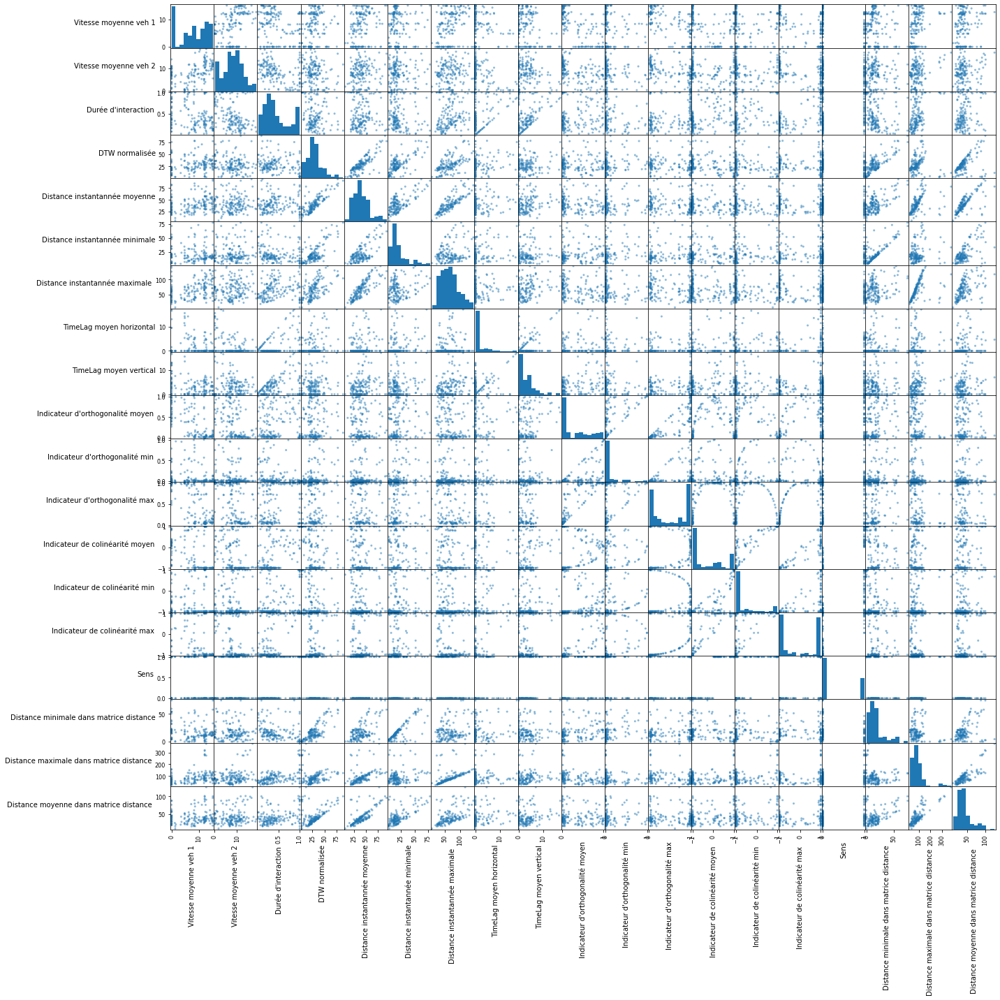

In [47]:
## On va tracer les courbes des colonnes les unes par rapport aux autres, 

# On converti le type des colonnes en float d'abbord
DF[list(DF.columns[5:])] = DF[list(DF.columns[5:])].apply(pd.to_numeric)
axes = pd.plotting.scatter_matrix(DF,figsize=(20,20))
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')

plt.tight_layout()
plt.gcf().subplots_adjust(wspace=0, hspace=0)
plt.show()

#### On étend le calcul à une l'étude des interractions entre les véhicules 

In [48]:
## Il faut reprendre la fonction fenêtre glissante 

In [49]:
#imports nécessaires
import matplotlib.pyplot as plt
from math import sqrt
import datetime 
from datetime import timedelta
from dtw import *
import pandas as pd
from statistics import mean

def indicateur_similarite_entre_veh(scene_name):
    
    # On crée une dataframe vide 
    df = pd.DataFrame()
    # Ligne de la dataframe 
    
    L_ligne = ['scene','Catégorie Véhicule 1','Numéro Véhicule 1','Catégorie Véhicule 2',\
               'Numéro Véhicule 2','Vitesse moyenne veh 1','Vitesse moyenne veh 2',\
               "Durée d'interaction",'DTW normalisée','Distance instantannée moyenne',\
               'Distance instantannée minimale','Distance instantannée maximale','TimeLag moyen horizontal',\
               'TimeLag moyen vertical',"Indicateur d'orthogonalité moyen","Indicateur d'orthogonalité min",\
               "Indicateur d'orthogonalité max",'Indicateur de colinéarité moyen',\
               'Indicateur de colinéarité min','Indicateur de colinéarité max','Sens',\
               'Distance minimale dans matrice distance','Distance maximale dans matrice distance',\
               'Distance moyenne dans matrice distance']
   
    # On met ça en index 
    df['index']= L_ligne
    df.set_index('index',inplace=True)
    df.index.name = None 

    scene_token = nusc.field2token('scene','name',scene_name)[0]
    sample_token = nusc.field2token('sample','scene_token',scene_token)# Ensemble des token des échantillons de la scene 
    
    # Pour tracer la trajectoire du véhicule ego
    Liste_ego_poses = get_poses(scene_token) 
    X_coord =[]
    Y_coord =[]
    Z_coord =[]
    T_timestamp = [] # liste des timestamps
    for k in range(0,len(Liste_ego_poses)):
        X_coord.append(Liste_ego_poses[k]['translation'][0])
        Y_coord.append(Liste_ego_poses[k]['translation'][1])
        Z_coord.append(Liste_ego_poses[k]['translation'][2])
        T_timestamp.append(Liste_ego_poses[k]['timestamp'])
        
    # Ensemble des sample_annotation de la scène :
    sample_annotation_token = []
    for k in sample_token : 
        L = nusc.field2token('sample_annotation','sample_token',k)
        sample_annotation_token = sample_annotation_token + L
    
    # On créé la liste des token des instances présents dans les sample_annotation
    L_instance_token = []
    for k in sample_annotation_token :
        exemple = nusc.get('sample_annotation', k)
        L_instance_token.append(exemple['instance_token'])
    # Puisque pour un même objet, on peut avoir plusieurs annotations, on supprime les doublons de L
    L_instance_token = list(set(L_instance_token))
    
    # Liste des catégories d'objet dans la scène 
    L_category_name = []
    for k in sample_annotation_token :
        exemple = nusc.get('sample_annotation', k)
        L_category_name.append(exemple['category_name'])
    L_category_name = list(set(L_category_name)) #on supprime les doublons 
   
    L_vehicule = ['vehicle.bicycle','vehicle.bus.bendy','vehicle.bus.rigid','vehicle.car','vehicle.construction','vehicle.emergency.ambulance','vehicle.emergency.police','vehicle.motorcycle','vehicle.trailer','vehicle.truck']
    
    L_category_name = [k for k in L_category_name if k in L_vehicule]
    L_category_name.sort()
    
    # Boucle sur chaque catégorie trouvée
    for j in range(0,len(L_category_name)):   
        catego_name = L_category_name[j]
        catego_token = nusc.field2token('category','name',catego_name)
        category = nusc.get('category',catego_token[0])

        # Ensemble des instances appartenant à la fois à la scène et à la catégorie
        L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
        L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 
        L_instance_category
        
        # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
        # les token des sample_annotation pour un élément de cette catégorie. 

        L=[]
        for k in L_instance_category : 
            instance_category = nusc.get('instance',k)
            nbr_annotations = instance_category['nbr_annotations']
            if nbr_annotations == 1:
                L.append([instance_category['first_annotation_token']])
            else : 
                H = []
                first_token = instance_category['first_annotation_token']
                last_token = instance_category['last_annotation_token']
                current_token = first_token 
        
                s = 0 
                while s!= nbr_annotations :
                    current_ann = nusc.get('sample_annotation', current_token)
                    H.append(current_ann['token'])
                    current_token = current_ann['next'] #On passe au suivant
                    s+=1
                L.append(H)
        
        # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
        # on va pouvoir récupérer leurs positions et tracer leurs trajectoires

        X = []
        Y = []
        Z = []
        T_time = []
        for k in L :
            x = []
            y = []
            z = []
            t=[]
            for f in k :
                sample_annotation = nusc.get('sample_annotation',f)
                x.append(sample_annotation['translation'][0])
                y.append(sample_annotation['translation'][1])
                z.append(sample_annotation['translation'][2])
                t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
            X.append(x)
            Y.append(y)
            Z.append(z)
            T_time.append(t)
    
        # On crée les listes des objets immobiles et mobiles de la catégorie
        Immo, Mobile = immobile(X,Y)
        
        # On conserve uniquement les objets mobiles 
        X_mobile=[X[i] for i in Mobile]
        Y_mobile=[Y[i] for i in Mobile]
        Z_mobile=[Z[i] for i in Mobile]
        T_mobile = [T_time[i] for i in Mobile]
        
        for i in range(0,len(X_mobile)):
            
            if len(X_mobile)>1:
                
                for k in range(i+1,len(X_mobile)):

                    L_objet = [] 
                    # nom du véhicule 
                    nom = catego_name +' '+str(i+1)+' /'+ catego_name+' '+str(k+1)+' '+ scene_name
                    
                    ## Scene_name
                    L_objet.append(scene_name)
                    
                    ## Catégorie Véhicule 1 
                    L_objet.append(catego_name)
                    ## Numéro véhicule 1 
                    L_objet.append(i+1)
                    
                    ## Catégorie Véhicule 2 
                    L_objet.append(catego_name)
                    ## Numéro véhicule 2 
                    L_objet.append(k+1)
                    
                    ## Vitesses moyennes 
                    v_moy_veh1, v_moy_veh2 = vitesse_moyenne(X_mobile[i],Y_mobile[i],T_mobile[i],X_mobile[k],Y_mobile[k],T_mobile[k])
                    L_objet.append(v_moy_veh1)
                    L_objet.append(v_moy_veh2)
                    
                    ## Durée d'interaction 
                    debut = max(T_mobile[i][0],T_mobile[k][0])
                    fin = min(T_mobile[i][-1],T_mobile[k][-1])
                    t_total = (datetime.datetime.fromtimestamp(fin/1e6)-datetime.datetime.fromtimestamp(debut/ 1e6)).total_seconds()
                    temps_max =max((datetime.datetime.fromtimestamp(T_mobile[i][-1]/1e6)-datetime.datetime.fromtimestamp(T_mobile[i][0]/ 1e6)).total_seconds(),(datetime.datetime.fromtimestamp(T_mobile[k][-1]/1e6)-datetime.datetime.fromtimestamp(T_mobile[k][0]/ 1e6)).total_seconds())
                    if t_total >0 :
                        L_objet.append(t_total/temps_max)
                        #L_objet.append(t_total)
                    else :
                        L_objet.append(np.nan)
                        

                    ## DTW normalisée
                    M_distance =M_distance_time(X_mobile[i],Y_mobile[i],T_mobile[i],X_mobile[k],Y_mobile[k],T_mobile[k])
                    
                    if len(M_distance)>0 :
                    
                        alignment = dtw(M_distance)
                        distance = alignment.normalizedDistance
                        L_objet.append(distance)

                        Chemin = [[alignment.index1[k],alignment.index2[k]] for k in range(0,len(alignment.index1))]

                        ### Fenêtre glissante 

                        L_df = []
                        # On fait une boucle sur les intervalles de temps 
                        for m in range(0,20):
                            current_intervalle = [m,m+1]
                            # On crée les listes des coordonnées qu'on va garder ie qui sont dans l'intervalle de temps ci-dessus
                            Lx_pt_veh1 = []
                            Ly_pt_veh1 = []
                            Lt_pt_veh1 = []
                            Lx_pt_veh2 = []
                            Ly_pt_veh2 = []
                            Lt_pt_veh2 = []

                            # On remplit avec les pts du véhicule dont le timestamp est dans l'intervalle 
                            for s in range(len(X_mobile[i])):
                                tveh1 = (datetime.datetime.fromtimestamp(T_mobile[i][s]/1e6)-datetime.datetime.fromtimestamp(T_timestamp[0]/ 1e6)).total_seconds()
                                if tveh1 <= current_intervalle[1] and tveh1 >= current_intervalle[0] :
                                    Lx_pt_veh1.append(X_mobile[i][s])
                                    Ly_pt_veh1.append(Y_mobile[i][s])
                                    Lt_pt_veh1.append(T_mobile[i][s])

                            # On remplit avec les pts du véhicule ego dont le timestamp est dans l'intervalle 
                            for s in range(len(X_mobile[k])):
                                tveh2 = (datetime.datetime.fromtimestamp(T_mobile[k][s]/1e6)-datetime.datetime.fromtimestamp(T_timestamp[0]/ 1e6)).total_seconds()
                                if tveh2 <= current_intervalle[1] and tveh2 >= current_intervalle[0]:
                                    Lx_pt_veh2.append(X_mobile[k][s])
                                    Ly_pt_veh2.append(Y_mobile[k][s])
                                    Lt_pt_veh2.append(T_mobile[k][s])

                            if len(Lx_pt_veh1)>0 and len(Lx_pt_veh2)>0:
                                #M_distance_glissante = M_distance_time(Lx_pt_veh1,Ly_pt_veh1,Lt_pt_veh1,Lx_pt_veh2,Ly_pt_veh2,Lt_pt_veh2)
                                M_distance_glissante = Matrice_distance(Lx_pt_veh2,Ly_pt_veh2,Lx_pt_veh1,Ly_pt_veh1)
                                alignment_glissante = dtw(M_distance_glissante)
                                distance_glissante = alignment_glissante.normalizedDistance
                                L_df.append(distance_glissante) 

                        ## Distance instannée moyenne 
                        L_objet.append(mean(L_df))

                        ## Distance instannée minimale
                        L_objet.append(min(L_df))

                        ## Distance instannée maximale
                        L_objet.append(max(L_df))

                        ## Time log moyen horizontal
                        recurrence_0 = list(alignment.index1).count(0)
                        indice_max_ego = alignment.index2[recurrence_0-1]
                        t_horizontal = (datetime.datetime.fromtimestamp(T_mobile[i][indice_max_ego]/1e6)-datetime.datetime.fromtimestamp(T_mobile[i][0]/ 1e6)).total_seconds()
                        L_objet.append(t_horizontal)

                        ## Time log moyen vertical
                        N = max(alignment.index2)
                        recurrence_N = list(alignment.index2).count(N)
                        indice_min_veh = alignment.index1[len(alignment.index1)-recurrence_N]
                        t_vertical = (datetime.datetime.fromtimestamp(T_mobile[k][max(alignment.index1)]/1e6)-datetime.datetime.fromtimestamp(T_mobile[k][indice_min_veh]/ 1e6)).total_seconds()
                        L_objet.append(t_vertical)

                        ## Indicateur d'orthogonalité : sin 
                        M_pv = Matrice_produit_vectoriel(X_mobile[i],Y_mobile[i],T_mobile[i],X_mobile[k],Y_mobile[k],T_mobile[k])
                        L_pv = [M_pv[i,j] for(i,j) in Chemin[:len(Chemin)] if i<max(alignment.index1) and j<max(alignment.index2)]
                        if len(L_pv)>0:
                            L_objet.append(mean(L_pv))
                            L_objet.append(min(L_pv))
                            L_objet.append(max(L_pv))
                        else :
                            L_objet.append(np.nan)
                            L_objet.append(np.nan)
                            L_objet.append(np.nan)

                        ## Indicateur de colinéarité : cos
                        M_ps = Matrice_produit_scalaire(X_mobile[i],Y_mobile[i],T_mobile[i],X_mobile[k],Y_mobile[k],T_mobile[k])
                        L_ps = [M_ps[i,j] for(i,j) in Chemin[:len(Chemin)] if i<max(alignment.index1) and j<max(alignment.index2)]
                        if len(L_ps)>0:
                            L_objet.append(mean(L_ps))
                            L_objet.append(min(L_ps))
                            L_objet.append(max(L_ps))
                        else : 
                            L_objet.append(np.nan)
                            L_objet.append(np.nan)
                            L_objet.append(np.nan)
                        
                        ## Sens :
                        if len(L_ps)>0 :
                            if mean(L_ps)>0:
                                L_objet.append(1)
                            else :
                                L_objet.append(0)
                        else : 
                            L_objet.append(np.nan)
        
                        ## Distance min dans la matrice 
                        L_objet.append(M_distance.min())

                        ## Distance max dans la matrice 
                        L_objet.append(M_distance.max()) 

                        ## Distance moyenne dans la matrice 
                        L_objet.append(M_distance.mean()) 
                    
                    else : 
                        L_objet = L_objet + [np.nan]*16
                        
                    df[nom]=L_objet
            
            # On s'occuper maintenant des relations inter-catégories 
            for h in range(j+1,len(L_category_name)):   
                catego_name2 = L_category_name[h]
                catego_token2 = nusc.field2token('category','name',catego_name2)
                category2 = nusc.get('category',catego_token2[0])

                # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                L_instance_category2 = nusc.field2token('instance','category_token',catego_token2[0]) # instance dans la catégorie
                L_instance_category2 = [x for x in L_instance_category2 if x in L_instance_token]# et dans la scène 

                # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                # les token des sample_annotation pour un élément de cette catégorie. 

                L2=[]
                for k in L_instance_category2 : 
                    instance_category = nusc.get('instance',k)
                    nbr_annotations = instance_category['nbr_annotations']
                    if nbr_annotations == 1:
                        L.append([instance_category['first_annotation_token']])
                    else : 
                        H = []
                        first_token = instance_category['first_annotation_token']
                        last_token = instance_category['last_annotation_token']
                        current_token = first_token 

                        s = 0 
                        while s!= nbr_annotations :
                            current_ann = nusc.get('sample_annotation', current_token)
                            H.append(current_ann['token'])
                            current_token = current_ann['next'] #On passe au suivant
                            s+=1
                        L2.append(H)

                # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                # on va pouvoir récupérer leurs positions et tracer leurs trajectoires

                X2 = []
                Y2 = []
                Z2 = []
                T2_time = []
                for k in L2 :
                    x = []
                    y = []
                    z = []
                    t=[]
                    for f in k :
                        sample_annotation = nusc.get('sample_annotation',f)
                        x.append(sample_annotation['translation'][0])
                        y.append(sample_annotation['translation'][1])
                        z.append(sample_annotation['translation'][2])
                        t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                    X2.append(x)
                    Y2.append(y)
                    Z2.append(z)
                    T2_time.append(t)

                # On crée les listes des objets immobiles et mobiles de la catégorie
                Immo2, Mobile2 = immobile(X2,Y2)

                # On conserve uniquement les objets mobiles 
                X2_mobile=[X2[i] for i in Mobile2]
                Y2_mobile=[Y2[i] for i in Mobile2]
                Z2_mobile=[Z2[i] for i in Mobile2]
                T2_mobile = [T2_time[i] for i in Mobile2]
                
                if len(X2_mobile)>0:
                    
                    for n in range(0,len(X2_mobile)):
                        L_objet = [] 
                        # nom du véhicule 
                        nom = catego_name +' '+str(i+1)+' /'+ catego_name2+' '+str(n+1)+' '+ scene_name

                        ## Scene_name
                        L_objet.append(scene_name)
                        
                         ## Catégorie Véhicule 1 
                        L_objet.append(catego_name)
                        ## Numéro véhicule 1 
                        L_objet.append(i+1)
                    
                        ## Catégorie Véhicule 2 
                        L_objet.append(catego_name2)
                        ## Numéro véhicule 2 
                        L_objet.append(n+1)

                        ## Vitesses moyennes 
                        v_moy_veh1, v_moy_veh2 = vitesse_moyenne(X_mobile[i],Y_mobile[i],T_mobile[i],X2_mobile[n],Y2_mobile[n],T2_mobile[n])
                        L_objet.append(v_moy_veh1)
                        L_objet.append(v_moy_veh2)

                        ## Durée d'interaction 
                        debut = max(T_mobile[i][0],T2_mobile[n][0])
                        fin = min(T_mobile[i][-1],T2_mobile[n][-1])
                        t_total = (datetime.datetime.fromtimestamp(fin/1e6)-datetime.datetime.fromtimestamp(debut/ 1e6)).total_seconds()
                        temps_max =max((datetime.datetime.fromtimestamp(T_mobile[i][-1]/1e6)-datetime.datetime.fromtimestamp(T_mobile[i][0]/ 1e6)).total_seconds(),(datetime.datetime.fromtimestamp(T2_mobile[n][-1]/1e6)-datetime.datetime.fromtimestamp(T2_mobile[n][0]/ 1e6)).total_seconds())
                        if t_total >0 :
                            L_objet.append(t_total/temps_max)
                            #L_objet.append(t_total)
                        else :
                            L_objet.append(np.nan)


                        ## DTW normalisée
                        M_distance =M_distance_time(X_mobile[i],Y_mobile[i],T_mobile[i],X2_mobile[n],Y2_mobile[n],T2_mobile[n])

                        if len(M_distance)>0 :

                            alignment = dtw(M_distance)
                            distance = alignment.normalizedDistance
                            L_objet.append(distance)

                            Chemin = [[alignment.index1[k],alignment.index2[k]] for k in range(0,len(alignment.index1))]

                            ### Fenêtre glissante 

                            L_df = []
                            # On fait une boucle sur les intervalles de temps 
                            for m in range(0,20):
                                current_intervalle = [m,m+1]
                                # On crée les listes des coordonnées qu'on va garder ie qui sont dans l'intervalle de temps ci-dessus
                                Lx_pt_veh1 = []
                                Ly_pt_veh1 = []
                                Lt_pt_veh1 = []
                                Lx_pt_veh2 = []
                                Ly_pt_veh2 = []
                                Lt_pt_veh2 = []

                                # On remplit avec les pts du véhicule dont le timestamp est dans l'intervalle 
                                for s in range(len(X_mobile[i])):
                                    tveh1 = (datetime.datetime.fromtimestamp(T_mobile[i][s]/1e6)-datetime.datetime.fromtimestamp(T_timestamp[0]/ 1e6)).total_seconds()
                                    if tveh1 <= current_intervalle[1] and tveh1 >= current_intervalle[0] :
                                        Lx_pt_veh1.append(X_mobile[i][s])
                                        Ly_pt_veh1.append(Y_mobile[i][s])
                                        Lt_pt_veh1.append(T_mobile[i][s])

                                # On remplit avec les pts du véhicule ego dont le timestamp est dans l'intervalle 
                                for s in range(len(X2_mobile[n])):
                                    tveh2 = (datetime.datetime.fromtimestamp(T2_mobile[n][s]/1e6)-datetime.datetime.fromtimestamp(T_timestamp[0]/ 1e6)).total_seconds()
                                    if tveh2 <= current_intervalle[1] and tveh2 >= current_intervalle[0]:
                                        Lx_pt_veh2.append(X2_mobile[n][s])
                                        Ly_pt_veh2.append(Y2_mobile[n][s])
                                        Lt_pt_veh2.append(T2_mobile[n][s])

                                if len(Lx_pt_veh1)>0 and len(Lx_pt_veh2)>0:
                                    #M_distance_glissante = M_distance_time(Lx_pt_veh1,Ly_pt_veh1,Lt_pt_veh1,Lx_pt_veh2,Ly_pt_veh2,Lt_pt_veh2)
                                    M_distance_glissante = Matrice_distance(Lx_pt_veh2,Ly_pt_veh2,Lx_pt_veh1,Ly_pt_veh1)
                                    alignment_glissante = dtw(M_distance_glissante)
                                    distance_glissante = alignment_glissante.normalizedDistance
                                    L_df.append(distance_glissante) 

                            ## Distance instannée moyenne 
                            L_objet.append(mean(L_df))

                            ## Distance instannée minimale
                            L_objet.append(min(L_df))

                            ## Distance instannée maximale
                            L_objet.append(max(L_df))

                            ## Time log moyen horizontal
                            recurrence_0 = list(alignment.index1).count(0)
                            indice_max_ego = alignment.index2[recurrence_0-1]
                            t_horizontal = (datetime.datetime.fromtimestamp(T_mobile[i][indice_max_ego]/1e6)-datetime.datetime.fromtimestamp(T_mobile[i][0]/ 1e6)).total_seconds()
                            L_objet.append(t_horizontal)

                            ## Time log moyen vertical
                            N = max(alignment.index2)
                            recurrence_N = list(alignment.index2).count(N)
                            indice_min_veh = alignment.index1[len(alignment.index1)-recurrence_N]
                            t_vertical = (datetime.datetime.fromtimestamp(T2_mobile[n][max(alignment.index1)]/1e6)-datetime.datetime.fromtimestamp(T2_mobile[n][indice_min_veh]/ 1e6)).total_seconds()
                            L_objet.append(t_vertical)

                            ## Indicateur d'orthogonalité : sin 
                            M_pv = Matrice_produit_vectoriel(X_mobile[i],Y_mobile[i],T_mobile[i],X2_mobile[n],Y2_mobile[n],T2_mobile[n])
                            L_pv = [M_pv[i,j] for(i,j) in Chemin[:len(Chemin)] if i<max(alignment.index1) and j<max(alignment.index2)]
                            if len(L_pv)>0:
                                L_objet.append(mean(L_pv))
                                L_objet.append(min(L_pv))
                                L_objet.append(max(L_pv))
                            else :
                                L_objet.append(np.nan)
                                L_objet.append(np.nan)
                                L_objet.append(np.nan)

                            ## Indicateur de colinéarité : cos
                            M_ps = Matrice_produit_scalaire(X_mobile[i],Y_mobile[i],T_mobile[i],X2_mobile[n],Y2_mobile[n],T2_mobile[n])
                            L_ps = [M_ps[i,j] for(i,j) in Chemin[:len(Chemin)] if i<max(alignment.index1) and j<max(alignment.index2)]
                            if len(L_ps)>0:
                                L_objet.append(mean(L_ps))
                                L_objet.append(min(L_ps))
                                L_objet.append(max(L_ps))
                            else : 
                                L_objet.append(np.nan)
                                L_objet.append(np.nan)
                                L_objet.append(np.nan)
                                
                            ## Sens :
                            if len(L_ps)>0 :
                                if mean(L_ps)>0:
                                    L_objet.append(1)
                                else :
                                    L_objet.append(0)
                            else : 
                                L_objet.append(np.nan)

                            ## Distance min dans la matrice 
                            L_objet.append(M_distance.min())

                            ## Distance max dans la matrice 
                            L_objet.append(M_distance.max()) 

                            ## Distance moyenne dans la matrice 
                            L_objet.append(M_distance.mean()) 

                        else : 
                            L_objet = L_objet + [np.nan]*16

                        df[nom]=L_objet

    return df.transpose()

In [50]:
scene_name = 'scene-0061'
df = indicateur_similarite_entre_veh(scene_name)
df

,scene,Catégorie Véhicule 1,Numéro Véhicule 1,Catégorie Véhicule 2,Numéro Véhicule 2,Vitesse moyenne veh 1,Vitesse moyenne veh 2,Durée d'interaction,DTW normalisée,Distance instantannée moyenne,...,Indicateur d'orthogonalité moyen,Indicateur d'orthogonalité min,Indicateur d'orthogonalité max,Indicateur de colinéarité moyen,Indicateur de colinéarité min,Indicateur de colinéarité max,Sens,Distance minimale dans matrice distance,Distance maximale dans matrice distance,Distance moyenne dans matrice distance
vehicle.bus.rigid 1 /vehicle.car 1 scene-0061,scene-0061,vehicle.bus.rigid,1,vehicle.car,1,9.292036,9.459852,0.512281,25.241409,24.413224,...,0.095966,0.094351,0.09758,0.995383,0.995228,0.995539,1,24.361226,43.998729,34.240274
vehicle.bus.rigid 1 /vehicle.car 2 scene-0061,scene-0061,vehicle.bus.rigid,1,vehicle.car,2,9.255912,1.716876,0.178257,86.880351,73.164276,...,0.129876,0.086251,0.169561,-0.991082,-0.996273,-0.98552,0,88.855342,111.232764,99.935308
vehicle.bus.rigid 1 /vehicle.car 3 scene-0061,scene-0061,vehicle.bus.rigid,1,vehicle.car,3,9.255912,11.088804,1.0,102.953185,77.678069,...,0.077156,0.067537,0.095662,-0.996959,-0.997717,-0.995414,0,94.281594,135.873285,115.322443
vehicle.bus.rigid 1 /vehicle.car 4 scene-0061,scene-0061,vehicle.bus.rigid,1,vehicle.car,4,9.255912,4.842976,0.107044,94.436948,78.700298,...,0.064033,0.004815,0.123473,-0.996261,-0.999988,-0.992348,0,92.404662,121.205592,107.030586
vehicle.bus.rigid 1 /vehicle.car 5 scene-0061,scene-0061,vehicle.bus.rigid,1,vehicle.car,5,9.095604,7.716796,0.258389,132.050158,105.00426,...,0.081121,0.081121,0.081121,-0.996704,-0.996704,-0.996704,0,138.336045,164.323918,151.419053
vehicle.bus.rigid 1 /vehicle.truck 1 scene-0061,scene-0061,vehicle.bus.rigid,1,vehicle.truck,1,9.255912,3.987527,0.178257,99.637751,82.9928,...,0.096476,0.026978,0.136405,-0.994467,-0.999636,-0.990653,0,99.614427,126.689268,113.082889
vehicle.car 1 /vehicle.car 2 scene-0061,scene-0061,vehicle.car,1,vehicle.car,2,9.459852,1.074755,0.091318,48.66703,43.331365,...,0.055664,0.035508,0.07582,-0.998245,-0.999369,-0.997122,0,54.668458,65.596573,60.171083
vehicle.car 1 /vehicle.car 3 scene-0061,scene-0061,vehicle.car,1,vehicle.car,3,9.459852,11.275181,0.512281,58.736011,52.599132,...,0.028521,0.0269,0.030142,-0.999592,-0.999638,-0.999546,0,60.192953,81.74575,70.804851
vehicle.car 1 /vehicle.car 4 scene-0061,scene-0061,vehicle.car,1,vehicle.car,4,9.459852,5.000418,0.054837,54.286847,48.111058,...,0.088212,0.086867,0.089556,-0.996101,-0.99622,-0.995982,0,58.678699,73.488215,66.005126
vehicle.car 1 /vehicle.car 5 scene-0061,scene-0061,vehicle.car,1,vehicle.car,5,9.345777,7.231424,0.091723,81.267757,72.233982,...,0.02328,0.02328,0.02328,-0.999729,-0.999729,-0.999729,0,104.009211,113.088089,108.548244


In [51]:
scene_name = 'scene-1100'
indicateur_similarite_entre_veh(scene_name)

/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in double_scalars
/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in double_scalars
/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


,scene,Catégorie Véhicule 1,Numéro Véhicule 1,Catégorie Véhicule 2,Numéro Véhicule 2,Vitesse moyenne veh 1,Vitesse moyenne veh 2,Durée d'interaction,DTW normalisée,Distance instantannée moyenne,...,Indicateur d'orthogonalité moyen,Indicateur d'orthogonalité min,Indicateur d'orthogonalité max,Indicateur de colinéarité moyen,Indicateur de colinéarité min,Indicateur de colinéarité max,Sens,Distance minimale dans matrice distance,Distance maximale dans matrice distance,Distance moyenne dans matrice distance
vehicle.bus.rigid 1 /vehicle.car 1 scene-1100,scene-1100,vehicle.bus.rigid,1,vehicle.car,1,2.918853,10.110683,0.971435,72.414084,69.087264,...,0.285006,0.017267,0.644654,-0.92723,-0.999851,-0.764475,0,11.233334,213.450719,96.257482
vehicle.bus.rigid 1 /vehicle.car 2 scene-1100,scene-1100,vehicle.bus.rigid,1,vehicle.car,2,0.517627,13.990685,0.408841,23.490593,30.163562,...,0.169066,0.007986,0.579138,0.959196,0.815229,0.999968,1,3.905673,95.985079,43.710482
vehicle.bus.rigid 1 /vehicle.car 3 scene-1100,scene-1100,vehicle.bus.rigid,1,vehicle.car,3,0.387751,9.768254,0.408776,70.422939,64.068598,...,0.258477,0.020392,0.615066,-0.923007,-0.999792,-0.788476,0,54.194084,123.580227,87.797204
vehicle.bus.rigid 1 /vehicle.car 4 scene-1100,scene-1100,vehicle.bus.rigid,1,vehicle.car,4,6.249366,10.251504,0.176462,47.885642,34.252411,...,0.533018,0.402125,0.637284,-0.840132,-0.915585,-0.770629,0,31.812353,78.374316,54.852155
vehicle.bus.rigid 1 /vehicle.car 5 scene-1100,scene-1100,vehicle.bus.rigid,1,vehicle.car,5,0.64822,9.770246,0.529488,54.523502,54.776886,...,0.203159,0.00093,0.598114,-0.943567,-1.0,-0.801411,0,30.497865,122.59415,74.670513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
vehicle.car 11 /vehicle.motorcycle 1 scene-1100,scene-1100,vehicle.car,11,vehicle.motorcycle,1,10.122451,6.338455,0.384567,49.083647,46.260902,...,0.991064,0.983084,0.999991,0.12377,0.00419,0.183158,1,30.3152,104.29712,64.656899
vehicle.car 11 /vehicle.motorcycle 2 scene-1100,scene-1100,vehicle.car,11,vehicle.motorcycle,2,10.122451,11.181889,0.750012,12.551868,29.181995,...,0.014729,0.001593,0.041305,0.999805,0.999147,0.999999,1,0.49852,122.125142,46.623162
vehicle.car 12 /vehicle.motorcycle 1 scene-1100,scene-1100,vehicle.car,12,vehicle.motorcycle,1,1.161951,2.08155,0.666705,53.649857,41.041228,...,NaN,NaN,NaN,NaN,NaN,NaN,0,47.61365,78.469695,55.41502
vehicle.car 12 /vehicle.motorcycle 2 scene-1100,scene-1100,vehicle.car,12,vehicle.motorcycle,2,3.024676,10.319906,0.269163,22.700355,22.612802,...,0.159685,0.014357,0.248427,-0.981828,-0.999897,-0.968651,0,11.473515,51.084325,28.863618


### Dataframe finale 

In [52]:
## Dataframe contenant toutes les données pour tous les couples de trajectoires à l'intérieur des 10 scènes 

In [53]:
import time
debut = time.time()
L_scene_name = ['scene-0061','scene-0103','scene-0655','scene-0553','scene-0757','scene-0796','scene-0916','scene-1077','scene-1094','scene-1100']
df_ego = pd.concat([indicateur_similarite(scene_name) for scene_name in L_scene_name])
df_entre_veh = pd.concat([indicateur_similarite_entre_veh(scene_name) for scene_name in L_scene_name])
DF_finale = pd.concat([df_ego,df_entre_veh])
print(time.time()-debut)
#%time

/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in double_scalars
/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in double_scalars
/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


42.27413606643677


In [54]:
DF_finale

,scene,Catégorie Véhicule 1,Numéro Véhicule 1,Catégorie Véhicule 2,Numéro Véhicule 2,Vitesse moyenne veh 1,Vitesse moyenne veh 2,Durée d'interaction,DTW normalisée,Distance instantannée moyenne,...,Indicateur d'orthogonalité moyen,Indicateur d'orthogonalité min,Indicateur d'orthogonalité max,Indicateur de colinéarité moyen,Indicateur de colinéarité min,Indicateur de colinéarité max,Sens,Distance minimale dans matrice distance,Distance maximale dans matrice distance,Distance moyenne dans matrice distance
vehicle.bus.rigid 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.bus.rigid,1,8.564618,9.255912,0.107044,62.784244,72.53295,...,0.011213,0.000274,0.03069,-0.999907,-1.0,-0.999529,0,53.479254,89.795179,71.922482
vehicle.car 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,1,8.862925,9.459852,0.054837,24.953401,32.364935,...,0.076894,0.063754,0.084432,-0.997027,-0.997966,-0.996429,0,20.739661,38.735602,29.578912
vehicle.car 2/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,2,6.155384,5.78235,0.600504,15.844434,26.217761,...,0.393398,0.092346,0.996106,0.831509,0.088161,0.995727,1,6.787707,88.709867,33.192634
vehicle.car 3/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,3,8.564618,11.088804,0.107044,32.294648,38.263151,...,0.059173,0.036886,0.078373,0.99819,0.996924,0.999319,1,23.975892,64.147662,43.973192
vehicle.car 4/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,4,4.77538,3.222342,1.0,5.050621,14.823187,...,0.035928,0.00008,0.140614,0.998951,0.990065,1.0,1,0.037589,77.803221,25.983685
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
vehicle.car 11 /vehicle.motorcycle 1 scene-1100,scene-1100,vehicle.car,11,vehicle.motorcycle,1,10.122451,6.338455,0.384567,49.083647,46.260902,...,0.991064,0.983084,0.999991,0.12377,0.00419,0.183158,1,30.3152,104.29712,64.656899
vehicle.car 11 /vehicle.motorcycle 2 scene-1100,scene-1100,vehicle.car,11,vehicle.motorcycle,2,10.122451,11.181889,0.750012,12.551868,29.181995,...,0.014729,0.001593,0.041305,0.999805,0.999147,0.999999,1,0.49852,122.125142,46.623162
vehicle.car 12 /vehicle.motorcycle 1 scene-1100,scene-1100,vehicle.car,12,vehicle.motorcycle,1,1.161951,2.08155,0.666705,53.649857,41.041228,...,NaN,NaN,NaN,NaN,NaN,NaN,0,47.61365,78.469695,55.41502
vehicle.car 12 /vehicle.motorcycle 2 scene-1100,scene-1100,vehicle.car,12,vehicle.motorcycle,2,3.024676,10.319906,0.269163,22.700355,22.612802,...,0.159685,0.014357,0.248427,-0.981828,-0.999897,-0.968651,0,11.473515,51.084325,28.863618


In [55]:
DF_finale['scene'].unique()

array(['scene-0061', 'scene-0103', 'scene-0655', 'scene-0553',
       'scene-0757', 'scene-0796', 'scene-0916', 'scene-1077',
       'scene-1094', 'scene-1100'], dtype=object)

/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/pandas/core/frame.py:3191: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]
/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:20: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations


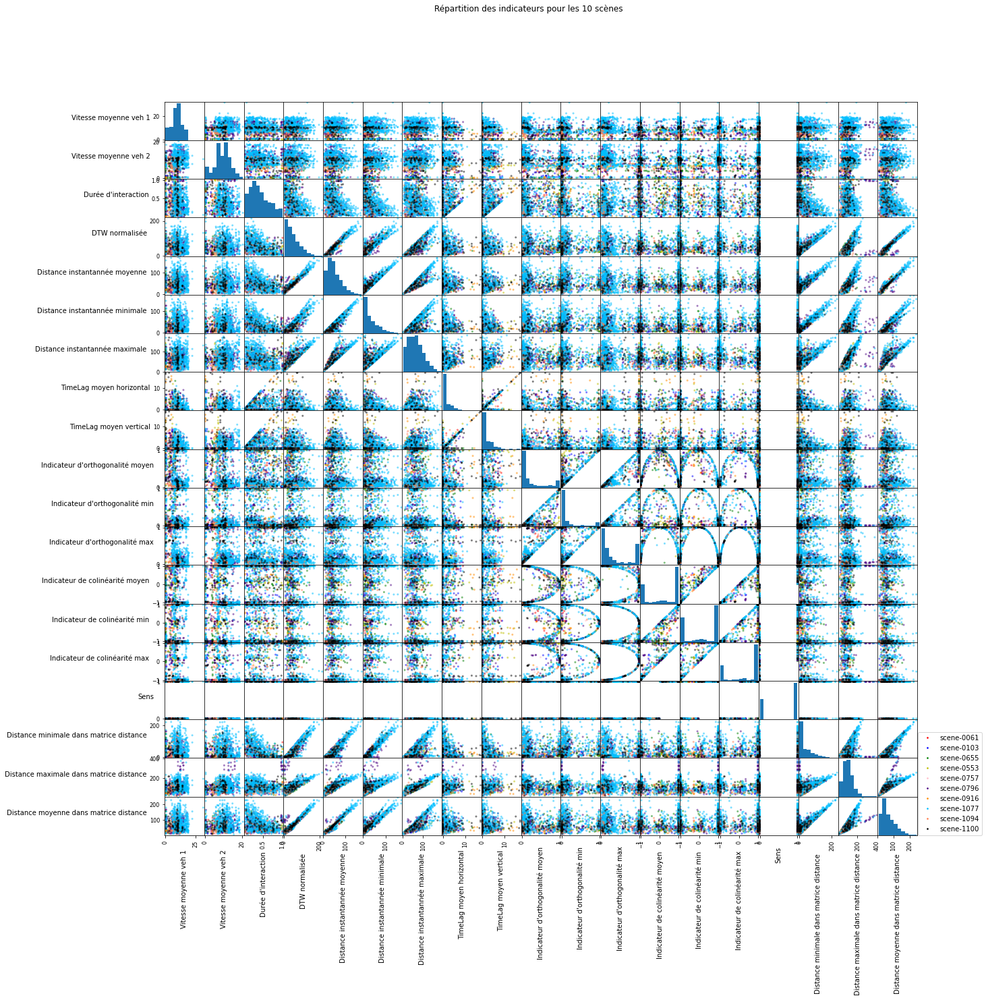

In [56]:
## On va tracer les courbes des colonnes les unes par rapport aux autres, 

DF_finale = DF_finale.dropna()
# On converti le type des colonnes en float d'abbord
DF_finale[list(DF_finale.columns[5:])] = DF_finale[list(DF_finale.columns[5:])].apply(pd.to_numeric)

colors = DF_finale['scene'].replace({'scene-0061':'r', 'scene-0103': 'b', 'scene-0655':'g', 'scene-0553':'y','scene-0757':'pink','scene-0796':'indigo','scene-0916':'darkorange','scene-1077':'deepskyblue','scene-1094':'coral','scene-1100':'black'})

axes = pd.plotting.scatter_matrix(DF_finale,c=colors,cmap='viridis',label = list(DF_finale['scene'].unique()),figsize=(20,20))
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')
plt.suptitle('Répartition des indicateurs pour les 10 scènes')

handles = [plt.plot([],[],c=['r','b','g','y','pink','indigo','darkorange','deepskyblue','coral','black'][i], ls="", marker=".",markersize=np.sqrt(10))[0] for i in range(10)]
labels=list(DF_finale['scene'].unique())
plt.legend(handles, labels, loc=(1.02,0))

plt.tight_layout()
plt.gcf().subplots_adjust(wspace=0, hspace=0)
plt.show()

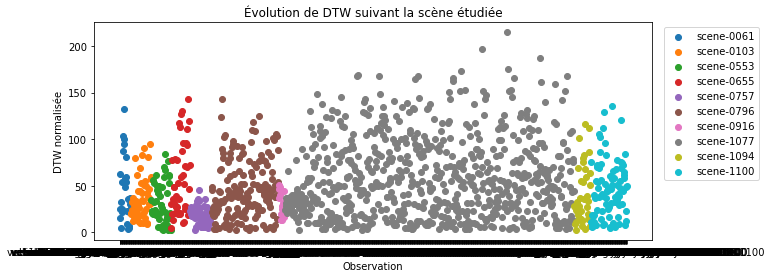

In [57]:
# On trace la figure 
fig, ax = plt.subplots(figsize=(10,4))
for key, grp in DF_finale.groupby(['scene']):
    ax.scatter(grp.index, grp['DTW normalisée'], label=key)

ax.legend(bbox_to_anchor=(1.2, 1.0),loc='best')
plt.xlabel('Observation')
plt.ylabel('DTW normalisée')
plt.title('Évolution de DTW suivant la scène étudiée')
plt.show()

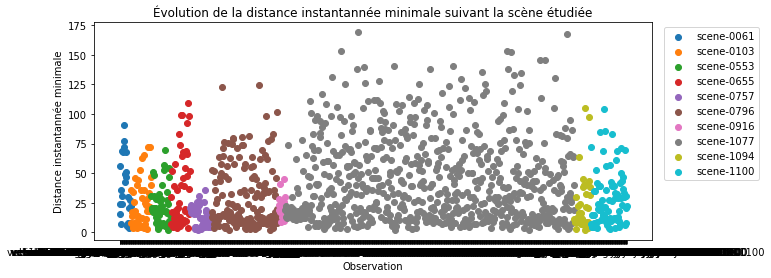

In [58]:
# On trace la figure 
fig, ax = plt.subplots(figsize=(10,4))
for key, grp in DF_finale.groupby(['scene']):
    ax.scatter(grp.index, grp['Distance instantannée minimale'], label=key)

ax.legend(bbox_to_anchor=(1.2, 1.0),loc='best')
plt.xlabel('Observation')
plt.ylabel('Distance instantannée minimale')
plt.title('Évolution de la distance instantannée minimale suivant la scène étudiée')
plt.show()

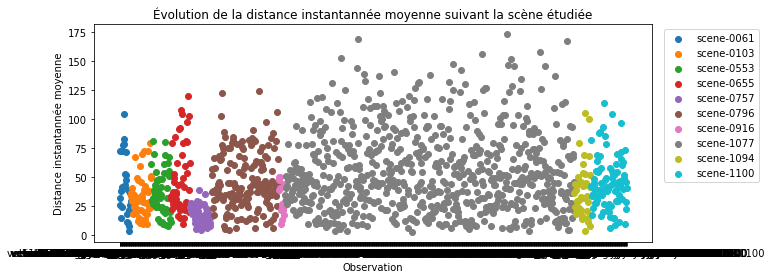

In [59]:
# On trace la figure 
fig, ax = plt.subplots(figsize=(10,4))
for key, grp in DF_finale.groupby(['scene']):
    ax.scatter(grp.index, grp['Distance instantannée moyenne'], label=key)

ax.legend(bbox_to_anchor=(1.2, 1.0),loc='best')
plt.xlabel('Observation')
plt.ylabel('Distance instantannée moyenne')
plt.title('Évolution de la distance instantannée moyenne suivant la scène étudiée')
plt.show()

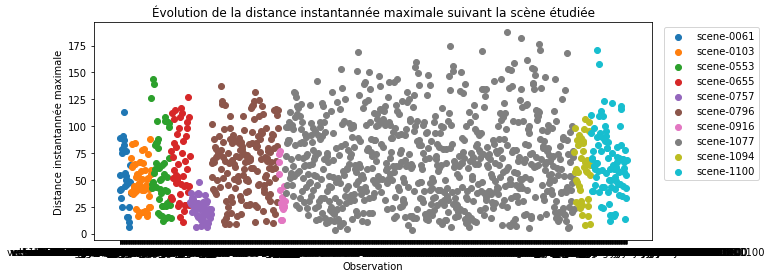

In [60]:
# On trace la figure 
fig, ax = plt.subplots(figsize=(10,4))
for key, grp in DF_finale.groupby(['scene']):
    ax.scatter(grp.index, grp['Distance instantannée maximale'], label=key)

ax.legend(bbox_to_anchor=(1.2, 1.0),loc='best')
plt.xlabel('Observation')
plt.ylabel('Distance instantannée maximale')
plt.title('Évolution de la distance instantannée maximale suivant la scène étudiée')
plt.show()

#### DBSCAN

In [61]:
# Test sur la scène 61 
df_61_finale = pd.concat([indicateur_similarite('scene-0061'),indicateur_similarite_entre_veh('scene-0061')])
df_61_finale

,scene,Catégorie Véhicule 1,Numéro Véhicule 1,Catégorie Véhicule 2,Numéro Véhicule 2,Vitesse moyenne veh 1,Vitesse moyenne veh 2,Durée d'interaction,DTW normalisée,Distance instantannée moyenne,...,Indicateur d'orthogonalité moyen,Indicateur d'orthogonalité min,Indicateur d'orthogonalité max,Indicateur de colinéarité moyen,Indicateur de colinéarité min,Indicateur de colinéarité max,Sens,Distance minimale dans matrice distance,Distance maximale dans matrice distance,Distance moyenne dans matrice distance
vehicle.bus.rigid 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.bus.rigid,1,8.564618,9.255912,0.107044,62.784244,72.53295,...,0.011213,0.000274,0.03069,-0.999907,-1.0,-0.999529,0,53.479254,89.795179,71.922482
vehicle.car 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,1,8.862925,9.459852,0.054837,24.953401,32.364935,...,0.076894,0.063754,0.084432,-0.997027,-0.997966,-0.996429,0,20.739661,38.735602,29.578912
vehicle.car 2/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,2,6.155384,5.78235,0.600504,15.844434,26.217761,...,0.393398,0.092346,0.996106,0.831509,0.088161,0.995727,1,6.787707,88.709867,33.192634
vehicle.car 3/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,3,8.564618,11.088804,0.107044,32.294648,38.263151,...,0.059173,0.036886,0.078373,0.99819,0.996924,0.999319,1,23.975892,64.147662,43.973192
vehicle.car 4/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,4,4.77538,3.222342,1.0,5.050621,14.823187,...,0.035928,0.00008,0.140614,0.998951,0.990065,1.0,1,0.037589,77.803221,25.983685
vehicle.car 5/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,5,7.172089,8.206919,0.313245,53.675439,72.63744,...,0.108906,0.055613,0.226646,0.993171,0.973977,0.998452,1,34.032382,125.55427,78.287636
vehicle.truck 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.truck,1,6.155384,6.667293,0.600504,21.272493,41.538593,...,0.384397,0.082333,0.993241,0.827521,0.116069,0.996605,1,8.451707,100.054996,43.899822
vehicle.bus.rigid 1 /vehicle.car 1 scene-0061,scene-0061,vehicle.bus.rigid,1,vehicle.car,1,9.292036,9.459852,0.512281,25.241409,24.413224,...,0.095966,0.094351,0.09758,0.995383,0.995228,0.995539,1,24.361226,43.998729,34.240274
vehicle.bus.rigid 1 /vehicle.car 2 scene-0061,scene-0061,vehicle.bus.rigid,1,vehicle.car,2,9.255912,1.716876,0.178257,86.880351,73.164276,...,0.129876,0.086251,0.169561,-0.991082,-0.996273,-0.98552,0,88.855342,111.232764,99.935308
vehicle.bus.rigid 1 /vehicle.car 3 scene-0061,scene-0061,vehicle.bus.rigid,1,vehicle.car,3,9.255912,11.088804,1.0,102.953185,77.678069,...,0.077156,0.067537,0.095662,-0.996959,-0.997717,-0.995414,0,94.281594,135.873285,115.322443


In [62]:
# Normalisation de la df 
from sklearn.preprocessing import StandardScaler
df_61_normalise = df_61_finale.copy()
df_61_normalise[list(df_61_normalise.columns[5:])] = StandardScaler().fit_transform(df_61_normalise[list(df_61_normalise.columns[5:])])
df_61_normalise

,scene,Catégorie Véhicule 1,Numéro Véhicule 1,Catégorie Véhicule 2,Numéro Véhicule 2,Vitesse moyenne veh 1,Vitesse moyenne veh 2,Durée d'interaction,DTW normalisée,Distance instantannée moyenne,...,Indicateur d'orthogonalité moyen,Indicateur d'orthogonalité min,Indicateur d'orthogonalité max,Indicateur de colinéarité moyen,Indicateur de colinéarité min,Indicateur de colinéarité max,Sens,Distance minimale dans matrice distance,Distance maximale dans matrice distance,Distance moyenne dans matrice distance
vehicle.bus.rigid 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.bus.rigid,1,0.294863,0.909173,-0.875817,0.527691,1.102457,...,-0.81032,-1.384717,-0.755585,-1.145787,-1.040944,-1.158541,-1.154701,0.344287,0.212267,0.37083
vehicle.car 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,1,0.419373,0.981278,-1.055099,-0.589057,-0.420473,...,-0.434187,0.566361,-0.59924,-1.142737,-1.038688,-1.1554,-1.154701,-0.507344,-1.264477,-0.817224
vehicle.car 2/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,2,-0.710722,-0.318936,0.818741,-0.857949,-0.653537,...,1.378322,1.44514,2.05299,0.793067,0.165572,0.863387,0.866025,-0.870266,0.180877,-0.715832
vehicle.car 3/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,3,0.294863,1.557208,-0.875817,-0.372347,-0.196848,...,-0.535674,-0.259445,-0.616867,0.969526,1.173179,0.867028,0.866025,-0.423163,-0.52951,-0.413357
vehicle.car 4/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,4,-1.286719,-1.224049,2.190626,-1.176577,-1.08555,...,-0.668788,-1.390681,-0.435795,0.970331,1.165573,0.867717,0.866025,-1.045852,-0.134564,-0.918097
vehicle.car 5/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,5,-0.286362,0.538293,-0.167715,0.258803,1.106418,...,-0.250865,0.316153,-0.185513,0.964212,1.147736,0.866149,0.866025,-0.16157,1.24649,0.54942
vehicle.truck 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.truck,1,-0.710722,-0.006056,0.818741,-0.697716,-0.072663,...,1.326775,1.137397,2.044654,0.788844,0.196517,0.864277,0.866025,-0.826982,0.509001,-0.415415
vehicle.bus.rigid 1 /vehicle.car 1 scene-0061,scene-0061,vehicle.bus.rigid,1,vehicle.car,1,0.598479,0.981278,0.515781,-0.580555,-0.721954,...,-0.324973,1.506776,-0.560989,0.966554,1.171298,0.863197,0.866025,-0.413139,-1.112257,-0.686438
vehicle.bus.rigid 1 /vehicle.car 2 scene-0061,scene-0061,vehicle.bus.rigid,1,vehicle.car,2,0.583401,-1.75632,-0.631269,1.238996,1.126393,...,-0.130781,1.257819,-0.351582,-1.136444,-1.036812,-1.144345,-1.154701,1.264499,0.832284,1.156798
vehicle.bus.rigid 1 /vehicle.car 3 scene-0061,scene-0061,vehicle.bus.rigid,1,vehicle.car,3,0.583401,1.557208,2.190626,1.713458,1.297529,...,-0.43269,0.682636,-0.566569,-1.142665,-1.038412,-1.154371,-1.154701,1.405648,1.544936,1.588522


In [63]:
from sklearn.cluster import DBSCAN

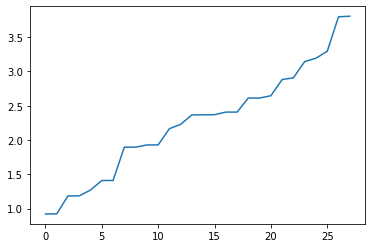

In [64]:
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import numpy as np

## On cherche le epsilon optimal 
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(df_61_normalise[list(df_61_normalise.columns[5:])])
distances, indices = nbrs.kneighbors(df_61_normalise[list(df_61_normalise.columns[5:])])
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [65]:
distances[24]

3.192241895661928

In [66]:
# https://datascientest.com/machine-learning-clustering-dbscan
# On choisit epsilon de tel sorte que que 90% des observations aient une distance 
# au proche voisin inférieure à ε, ici on prend epsilon=35

In [67]:
# Fonction qui renvoie la liste des numéros de clusters des observations
def cluster (X,eps, min_samples):
    db= DBSCAN(eps=eps, min_samples=min_samples).fit(X)
    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    labels=db.labels_
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)
    return labels
    

In [68]:
# Fonction qui trace les courbes des véhicules présents dans chaque clusters et 
# donne en légende les couples correspondants

from sklearn.preprocessing import StandardScaler

def cluster_dbscan(df,epsilon,nb_voisin):
    # On supprime les valeurs vides
    df = df.dropna()
    
    # On normalise les indicateurs 
    df[list(df.columns[5:])] = StandardScaler().fit_transform(df[list(df.columns[5:])])
    
    labels = cluster (df[list(df.columns[5:])],epsilon,nb_voisin)
    df['clusters']=labels
    
    # ON met les labels dans la dataframe
    df = df.sort_values(by=['clusters'])
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(labels)))
    
    fig, axs = plt.subplots(len(labels_unique))
    #fig.suptitle("Tracé des clusters obtenus avec l'algorithme DSCAN")
    plt.gcf().set_size_inches(15, 25)
    #plt.gcf().subplots_adjust(left = 0.3, bottom = 0.3,right = 0.7, top = 0.9, wspace = 0, hspace = 0.5)
    
    for s in labels_unique:
        
        # On s'occupe d'un cluster 
        df_bis = df[df['clusters']==s]
        
        nb_ligne = len(df_bis)
        
        Texte_legend = 'Couple de trajectoires \n'
        
        for j in range(0,nb_ligne):
            current_ligne = df_bis.iloc[j]
            
            scene_name = current_ligne['scene']
            veh1 = current_ligne['Catégorie Véhicule 1'] # catégorie du véhicule 1 
            veh2 = current_ligne['Catégorie Véhicule 2']# ici on a le nom de la catégorie 
            num_veh2 = current_ligne['Numéro Véhicule 2']-1 # Numéro du véhicule 2 
            
            scene_token = nusc.field2token('scene','name',scene_name)[0]
            sample_token = nusc.field2token('sample','scene_token',scene_token)# Ensemble des token des échantillons de la scene 
            
            # Ensemble des sample_annotation de la scène :

            sample_annotation_token = []
            for k in sample_token : 
                L = nusc.field2token('sample_annotation','sample_token',k)
                sample_annotation_token = sample_annotation_token + L

            # On créé la liste des token des instances présents dans les sample_annotation
            L_instance_token = []
            for k in sample_annotation_token :
                exemple = nusc.get('sample_annotation', k)
                L_instance_token.append(exemple['instance_token'])
            # Puisque pour un même objet, on peut avoir plusieurs annotations, on supprime les doublons de L
            L_instance_token = list(set(L_instance_token))
            
            ## Véhicule 1 
            if veh1 == 'vehicle.ego':              
                num_veh1_legend = ''
                Liste_ego_poses = get_poses(scene_token) 
                X1 =[]
                Y1 =[]
                Z1 =[]
                T1 = [] # liste des timestamps
                for k in range(0,len(Liste_ego_poses)):
                    X1.append(Liste_ego_poses[k]['translation'][0])
                    Y1.append(Liste_ego_poses[k]['translation'][1])
                    Z1.append(Liste_ego_poses[k]['translation'][2])
                    T1.append(Liste_ego_poses[k]['timestamp'])
            else :
                num_veh1 = current_ligne['Numéro Véhicule 1']-1 #numéro du véhicule dans la liste de tous les véh de cette catégo
                num_veh1_legend = str(num_veh1+1)
                
                catego_name = veh1
                catego_token = nusc.field2token('category','name',catego_name)
                category = nusc.get('category',catego_token[0])
                
                # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                L=[]
                for k in L_instance_category : 
                    instance_category = nusc.get('instance',k)
                    nbr_annotations = instance_category['nbr_annotations']
                    if nbr_annotations == 1:
                        L.append([instance_category['first_annotation_token']])
                    else : 
                        H = []
                        first_token = instance_category['first_annotation_token']
                        last_token = instance_category['last_annotation_token']
                        current_token = first_token 

                        i = 0 
                        while i!= nbr_annotations :
                            current_ann = nusc.get('sample_annotation', current_token)
                            H.append(current_ann['token'])
                            current_token = current_ann['next'] #On passe au suivant
                            i+=1
                        L.append(H)
                # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                # les token des sample_annotation pour un élément de cette catégorie. 

                # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                # on va pouvoir récupérer leurs positions 

                X = []
                Y = []
                Z = []
                T_time = []
                for k in L :
                    x = []
                    y = []
                    z = []
                    t = []
                    for i in k :
                        sample_annotation = nusc.get('sample_annotation',i)
                        x.append(sample_annotation['translation'][0])
                        y.append(sample_annotation['translation'][1])
                        z.append(sample_annotation['translation'][2])
                        t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                    X.append(x)
                    Y.append(y)
                    Z.append(z)
                    T_time.append(t)

                Immo, Mobile = immobile(X,Y)

                # On conserve uniquement les objets mobiles 
                X_mobile=[X[i] for i in Mobile]
                Y_mobile=[Y[i] for i in Mobile]
                Z_mobile=[Z[i] for i in Mobile]
                T_mobile = [T_time[i] for i in Mobile]
                
                X1 =X_mobile[num_veh1] 
                Y1 =Y_mobile[num_veh1] 
                Z1 =Z_mobile[num_veh1] 
                T1 =T_mobile[num_veh1] 
            
            catego_name = veh2
            catego_token = nusc.field2token('category','name',catego_name)
            category = nusc.get('category',catego_token[0])
                
            # Ensemble des instances appartenant à la fois à la scène et à la catégorie
            L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
            L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

            L=[]
            for k in L_instance_category : 
                instance_category = nusc.get('instance',k)
                nbr_annotations = instance_category['nbr_annotations']
                if nbr_annotations == 1:
                    L.append([instance_category['first_annotation_token']])
                else : 
                    H = []
                    first_token = instance_category['first_annotation_token']
                    last_token = instance_category['last_annotation_token']
                    current_token = first_token 

                    i = 0 
                    while i!= nbr_annotations :
                        current_ann = nusc.get('sample_annotation', current_token)
                        H.append(current_ann['token'])
                        current_token = current_ann['next'] #On passe au suivant
                        i+=1
                    L.append(H)
                # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                # les token des sample_annotation pour un élément de cette catégorie. 

                # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                # on va pouvoir récupérer leurs positions 

            X = []
            Y = []
            Z = []
            T_time = []
            for k in L :
                x = []
                y = []
                z = []
                t = []
                for i in k :
                    sample_annotation = nusc.get('sample_annotation',i)
                    x.append(sample_annotation['translation'][0])
                    y.append(sample_annotation['translation'][1])
                    z.append(sample_annotation['translation'][2])
                    t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                X.append(x)
                Y.append(y)
                Z.append(z)
                T_time.append(t)

            Immo, Mobile = immobile(X,Y)

            # On conserve uniquement les objets mobiles 
            X_mobile=[X[i] for i in Mobile]
            Y_mobile=[Y[i] for i in Mobile]
            Z_mobile=[Z[i] for i in Mobile]
            T_mobile = [T_time[i] for i in Mobile]
                
            X2 =X_mobile[num_veh2] 
            Y2 =Y_mobile[num_veh2] 
            Z2 =Z_mobile[num_veh2] 
            T2 =T_mobile[num_veh2] 
        
            axs[s].plot(X1,Y1)
            axs[s].text(X1[0], Y1[0],veh1 + ' '+num_veh1_legend,fontsize=8)
            axs[s].plot(X2,Y2)
            axs[s].text(X2[0], Y2[0],veh2 + ' '+str(num_veh2+1),fontsize=8)
            #axs[s].legend(loc='best')
            axs[s].set_title('Cluster '+str(s))
            axs[s].plot([],[],'w',label = veh1 + ' '+num_veh1_legend +'/'+veh2 + ' '+str(num_veh2+1) )
    
        axs[s].legend(loc='best')

    plt.tight_layout()
    plt.show()

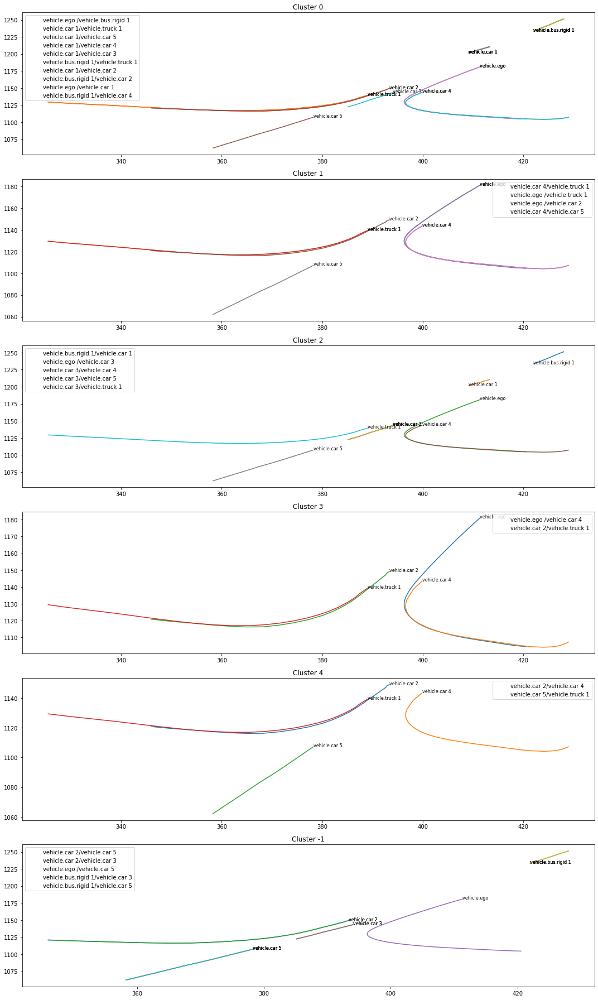

In [69]:
cluster_dbscan(df_61_finale,3,2)

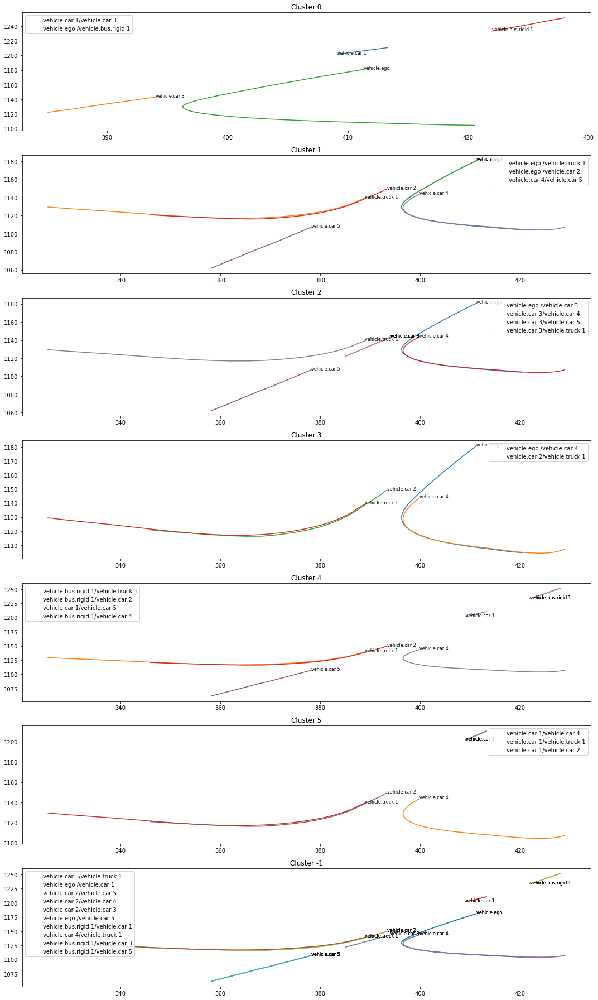

In [70]:
cluster_dbscan(df_61_finale,2.5,2)

In [71]:
import statistics

In [72]:
# Fonction qui renvoie une df avec pour chaque cluster

def liste_cluster_dbscan(df,epsilon,nb_voisin):
    
    df_cluster = pd.DataFrame()
    
    df = df.dropna()
    
    # On normalise les indicateurs 
    df_normalise = df.copy()
    df_normalise[list(df_normalise.columns[5:])] = StandardScaler().fit_transform(df_normalise[list(df_normalise.columns[5:])])
    
    labels = cluster (df_normalise[list(df_normalise.columns[5:])],epsilon,nb_voisin)
    df['clusters']=labels
    
    # ON met les labels dans la dataframe
    df = df.sort_values(by=['clusters'])
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(labels)))
    
    Colonne_index = ['Cluster '+str(labels_unique[k]) for k in range(0,len(labels_unique))]
    df_cluster['Cluster']=Colonne_index
    df_cluster = df_cluster.set_index('Cluster') # On met la liste des noms des clusters en index
    
    # ON prépare les listes qui seront dans la df_cluster
    L_liste_traj = []
    L_DTW_moy = []
    L_DTW_min = []
    L_DTW_max =[]
    L_duree_inter = []
    L_indic_ortho_moy = []
    L_indic_coli_moy = []
    
    for s in labels_unique:
        
        # On s'occupe d'un cluster 
        df_bis = df[df['clusters']==s]
        nb_ligne = len(df_bis)
        
        L_cluster_s =[]
        
        for j in range(0,nb_ligne):
            current_ligne = df_bis.iloc[j]
            L_cluster_s.append(current_ligne.name) # Nom du couple de traj 
        
        L_liste_traj.append(L_cluster_s)
        
        L_DTW_moy.append(np.mean(df_bis['DTW normalisée']))
        L_DTW_min.append(min(df_bis['DTW normalisée']))
        L_DTW_max.append(max(df_bis['DTW normalisée']))
        L_duree_inter.append(np.mean(df_bis["Durée d'interaction"]))
        L_indic_ortho_moy.append(np.mean(df_bis["Indicateur d'orthogonalité moyen"]))
        L_indic_coli_moy.append(np.mean(df_bis['Indicateur de colinéarité moyen']))
    
    df_cluster['Liste des trajectoires appartenant au cluster'] = L_liste_traj
    df_cluster['DTW moyen'] = L_DTW_moy
    df_cluster['DTW minimum'] = L_DTW_min
    df_cluster['DTW maximum'] = L_DTW_max
    df_cluster["Durée d'interaction moyenne"] = L_duree_inter
    df_cluster["Indicateur d'orthogonalité moyen" ] = L_indic_ortho_moy
    df_cluster["Indicateur de colinéarité moyen" ] = L_indic_coli_moy
    
    return df_cluster

In [73]:
df_cluster = liste_cluster_dbscan(df_61_finale,3,2)
df_cluster

,Liste des trajectoires appartenant au cluster,DTW moyen,DTW minimum,DTW maximum,Durée d'interaction moyenne,Indicateur d'orthogonalité moyen,Indicateur de colinéarité moyen
Cluster,,,,,,,
Cluster -1,"[vehicle.car 2 /vehicle.car 5 scene-0061, vehi...",66.707620,8.968574,132.050158,0.454306,0.088764,0.197030
Cluster 0,"[vehicle.bus.rigid 1/ego dans scene-0061, vehi...",67.070035,24.953401,99.637751,0.146691,0.059117,-0.997227
Cluster 1,"[vehicle.car 4 /vehicle.truck 1 scene-0061, ve...",26.205031,15.844434,36.836047,0.528689,0.463258,0.732269
Cluster 2,[vehicle.bus.rigid 1 /vehicle.car 1 scene-0061...,18.156757,4.256271,32.294648,0.232603,0.069766,0.996290
Cluster 3,"[vehicle.car 4/ego dans scene-0061, vehicle.ca...",4.084715,3.118809,5.050621,1.000000,0.046449,0.997970
Cluster 4,"[vehicle.car 2 /vehicle.car 4 scene-0061, vehi...",24.709498,22.840678,26.578317,0.561070,0.473105,0.693761


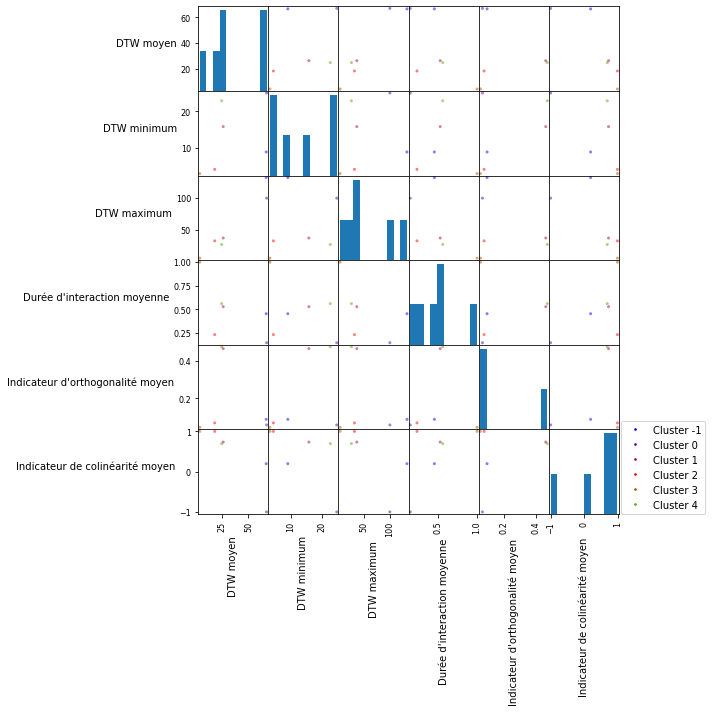

In [74]:
## On va tracer les courbes des colonnes les unes par rapport aux autres, 

# On converti le type des colonnes en float d'abbord
df_cluster[list(df_cluster.columns[1:])] = df_cluster[list(df_cluster.columns[1:])].apply(pd.to_numeric)
axes = pd.plotting.scatter_matrix(df_cluster,c=[plt.cm.brg(i/len(df_cluster))for i in range(len(df_cluster))],label = list(df_cluster.index),figsize=(10,10))
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')

handles = [plt.plot([],[],color=plt.cm.brg(i/len(df_cluster)), ls="", marker=".",markersize=np.sqrt(10))[0] for i in range(len(df_cluster))]
labels=list(df_cluster.index)
plt.legend(handles, labels, loc=(1.02,0))

plt.tight_layout()
plt.gcf().subplots_adjust(wspace=0, hspace=0)
plt.show()


##### Test en supprimant des variables de la df

In [75]:
df_essaie = pd.concat([indicateur_similarite('scene-0061'),indicateur_similarite_entre_veh('scene-0061')])[['scene',
 'Catégorie Véhicule 1','Numéro Véhicule 1','Catégorie Véhicule 2', 'Numéro Véhicule 2',                                                                                                                                                                                                                                                                                                                                                                                                               
 "Durée d'interaction",
 'DTW normalisée',
 'Distance minimale dans matrice distance',
 'Distance maximale dans matrice distance',
 'Distance moyenne dans matrice distance']]

In [76]:
# On normalise les indicateurs 
df_essaie_normalise = df_essaie.copy()
df_essaie_normalise[list(df_essaie_normalise.columns[5:])] = StandardScaler().fit_transform(df_essaie_normalise[list(df_essaie_normalise.columns[5:])])

2.0850477545115744


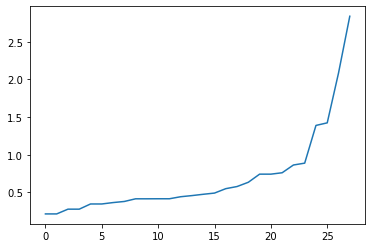

In [77]:
##On cherche le epsilon optimal 
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(df_essaie_normalise[list(df_essaie_normalise.columns[5:])])
distances, indices = nbrs.kneighbors(df_essaie_normalise[list(df_essaie_normalise.columns[5:])])
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)
print(distances[int(0.95*len(df_essaie_normalise))])

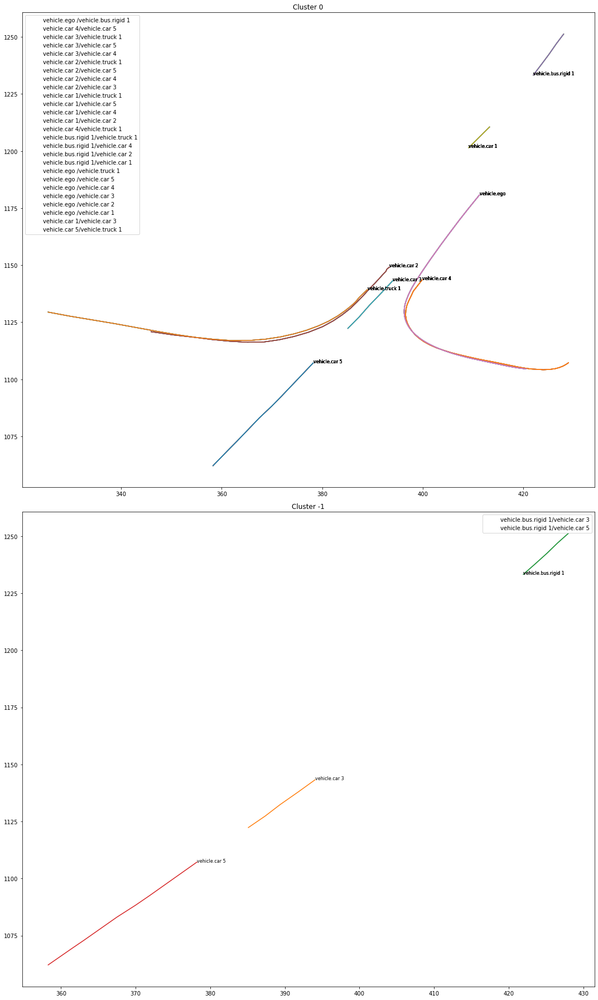

In [78]:
cluster_dbscan(df_essaie,1.7,2)

In [79]:
## On garde uniquement les indicateurs moyens 
df_essaie2 = pd.concat([indicateur_similarite('scene-0061'),indicateur_similarite_entre_veh('scene-0061')])[['scene',
 'Catégorie Véhicule 1',
 'Numéro Véhicule 1',
 'Catégorie Véhicule 2',
 'Numéro Véhicule 2',
 'Vitesse moyenne veh 1',
 'Vitesse moyenne veh 2',
 "Durée d'interaction",
 'DTW normalisée',
 'Distance instantannée moyenne',
 'TimeLag moyen horizontal',
 'TimeLag moyen vertical',
 "Indicateur d'orthogonalité moyen",
 'Indicateur de colinéarité moyen',
 'Distance moyenne dans matrice distance']]

In [80]:
# On normalise les indicateurs 
df_essaie2_normalise = df_essaie2.copy()
df_essaie2_normalise[list(df_essaie2_normalise.columns[5:])] = StandardScaler().fit_transform(df_essaie2_normalise[list(df_essaie2_normalise.columns[5:])])

2.7227896486552052


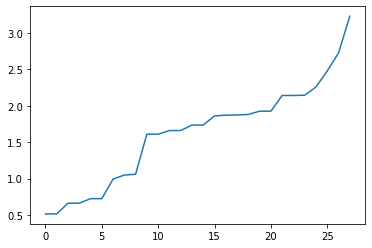

In [81]:
##On cherche le epsilon optimal 
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(df_essaie2_normalise[list(df_essaie2_normalise.columns[5:])])
distances, indices = nbrs.kneighbors(df_essaie2_normalise[list(df_essaie2_normalise.columns[5:])])
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)
print(distances[int(0.95*len(df_essaie2_normalise))])

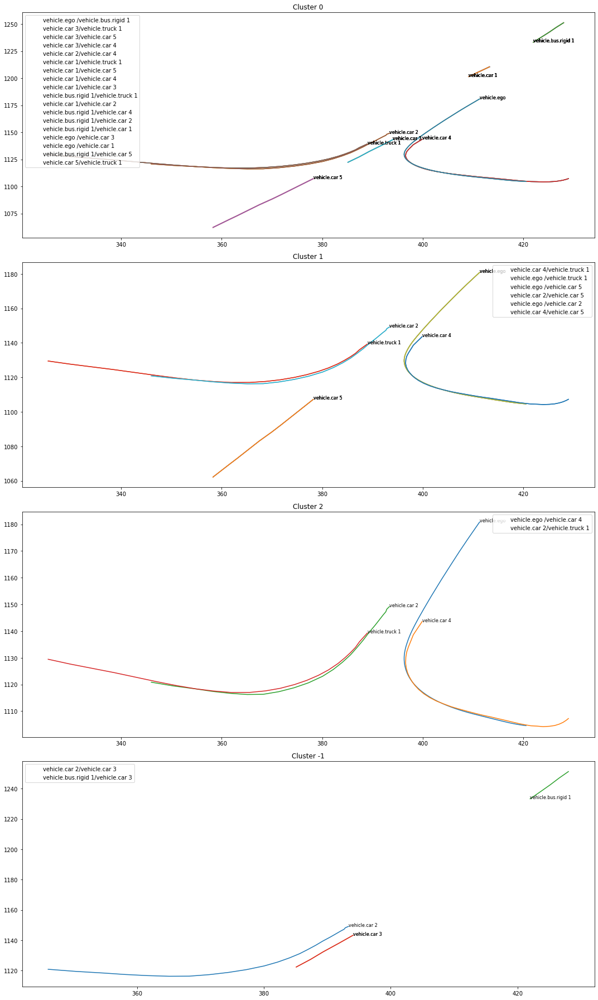

In [82]:
cluster_dbscan(df_essaie2,2.5,2)

In [83]:
df_essaie3 = pd.concat([indicateur_similarite('scene-0061'),indicateur_similarite_entre_veh('scene-0061')])[['scene',
 'Catégorie Véhicule 1',
 'Numéro Véhicule 1',
 'Catégorie Véhicule 2',
 'Numéro Véhicule 2',
 'DTW normalisée',
 'Distance instantannée moyenne',
 'Distance instantannée minimale',
 'Distance instantannée maximale',
 "Indicateur d'orthogonalité moyen",
 "Indicateur d'orthogonalité min",
 "Indicateur d'orthogonalité max",
 'Indicateur de colinéarité moyen',
 'Indicateur de colinéarité min',
 'Indicateur de colinéarité max',
 'Distance minimale dans matrice distance',
 'Distance maximale dans matrice distance',
 'Distance moyenne dans matrice distance']]

In [84]:
# On normalise les indicateurs 
df_essaie3_normalise = df_essaie3.copy()
df_essaie3_normalise[list(df_essaie3_normalise.columns[5:])] = StandardScaler().fit_transform(df_essaie3_normalise[list(df_essaie3_normalise.columns[5:])])

2.550951888519681


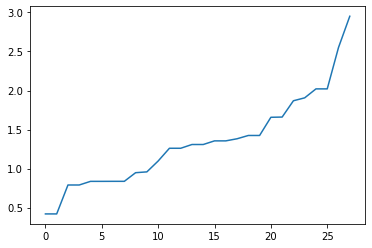

In [85]:
##On cherche le epsilon optimal 
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(df_essaie3_normalise[list(df_essaie3_normalise.columns[5:])])
distances, indices = nbrs.kneighbors(df_essaie3_normalise[list(df_essaie3_normalise.columns[5:])])
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)
print(distances[int(0.95*len(df_essaie2_normalise))])

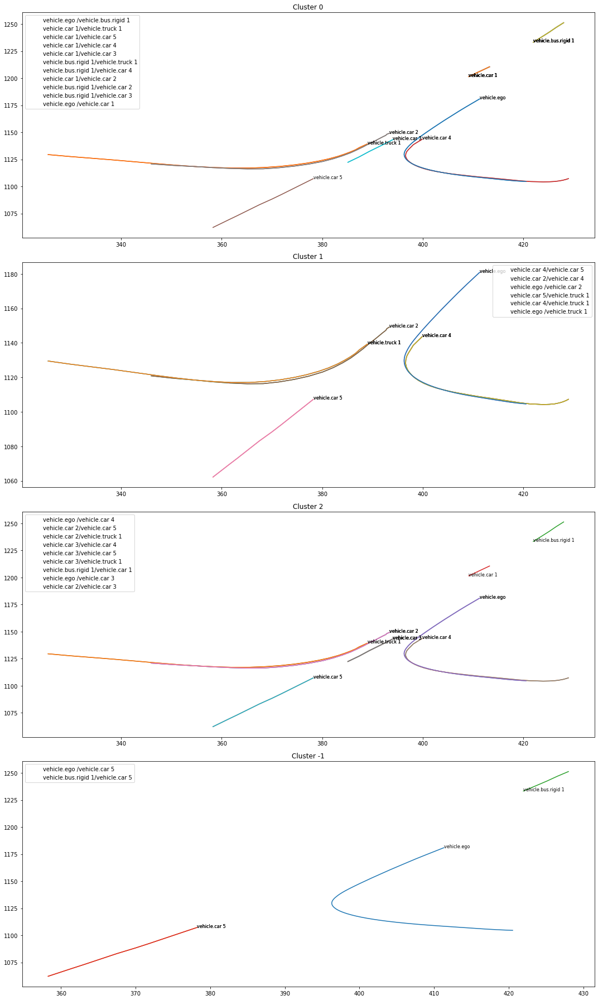

In [86]:
cluster_dbscan(df_essaie3,2.5,2)

##### Test sur d'autres scènes

In [87]:
# Test sur la scène 757 
df_757_finale = pd.concat([indicateur_similarite('scene-0757'),indicateur_similarite_entre_veh('scene-0757')])
df_757_finale = df_757_finale.dropna()

/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in double_scalars
/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:45: RuntimeWarning: invalid value encountered in double_scalars
/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [88]:
# Normalisation de la df 
from sklearn.preprocessing import StandardScaler
df_757_normalise = df_757_finale.copy()
df_757_normalise[list(df_757_normalise.columns[5:])] = StandardScaler().fit_transform(df_757_normalise[list(df_757_normalise.columns[5:])])

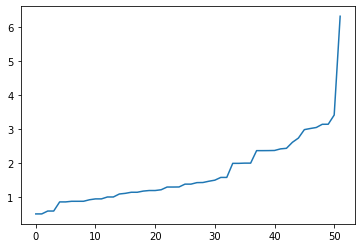

In [89]:
## On cherche le epsilon optimal 
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(df_757_normalise[list(df_757_normalise.columns[5:])])
distances, indices = nbrs.kneighbors(df_757_normalise[list(df_757_normalise.columns[5:])])
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

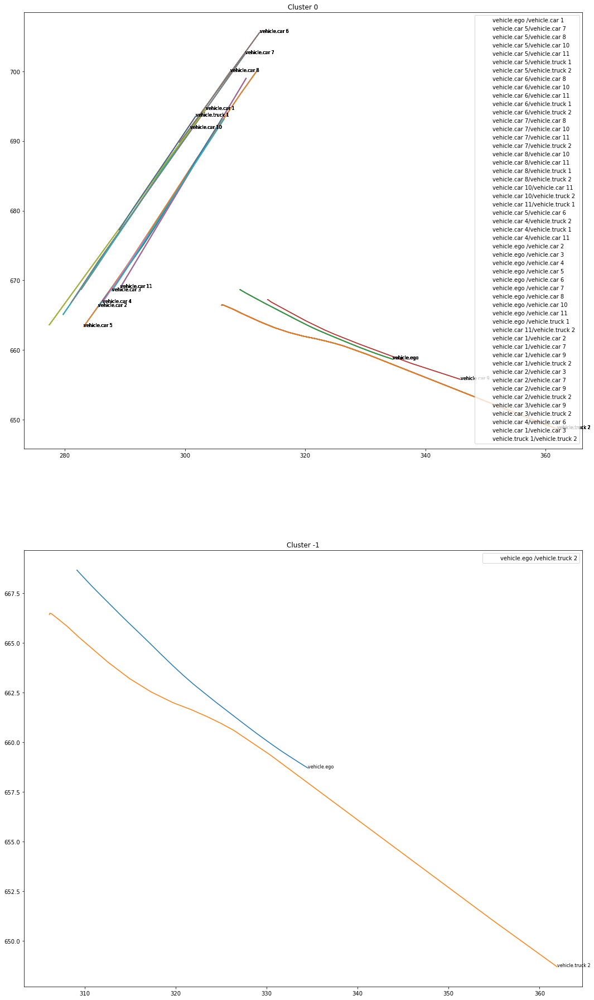

In [90]:
cluster_dbscan(df_757_finale,4,2)

In [91]:
# Les résultats sont pas faux la, puisque dans cette scène, on a que du car following

##### Test sur la DF_finale

In [92]:
DF_finale

,scene,Catégorie Véhicule 1,Numéro Véhicule 1,Catégorie Véhicule 2,Numéro Véhicule 2,Vitesse moyenne veh 1,Vitesse moyenne veh 2,Durée d'interaction,DTW normalisée,Distance instantannée moyenne,...,Indicateur d'orthogonalité moyen,Indicateur d'orthogonalité min,Indicateur d'orthogonalité max,Indicateur de colinéarité moyen,Indicateur de colinéarité min,Indicateur de colinéarité max,Sens,Distance minimale dans matrice distance,Distance maximale dans matrice distance,Distance moyenne dans matrice distance
vehicle.bus.rigid 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.bus.rigid,1,8.564618,9.255912,0.107044,62.784244,72.532950,...,0.011213,0.000274,0.030690,-0.999907,-1.000000,-0.999529,0,53.479254,89.795179,71.922482
vehicle.car 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,1,8.862925,9.459852,0.054837,24.953401,32.364935,...,0.076894,0.063754,0.084432,-0.997027,-0.997966,-0.996429,0,20.739661,38.735602,29.578912
vehicle.car 2/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,2,6.155384,5.782350,0.600504,15.844434,26.217761,...,0.393398,0.092346,0.996106,0.831509,0.088161,0.995727,1,6.787707,88.709867,33.192634
vehicle.car 3/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,3,8.564618,11.088804,0.107044,32.294648,38.263151,...,0.059173,0.036886,0.078373,0.998190,0.996924,0.999319,1,23.975892,64.147662,43.973192
vehicle.car 4/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,4,4.775380,3.222342,1.000000,5.050621,14.823187,...,0.035928,0.000080,0.140614,0.998951,0.990065,1.000000,1,0.037589,77.803221,25.983685
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
vehicle.car 11 /vehicle.car 12 scene-1100,scene-1100,vehicle.car,11,vehicle.car,12,9.349482,3.690104,0.076904,8.217678,9.876039,...,0.061951,0.014150,0.109751,-0.996929,-0.999900,-0.993959,0,8.300217,13.584201,10.010283
vehicle.car 11 /vehicle.motorcycle 1 scene-1100,scene-1100,vehicle.car,11,vehicle.motorcycle,1,10.122451,6.338455,0.384567,49.083647,46.260902,...,0.991064,0.983084,0.999991,0.123770,0.004190,0.183158,1,30.315200,104.297120,64.656899
vehicle.car 11 /vehicle.motorcycle 2 scene-1100,scene-1100,vehicle.car,11,vehicle.motorcycle,2,10.122451,11.181889,0.750012,12.551868,29.181995,...,0.014729,0.001593,0.041305,0.999805,0.999147,0.999999,1,0.498520,122.125142,46.623162
vehicle.car 12 /vehicle.motorcycle 2 scene-1100,scene-1100,vehicle.car,12,vehicle.motorcycle,2,3.024676,10.319906,0.269163,22.700355,22.612802,...,0.159685,0.014357,0.248427,-0.981828,-0.999897,-0.968651,0,11.473515,51.084325,28.863618


In [93]:
# On supprime les Nan de la DF
DF_finale_bis = DF_finale.dropna()
DF_finale_bis[DF_finale['scene']=='scene-0061']

,scene,Catégorie Véhicule 1,Numéro Véhicule 1,Catégorie Véhicule 2,Numéro Véhicule 2,Vitesse moyenne veh 1,Vitesse moyenne veh 2,Durée d'interaction,DTW normalisée,Distance instantannée moyenne,...,Indicateur d'orthogonalité moyen,Indicateur d'orthogonalité min,Indicateur d'orthogonalité max,Indicateur de colinéarité moyen,Indicateur de colinéarité min,Indicateur de colinéarité max,Sens,Distance minimale dans matrice distance,Distance maximale dans matrice distance,Distance moyenne dans matrice distance
vehicle.bus.rigid 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.bus.rigid,1,8.564618,9.255912,0.107044,62.784244,72.532950,...,0.011213,0.000274,0.030690,-0.999907,-1.000000,-0.999529,0,53.479254,89.795179,71.922482
vehicle.car 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,1,8.862925,9.459852,0.054837,24.953401,32.364935,...,0.076894,0.063754,0.084432,-0.997027,-0.997966,-0.996429,0,20.739661,38.735602,29.578912
vehicle.car 2/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,2,6.155384,5.782350,0.600504,15.844434,26.217761,...,0.393398,0.092346,0.996106,0.831509,0.088161,0.995727,1,6.787707,88.709867,33.192634
vehicle.car 3/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,3,8.564618,11.088804,0.107044,32.294648,38.263151,...,0.059173,0.036886,0.078373,0.998190,0.996924,0.999319,1,23.975892,64.147662,43.973192
vehicle.car 4/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,4,4.775380,3.222342,1.000000,5.050621,14.823187,...,0.035928,0.000080,0.140614,0.998951,0.990065,1.000000,1,0.037589,77.803221,25.983685
vehicle.car 5/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,5,7.172089,8.206919,0.313245,53.675439,72.637440,...,0.108906,0.055613,0.226646,0.993171,0.973977,0.998452,1,34.032382,125.554270,78.287636
vehicle.truck 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.truck,1,6.155384,6.667293,0.600504,21.272493,41.538593,...,0.384397,0.082333,0.993241,0.827521,0.116069,0.996605,1,8.451707,100.054996,43.899822
vehicle.bus.rigid 1 /vehicle.car 1 scene-0061,scene-0061,vehicle.bus.rigid,1,vehicle.car,1,9.292036,9.459852,0.512281,25.241409,24.413224,...,0.095966,0.094351,0.097580,0.995383,0.995228,0.995539,1,24.361226,43.998729,34.240274
vehicle.bus.rigid 1 /vehicle.car 2 scene-0061,scene-0061,vehicle.bus.rigid,1,vehicle.car,2,9.255912,1.716876,0.178257,86.880351,73.164276,...,0.129876,0.086251,0.169561,-0.991082,-0.996273,-0.985520,0,88.855342,111.232764,99.935308
vehicle.bus.rigid 1 /vehicle.car 3 scene-0061,scene-0061,vehicle.bus.rigid,1,vehicle.car,3,9.255912,11.088804,1.000000,102.953185,77.678069,...,0.077156,0.067537,0.095662,-0.996959,-0.997717,-0.995414,0,94.281594,135.873285,115.322443


In [94]:
# Normalisation de la df 
DF_finale_bis[list(DF_finale_bis.columns[5:])] = StandardScaler().fit_transform(DF_finale_bis[list(DF_finale_bis.columns[5:])])
DF_finale_bis

,scene,Catégorie Véhicule 1,Numéro Véhicule 1,Catégorie Véhicule 2,Numéro Véhicule 2,Vitesse moyenne veh 1,Vitesse moyenne veh 2,Durée d'interaction,DTW normalisée,Distance instantannée moyenne,...,Indicateur d'orthogonalité moyen,Indicateur d'orthogonalité min,Indicateur d'orthogonalité max,Indicateur de colinéarité moyen,Indicateur de colinéarité min,Indicateur de colinéarité max,Sens,Distance minimale dans matrice distance,Distance maximale dans matrice distance,Distance moyenne dans matrice distance
vehicle.bus.rigid 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.bus.rigid,1,-0.186538,-0.042379,-1.215985,0.307607,0.744937,...,-0.792781,-0.591876,-0.905056,-1.480942,-1.306565,-1.602463,-1.349242,0.278668,-0.278874,0.100822
vehicle.car 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,1,-0.121857,0.006585,-1.426388,-0.679300,-0.543249,...,-0.590446,-0.380498,-0.759999,-1.477544,-1.304270,-1.598774,-1.349242,-0.442308,-1.252047,-0.879561
vehicle.car 2/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,2,-0.708923,-0.876341,0.772727,-0.916929,-0.740388,...,0.384569,-0.285291,1.700726,0.679240,-0.078857,0.771790,0.741157,-0.749552,-0.299560,-0.795892
vehicle.car 3/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,3,-0.186538,0.397677,-1.215985,-0.487786,-0.354093,...,-0.645039,-0.469965,-0.776353,0.875842,0.946447,0.776065,0.741157,-0.371042,-0.767704,-0.546289
vehicle.car 4/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,4,-1.008144,-1.490969,2.382754,-1.198511,-1.105811,...,-0.716646,-0.592522,-0.608356,0.876740,0.938708,0.776875,0.741157,-0.898200,-0.507436,-0.962801
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
vehicle.car 11 /vehicle.car 12 scene-1100,scene-1100,vehicle.car,11,vehicle.car,12,-0.016359,-1.378665,-1.337455,-1.115891,-1.264466,...,-0.636481,-0.545671,-0.691658,-1.477429,-1.306452,-1.595835,-1.349242,-0.716244,-1.731421,-1.332634
vehicle.car 11 /vehicle.motorcycle 1 scene-1100,scene-1100,vehicle.car,11,vehicle.motorcycle,1,0.151241,-0.742827,-0.097529,-0.049806,-0.097606,...,2.225729,2.680728,1.711212,-0.155549,-0.173597,-0.195126,0.741157,-0.231440,-0.002474,-0.067398
vehicle.car 11 /vehicle.motorcycle 2 scene-1100,scene-1100,vehicle.car,11,vehicle.motorcycle,2,0.151241,0.420026,1.375268,-1.002823,-0.645325,...,-0.781952,-0.587486,-0.876403,0.877747,0.948955,0.776874,0.741157,-0.888050,0.337320,-0.484934
vehicle.car 12 /vehicle.motorcycle 2 scene-1100,scene-1100,vehicle.car,12,vehicle.motorcycle,2,-1.387743,0.213074,-0.562621,-0.738076,-0.855999,...,-0.335402,-0.544982,-0.317356,-1.459617,-1.306449,-1.565719,-1.349242,-0.646363,-1.016686,-0.896122


2.1059850410278766


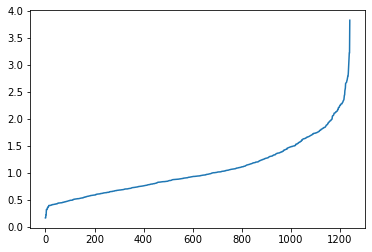

In [95]:
## On travail sur la DF_finale

##On cherche le epsilon optimal 
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(DF_finale_bis[list(DF_finale_bis.columns[5:])])
distances, indices = nbrs.kneighbors(DF_finale_bis[list(DF_finale_bis.columns[5:])])
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)
print(distances[int(0.95*len(DF_finale_bis))])

In [96]:
# Fonction qui trace les courbes des véhicules présents dans chaque clusters et 
# donne en légende les couples correspondants

def cluster_dbscan_total(df,epsilon,nb_voisin):
    
    # ON supprime les Nan de la df
    df = df.dropna()
    
    # On normalise les indicateurs 
    df[list(df.columns[5:])] = StandardScaler().fit_transform(df[list(df.columns[5:])])
    
    labels = cluster (df[list(df.columns[5:])],epsilon,nb_voisin)
    df['clusters']=labels
    
    # ON met les labels dans la dataframe
    df = df.sort_values(by=['scene'])
    liste_scene = list(df['scene'].unique())
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(labels)))
    
    nb_scene = len(df['scene'].unique())

    
    fig, axs = plt.subplots(len(labels_unique),nb_scene) # Ici on aura 10 scènes pour commencer 
    #fig.suptitle("Tracé des clusters obtenus avec l'algorithme DSCAN")
    plt.gcf().set_size_inches(20, 20)
    #plt.gcf().subplots_adjust(left = 0.3, bottom = 0.3,right = 0.7, top = 0.9, wspace = 0, hspace = 0.5)
    
    for s in labels_unique:
        
        # On s'occupe d'un cluster 
        df_new = df[df['clusters']==s]
        
        # On classe les lignes par scènes 
        df_new = df_new.sort_values(by=['scene'])
        # On cherche les scènes dans le cluster 
        scene_in_cluster = df_new['scene'].unique()
        
        for h in range(0,len(scene_in_cluster)) :
            # ON s'occupe d'une scene  
        
            # On récupère la place de cette scène dans l'ordre 
            num_scene = liste_scene.index(scene_in_cluster[h])
            
            df_bis = df_new[df_new['scene']==scene_in_cluster[h]]

        
            nb_ligne = len(df_bis)

            Texte_legend = 'Couple de trajectoires \n'

            for j in range(0,nb_ligne):
                current_ligne = df_bis.iloc[j]

                scene_name = current_ligne['scene']
                veh1 = current_ligne['Catégorie Véhicule 1'] # catégorie du véhicule 1 
                veh2 = current_ligne['Catégorie Véhicule 2']# ici on a le nom de la catégorie 
                num_veh2 = current_ligne['Numéro Véhicule 2']-1 # Numéro du véhicule 2 

                scene_token = nusc.field2token('scene','name',scene_name)[0]
                sample_token = nusc.field2token('sample','scene_token',scene_token)# Ensemble des token des échantillons de la scene 

                # Ensemble des sample_annotation de la scène :

                sample_annotation_token = []
                for k in sample_token : 
                    L = nusc.field2token('sample_annotation','sample_token',k)
                    sample_annotation_token = sample_annotation_token + L

                # On créé la liste des token des instances présents dans les sample_annotation
                L_instance_token = []
                for k in sample_annotation_token :
                    exemple = nusc.get('sample_annotation', k)
                    L_instance_token.append(exemple['instance_token'])
                # Puisque pour un même objet, on peut avoir plusieurs annotations, on supprime les doublons de L
                L_instance_token = list(set(L_instance_token))

                ## Véhicule 1 
                if veh1 == 'vehicle.ego':              
                    num_veh1_legend = ''
                    Liste_ego_poses = get_poses(scene_token) 
                    X1 =[]
                    Y1 =[]
                    Z1 =[]
                    T1 = [] # liste des timestamps
                    for k in range(0,len(Liste_ego_poses)):
                        X1.append(Liste_ego_poses[k]['translation'][0])
                        Y1.append(Liste_ego_poses[k]['translation'][1])
                        Z1.append(Liste_ego_poses[k]['translation'][2])
                        T1.append(Liste_ego_poses[k]['timestamp'])
                else :
                    num_veh1 = current_ligne['Numéro Véhicule 1']-1 #numéro du véhicule dans la liste de tous les véh de cette catégo
                    num_veh1_legend = str(num_veh1+1)

                    catego_name = veh1
                    catego_token = nusc.field2token('category','name',catego_name)
                    category = nusc.get('category',catego_token[0])

                    # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                    L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                    L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                    L=[]
                    for k in L_instance_category : 
                        instance_category = nusc.get('instance',k)
                        nbr_annotations = instance_category['nbr_annotations']
                        if nbr_annotations == 1:
                            L.append([instance_category['first_annotation_token']])
                        else : 
                            H = []
                            first_token = instance_category['first_annotation_token']
                            last_token = instance_category['last_annotation_token']
                            current_token = first_token 

                            i = 0 
                            while i!= nbr_annotations :
                                current_ann = nusc.get('sample_annotation', current_token)
                                H.append(current_ann['token'])
                                current_token = current_ann['next'] #On passe au suivant
                                i+=1
                            L.append(H)
                    # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                    # les token des sample_annotation pour un élément de cette catégorie. 

                    # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                    # on va pouvoir récupérer leurs positions 

                    X = []
                    Y = []
                    Z = []
                    T_time = []
                    for k in L :
                        x = []
                        y = []
                        z = []
                        t = []
                        for i in k :
                            sample_annotation = nusc.get('sample_annotation',i)
                            x.append(sample_annotation['translation'][0])
                            y.append(sample_annotation['translation'][1])
                            z.append(sample_annotation['translation'][2])
                            t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                        X.append(x)
                        Y.append(y)
                        Z.append(z)
                        T_time.append(t)

                    Immo, Mobile = immobile(X,Y)

                    # On conserve uniquement les objets mobiles 
                    X_mobile=[X[i] for i in Mobile]
                    Y_mobile=[Y[i] for i in Mobile]
                    Z_mobile=[Z[i] for i in Mobile]
                    T_mobile = [T_time[i] for i in Mobile]

                    X1 =X_mobile[num_veh1] 
                    Y1 =Y_mobile[num_veh1] 
                    Z1 =Z_mobile[num_veh1] 
                    T1 =T_mobile[num_veh1] 

                catego_name = veh2
                catego_token = nusc.field2token('category','name',catego_name)
                category = nusc.get('category',catego_token[0])

                # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                L=[]
                for k in L_instance_category : 
                    instance_category = nusc.get('instance',k)
                    nbr_annotations = instance_category['nbr_annotations']
                    if nbr_annotations == 1:
                        L.append([instance_category['first_annotation_token']])
                    else : 
                        H = []
                        first_token = instance_category['first_annotation_token']
                        last_token = instance_category['last_annotation_token']
                        current_token = first_token 

                        i = 0 
                        while i!= nbr_annotations :
                            current_ann = nusc.get('sample_annotation', current_token)
                            H.append(current_ann['token'])
                            current_token = current_ann['next'] #On passe au suivant
                            i+=1
                        L.append(H)
                    # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                    # les token des sample_annotation pour un élément de cette catégorie. 

                    # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                    # on va pouvoir récupérer leurs positions 

                X = []
                Y = []
                Z = []
                T_time = []
                for k in L :
                    x = []
                    y = []
                    z = []
                    t = []
                    for i in k :
                        sample_annotation = nusc.get('sample_annotation',i)
                        x.append(sample_annotation['translation'][0])
                        y.append(sample_annotation['translation'][1])
                        z.append(sample_annotation['translation'][2])
                        t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                    X.append(x)
                    Y.append(y)
                    Z.append(z)
                    T_time.append(t)

                Immo, Mobile = immobile(X,Y)

                # On conserve uniquement les objets mobiles 
                X_mobile=[X[i] for i in Mobile]
                Y_mobile=[Y[i] for i in Mobile]
                Z_mobile=[Z[i] for i in Mobile]
                T_mobile = [T_time[i] for i in Mobile]

                X2 =X_mobile[num_veh2] 
                Y2 =Y_mobile[num_veh2] 
                Z2 =Z_mobile[num_veh2] 
                T2 =T_mobile[num_veh2] 

                axs[s,num_scene].plot(X1,Y1)
                #axs[s,h].text(X1[0], Y1[0],veh1 + ' '+num_veh1_legend)#,fontsize=8)
                axs[s,num_scene].plot(X2,Y2)
                #axs[s,h].text(X2[0], Y2[0],veh2 + ' '+str(num_veh2+1))#,fontsize=8)
                #axs[s,h].legend(loc='best')
                #axs[s,num_scene].set_title('Cluster '+str(s)+' dans '+ scene_name)
                #axs[s,h].plot([],[],'w',label = veh1 + ' '+num_veh1_legend +'/'+veh2 + ' '+str(num_veh2+1))   

    plt.tight_layout()
    plt.show()

/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:236: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations


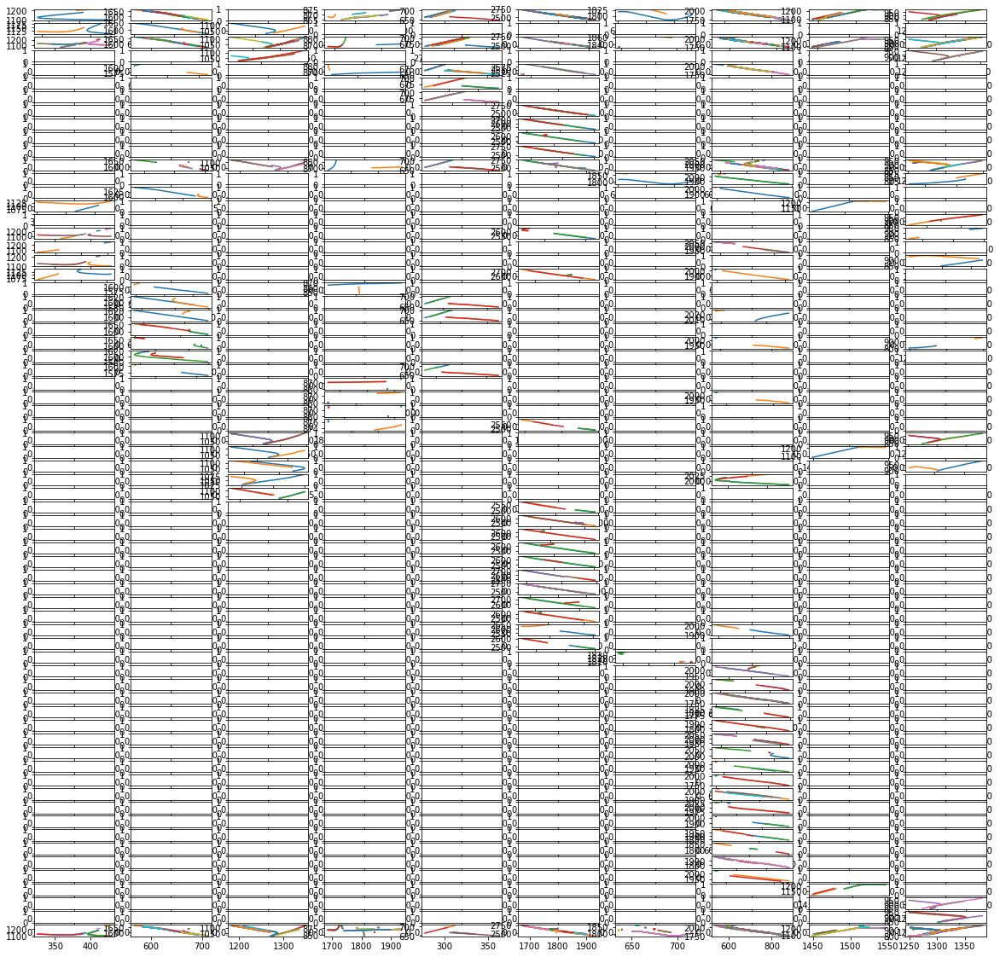

In [97]:
cluster_dbscan_total(DF_finale,1.5,2)

In [98]:
DF_cluster = liste_cluster_dbscan(DF_finale,2,2)
DF_cluster

,Liste des trajectoires appartenant au cluster,DTW moyen,DTW minimum,DTW maximum,Durée d'interaction moyenne,Indicateur d'orthogonalité moyen,Indicateur de colinéarité moyen
Cluster,,,,,,,
Cluster -1,"[vehicle.bicycle 1 /vehicle.car 3 scene-0103, ...",68.054961,2.601632,186.545637,0.548791,0.544629,-0.076859
Cluster 0,"[vehicle.car 14 /vehicle.car 19 scene-0796, ve...",49.600073,5.526195,148.772247,0.298729,0.231457,-0.872777
Cluster 1,"[vehicle.car 5/ego dans scene-1100, vehicle.ca...",50.311886,2.587572,174.855274,0.425798,0.242604,0.859368
Cluster 2,"[vehicle.car 1 /vehicle.car 9 scene-0655, vehi...",28.363653,20.731895,35.995410,0.859922,0.450011,-0.462704
Cluster 3,[vehicle.bus.rigid 1 /vehicle.car 7 scene-0553...,49.662063,45.886272,54.895787,0.885625,0.663255,-0.253451
Cluster 4,"[vehicle.car 11/ego dans scene-0757, vehicle.c...",17.151041,16.827693,17.474389,0.264521,0.359891,0.893283
Cluster 5,"[vehicle.car 7/ego dans scene-0757, vehicle.ca...",19.382418,15.061297,21.196844,0.298019,0.373358,-0.837540
Cluster 6,"[vehicle.car 31/ego dans scene-1077, vehicle.b...",40.870063,36.357621,45.382504,0.368092,0.091794,-0.993445
Cluster 7,"[vehicle.car 5/ego dans scene-0796, vehicle.ca...",12.653886,2.881583,30.449221,0.989796,0.013939,0.999788


/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:15: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  from ipykernel import kernelapp as app


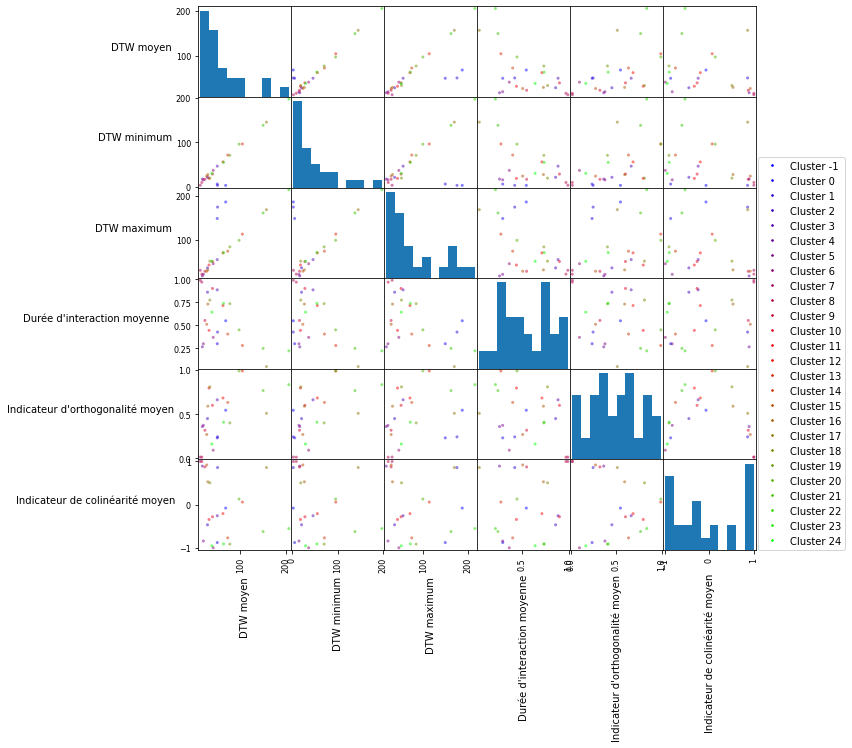

In [99]:
## On va tracer les courbes des colonnes les unes par rapport aux autres, 

# On converti le type des colonnes en float d'abbord
DF_cluster[list(DF_cluster.columns[1:])] = DF_cluster[list(DF_cluster.columns[1:])].apply(pd.to_numeric)
axes = pd.plotting.scatter_matrix(DF_cluster,c=[plt.cm.brg(i/(len(DF_cluster)-1))for i in range(len(DF_cluster))],label = list(DF_cluster.index),figsize=(10,10))
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')

handles = [plt.plot([],[],color=plt.cm.brg(i/(len(DF_cluster)-1)), ls="", marker=".",markersize=np.sqrt(10))[0] for i in range(len(DF_cluster))]
labels=list(DF_cluster.index)
plt.legend(handles, labels, loc=(1.02,0))

plt.tight_layout()
plt.gcf().subplots_adjust(wspace=0, hspace=0)
plt.show()

#### Test sur 2 scènes 

In [100]:
# Scène 757 + 61 
df_test = pd.concat([df_61_finale ,df_757_finale])

In [101]:
# Normalisation de la df 
df_test_normalise = df_test.copy()
df_test_normalise[list(df_test_normalise.columns[5:])] = StandardScaler().fit_transform(df_test_normalise[list(df_test_normalise.columns[5:])])
df_test_normalise

,scene,Catégorie Véhicule 1,Numéro Véhicule 1,Catégorie Véhicule 2,Numéro Véhicule 2,Vitesse moyenne veh 1,Vitesse moyenne veh 2,Durée d'interaction,DTW normalisée,Distance instantannée moyenne,...,Indicateur d'orthogonalité moyen,Indicateur d'orthogonalité min,Indicateur d'orthogonalité max,Indicateur de colinéarité moyen,Indicateur de colinéarité min,Indicateur de colinéarité max,Sens,Distance minimale dans matrice distance,Distance maximale dans matrice distance,Distance moyenne dans matrice distance
vehicle.bus.rigid 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.bus.rigid,1,0.716792,1.149665,-0.98642,1.411171,2.19825,...,-0.794462,-0.514965,-0.841028,-1.096209,-0.966642,-1.182538,-0.975305,1.09523,1.194329,1.287713
vehicle.car 1/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,1,0.818131,1.223078,-1.19804,-0.115528,0.264248,...,-0.588341,-0.285704,-0.711408,-1.092946,-0.964311,-1.179109,-0.975305,-0.112015,-0.403746,-0.201099
vehicle.car 2/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,2,-0.101659,-0.100717,1.013789,-0.483129,-0.031725,...,0.404919,-0.182444,1.487446,0.978335,0.279782,1.025011,1.02532,-0.626481,1.160361,-0.07404
vehicle.car 3/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,3,0.716792,1.809454,-0.98642,0.180735,0.548234,...,-0.643956,-0.38274,-0.726022,1.167144,1.320717,1.028986,1.02532,0.007319,0.391607,0.305008
vehicle.car 4/ego dans scene-0061,scene-0061,vehicle.ego,1,vehicle.car,4,-0.570466,-1.022245,2.633125,-0.918723,-0.580349,...,-0.716902,-0.515665,-0.575903,1.168006,1.31286,1.029738,1.02532,-0.875386,0.819002,-0.327508
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
vehicle.car 10 /vehicle.car 11 scene-0757,scene-0757,vehicle.car,10,vehicle.car,11,0.353322,0.698527,0.830944,-0.611887,-0.77365,...,-0.625424,-0.281255,-0.757908,-1.093913,-0.96422,-1.180709,-0.975305,-0.701743,-0.702316,-0.801476
vehicle.car 10 /vehicle.truck 2 scene-0757,scene-0757,vehicle.car,10,vehicle.truck,2,0.374306,-2.014907,-0.501447,-0.292037,-0.481839,...,1.545472,-0.353615,1.384748,0.604095,0.523931,1.02862,1.02532,-0.145375,-0.727053,-0.437032
vehicle.car 11 /vehicle.truck 1 scene-0757,scene-0757,vehicle.car,11,vehicle.truck,1,0.61299,0.234469,0.381864,-0.72752,-0.883932,...,-0.652067,-0.320667,-0.772605,-1.094496,-0.964966,-1.181128,-0.975305,-0.732959,-0.892652,-0.884502
vehicle.car 11 /vehicle.truck 2 scene-0757,scene-0757,vehicle.car,11,vehicle.truck,2,0.564597,-2.165316,-0.501108,-0.416396,-0.542641,...,0.482903,-0.391105,1.259956,-0.837322,-0.965957,-0.554828,-0.975305,-0.312059,-0.590226,-0.497234


3.4499897321015816


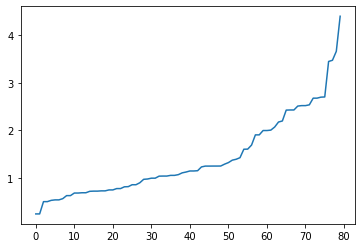

In [102]:
##On cherche le epsilon optimal 
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(df_test_normalise[list(df_test_normalise.columns[5:])])
distances, indices = nbrs.kneighbors(df_test_normalise[list(df_test_normalise.columns[5:])])
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)
print(distances[int(0.95*len(df_test_normalise))])


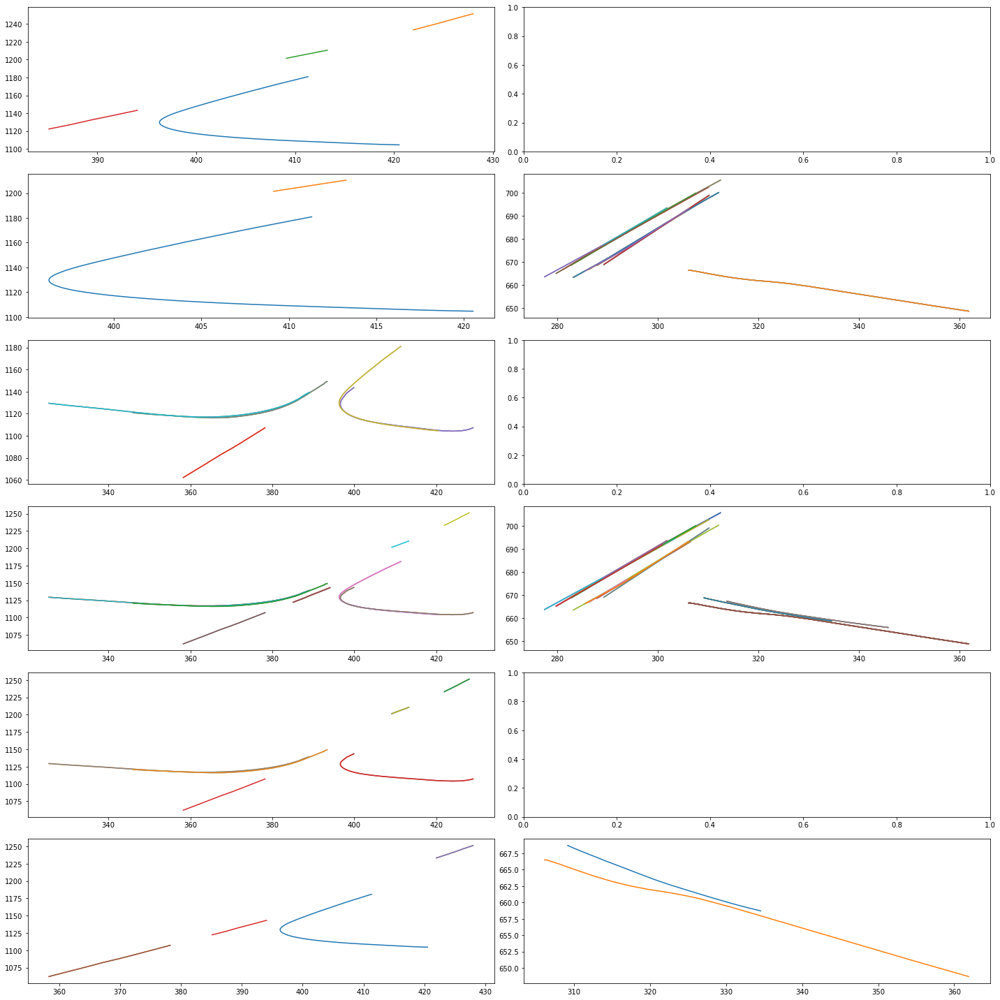

In [103]:
cluster_dbscan_total(df_test,3,2)

In [104]:
df_cluster = liste_cluster_dbscan(df_test,3,2)
df_cluster

,Liste des trajectoires appartenant au cluster,DTW moyen,DTW minimum,DTW maximum,Durée d'interaction moyenne,Indicateur d'orthogonalité moyen,Indicateur de colinéarité moyen
Cluster,,,,,,,
Cluster -1,"[vehicle.truck 2/ego dans scene-0757, vehicle....",72.904207,2.938047,132.050158,0.642909,0.186974,-0.164222
Cluster 0,"[vehicle.car 1 /vehicle.car 3 scene-0061, vehi...",60.760128,58.736011,62.784244,0.309662,0.019867,-0.999750
Cluster 1,"[vehicle.car 2 /vehicle.car 7 scene-0757, vehi...",13.372355,5.526195,24.953401,0.388385,0.103320,-0.960958
Cluster 2,"[vehicle.truck 1/ego dans scene-0061, vehicle....",28.142174,15.844434,36.836047,0.527279,0.386713,0.784330
Cluster 3,"[vehicle.car 2 /vehicle.truck 2 scene-0757, ve...",20.770721,3.118809,45.884255,0.326335,0.371878,0.497561
Cluster 4,"[vehicle.car 1 /vehicle.truck 1 scene-0061, ve...",74.889528,48.667030,99.637751,0.113250,0.067791,-0.996534


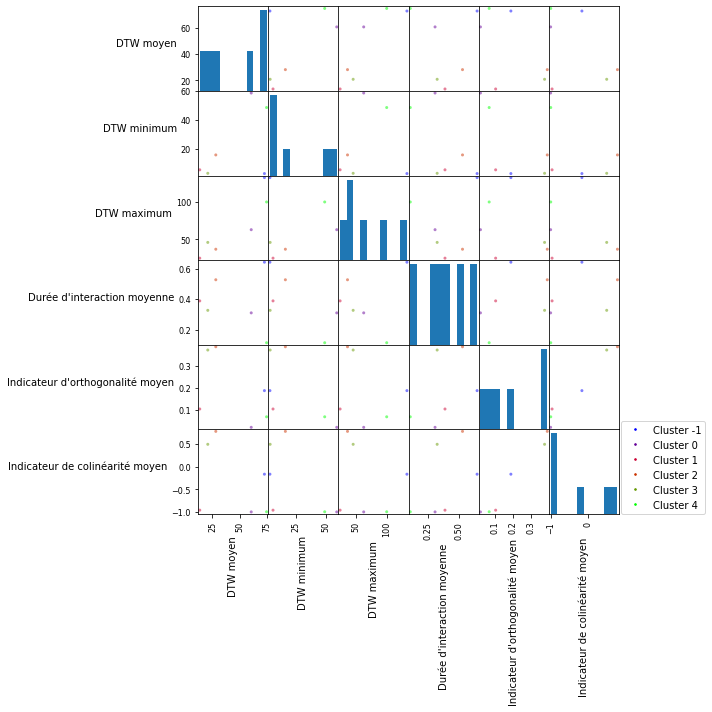

In [105]:
## On va tracer les courbes des colonnes les unes par rapport aux autres, 

# On converti le type des colonnes en float d'abbord
df_cluster[list(df_cluster.columns[1:])] = df_cluster[list(df_cluster.columns[1:])].apply(pd.to_numeric)
axes = pd.plotting.scatter_matrix(df_cluster,c=[plt.cm.brg(i/(len(df_cluster)-1))for i in range(len(df_cluster))],label = list(df_cluster.index),figsize=(10,10))
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')

handles = [plt.plot([],[],color=plt.cm.brg(i/(len(df_cluster)-1)), ls="", marker=".",markersize=np.sqrt(10))[0] for i in range(len(df_cluster))]
labels=list(df_cluster.index)
plt.legend(handles, labels, loc=(1.02,0))

plt.tight_layout()
plt.gcf().subplots_adjust(wspace=0, hspace=0)
plt.show()

#### Ward

In [106]:
# Fonction qui trace les courbes des véhicules présents dans chaque clusters et 
# donne en légende les couples correspondants

from sklearn.cluster import AgglomerativeClustering

def cluster_ward(df,nb_clusters):
    
    df = df.dropna()
    
    # On normalise les indicateurs 
    df[list(df.columns[5:])] = StandardScaler().fit_transform(df[list(df.columns[5:])])

    clustering = AgglomerativeClustering(nb_clusters).fit(df[list(df.columns[5:])])
    labels = clustering.labels_
    df['clusters']=labels
    
    # ON met les labels dans la dataframe
    df = df.sort_values(by=['clusters'])
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(labels)))
    
    fig, axs = plt.subplots(len(labels_unique))
    #fig.suptitle("Tracé des clusters obtenus avec l'algorithme DSCAN")
    plt.gcf().set_size_inches(15, 25)
    #plt.gcf().subplots_adjust(left = 0.3, bottom = 0.3,right = 0.7, top = 0.9, wspace = 0, hspace = 0.5)
    
    for s in labels_unique:
        
        # On s'occupe d'un cluster 
        df_bis = df[df['clusters']==s]
        
        nb_ligne = len(df_bis)
        
        Texte_legend = 'Couple de trajectoires \n'
        
        for j in range(0,nb_ligne):
            current_ligne = df_bis.iloc[j]
            
            scene_name = current_ligne['scene']
            veh1 = current_ligne['Catégorie Véhicule 1'] # catégorie du véhicule 1 
            veh2 = current_ligne['Catégorie Véhicule 2']# ici on a le nom de la catégorie 
            num_veh2 = current_ligne['Numéro Véhicule 2']-1 # Numéro du véhicule 2 
            
            scene_token = nusc.field2token('scene','name',scene_name)[0]
            sample_token = nusc.field2token('sample','scene_token',scene_token)# Ensemble des token des échantillons de la scene 
            
            # Ensemble des sample_annotation de la scène :

            sample_annotation_token = []
            for k in sample_token : 
                L = nusc.field2token('sample_annotation','sample_token',k)
                sample_annotation_token = sample_annotation_token + L

            # On créé la liste des token des instances présents dans les sample_annotation
            L_instance_token = []
            for k in sample_annotation_token :
                exemple = nusc.get('sample_annotation', k)
                L_instance_token.append(exemple['instance_token'])
            # Puisque pour un même objet, on peut avoir plusieurs annotations, on supprime les doublons de L
            L_instance_token = list(set(L_instance_token))
            
            ## Véhicule 1 
            if veh1 == 'vehicle.ego':              
                num_veh1_legend = ''
                Liste_ego_poses = get_poses(scene_token) 
                X1 =[]
                Y1 =[]
                Z1 =[]
                T1 = [] # liste des timestamps
                for k in range(0,len(Liste_ego_poses)):
                    X1.append(Liste_ego_poses[k]['translation'][0])
                    Y1.append(Liste_ego_poses[k]['translation'][1])
                    Z1.append(Liste_ego_poses[k]['translation'][2])
                    T1.append(Liste_ego_poses[k]['timestamp'])
            else :
                num_veh1 = current_ligne['Numéro Véhicule 1']-1 #numéro du véhicule dans la liste de tous les véh de cette catégo
                num_veh1_legend = str(num_veh1+1)
                
                catego_name = veh1
                catego_token = nusc.field2token('category','name',catego_name)
                category = nusc.get('category',catego_token[0])
                
                # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                L=[]
                for k in L_instance_category : 
                    instance_category = nusc.get('instance',k)
                    nbr_annotations = instance_category['nbr_annotations']
                    if nbr_annotations == 1:
                        L.append([instance_category['first_annotation_token']])
                    else : 
                        H = []
                        first_token = instance_category['first_annotation_token']
                        last_token = instance_category['last_annotation_token']
                        current_token = first_token 

                        i = 0 
                        while i!= nbr_annotations :
                            current_ann = nusc.get('sample_annotation', current_token)
                            H.append(current_ann['token'])
                            current_token = current_ann['next'] #On passe au suivant
                            i+=1
                        L.append(H)
                # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                # les token des sample_annotation pour un élément de cette catégorie. 

                # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                # on va pouvoir récupérer leurs positions 

                X = []
                Y = []
                Z = []
                T_time = []
                for k in L :
                    x = []
                    y = []
                    z = []
                    t = []
                    for i in k :
                        sample_annotation = nusc.get('sample_annotation',i)
                        x.append(sample_annotation['translation'][0])
                        y.append(sample_annotation['translation'][1])
                        z.append(sample_annotation['translation'][2])
                        t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                    X.append(x)
                    Y.append(y)
                    Z.append(z)
                    T_time.append(t)

                Immo, Mobile = immobile(X,Y)

                # On conserve uniquement les objets mobiles 
                X_mobile=[X[i] for i in Mobile]
                Y_mobile=[Y[i] for i in Mobile]
                Z_mobile=[Z[i] for i in Mobile]
                T_mobile = [T_time[i] for i in Mobile]
                
                X1 =X_mobile[num_veh1] 
                Y1 =Y_mobile[num_veh1] 
                Z1 =Z_mobile[num_veh1] 
                T1 =T_mobile[num_veh1] 
            
            catego_name = veh2
            catego_token = nusc.field2token('category','name',catego_name)
            category = nusc.get('category',catego_token[0])
                
            # Ensemble des instances appartenant à la fois à la scène et à la catégorie
            L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
            L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

            L=[]
            for k in L_instance_category : 
                instance_category = nusc.get('instance',k)
                nbr_annotations = instance_category['nbr_annotations']
                if nbr_annotations == 1:
                    L.append([instance_category['first_annotation_token']])
                else : 
                    H = []
                    first_token = instance_category['first_annotation_token']
                    last_token = instance_category['last_annotation_token']
                    current_token = first_token 

                    i = 0 
                    while i!= nbr_annotations :
                        current_ann = nusc.get('sample_annotation', current_token)
                        H.append(current_ann['token'])
                        current_token = current_ann['next'] #On passe au suivant
                        i+=1
                    L.append(H)
                # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                # les token des sample_annotation pour un élément de cette catégorie. 

                # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                # on va pouvoir récupérer leurs positions 

            X = []
            Y = []
            Z = []
            T_time = []
            for k in L :
                x = []
                y = []
                z = []
                t = []
                for i in k :
                    sample_annotation = nusc.get('sample_annotation',i)
                    x.append(sample_annotation['translation'][0])
                    y.append(sample_annotation['translation'][1])
                    z.append(sample_annotation['translation'][2])
                    t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                X.append(x)
                Y.append(y)
                Z.append(z)
                T_time.append(t)

            Immo, Mobile = immobile(X,Y)

            # On conserve uniquement les objets mobiles 
            X_mobile=[X[i] for i in Mobile]
            Y_mobile=[Y[i] for i in Mobile]
            Z_mobile=[Z[i] for i in Mobile]
            T_mobile = [T_time[i] for i in Mobile]
                
            X2 =X_mobile[num_veh2] 
            Y2 =Y_mobile[num_veh2] 
            Z2 =Z_mobile[num_veh2] 
            T2 =T_mobile[num_veh2] 
        
            axs[s].plot(X1,Y1)
            axs[s].text(X1[0], Y1[0],veh1 + ' '+num_veh1_legend,fontsize=8)
            axs[s].plot(X2,Y2)
            axs[s].text(X2[0], Y2[0],veh2 + ' '+str(num_veh2+1),fontsize=8)
            #axs[s].legend(loc='best')
            axs[s].set_title('Cluster '+str(s))
            axs[s].plot([],[],'w',label = veh1 + ' '+num_veh1_legend +'/'+veh2 + ' '+str(num_veh2+1) )
    
        axs[s].legend(loc='best')

    plt.tight_layout()
    plt.show()

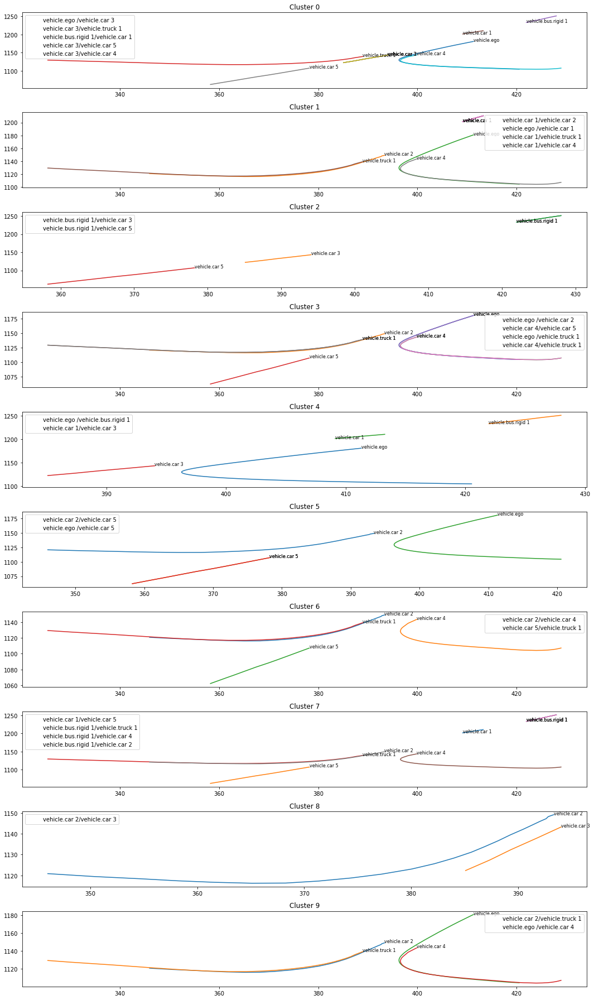

In [107]:
cluster_ward(df_61_finale,10)

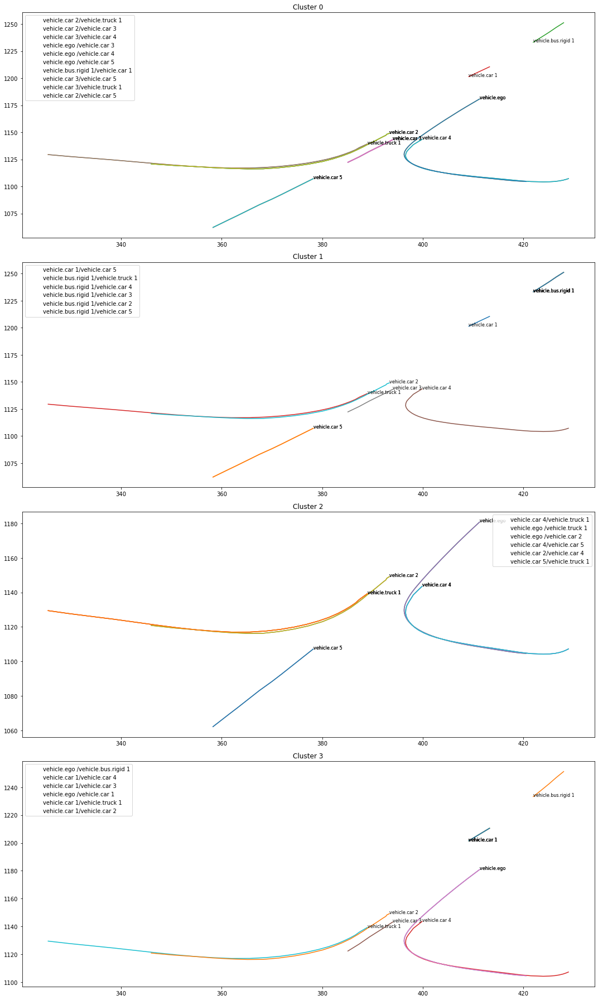

In [108]:
# Avec le nombre de cluster qu'on a trouvé dans dbscan 
cluster_ward(df_61_finale,4)

In [109]:
# ward pour un df avec plusieurs scènes 
def cluster_ward_total(df,nb_clusters):
    
    # ON supprime les Nan de la df
    df = df.dropna()
    
    # On normalise les indicateurs 
    df[list(df.columns[5:])] = StandardScaler().fit_transform(df[list(df.columns[5:])])
    
    clustering = AgglomerativeClustering(nb_clusters).fit(df[list(df.columns[5:])])
    labels = clustering.labels_
    df['clusters']=labels
    
    # ON met les labels dans la dataframe
    df = df.sort_values(by=['scene'])
    liste_scene = list(df['scene'].unique())
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(labels)))
    
    nb_scene = len(df['scene'].unique())

    
    fig, axs = plt.subplots(len(labels_unique),nb_scene) # Ici on aura 10 scènes pour commencer 
    #fig.suptitle("Tracé des clusters obtenus avec l'algorithme DSCAN")
    plt.gcf().set_size_inches(10, 10)
    #plt.gcf().subplots_adjust(left = 0.3, bottom = 0.3,right = 0.7, top = 0.9, wspace = 0, hspace = 0.5)
    
    for s in labels_unique:
        
        # On s'occupe d'un cluster 
        df_new = df[df['clusters']==s]
        
        # On classe les lignes par scènes 
        df_new = df_new.sort_values(by=['scene'])
        # On cherche les scènes dans le cluster 
        scene_in_cluster = df_new['scene'].unique()
        
        for h in range(0,len(scene_in_cluster)) :
            # ON s'occupe d'une scene  
        
            # On récupère la place de cette scène dans l'ordre 
            num_scene = liste_scene.index(scene_in_cluster[h])
            
            df_bis = df_new[df_new['scene']==scene_in_cluster[h]]

        
            nb_ligne = len(df_bis)

            Texte_legend = 'Couple de trajectoires \n'

            for j in range(0,nb_ligne):
                current_ligne = df_bis.iloc[j]

                scene_name = current_ligne['scene']
                veh1 = current_ligne['Catégorie Véhicule 1'] # catégorie du véhicule 1 
                veh2 = current_ligne['Catégorie Véhicule 2']# ici on a le nom de la catégorie 
                num_veh2 = current_ligne['Numéro Véhicule 2']-1 # Numéro du véhicule 2 

                scene_token = nusc.field2token('scene','name',scene_name)[0]
                sample_token = nusc.field2token('sample','scene_token',scene_token)# Ensemble des token des échantillons de la scene 

                # Ensemble des sample_annotation de la scène :

                sample_annotation_token = []
                for k in sample_token : 
                    L = nusc.field2token('sample_annotation','sample_token',k)
                    sample_annotation_token = sample_annotation_token + L

                # On créé la liste des token des instances présents dans les sample_annotation
                L_instance_token = []
                for k in sample_annotation_token :
                    exemple = nusc.get('sample_annotation', k)
                    L_instance_token.append(exemple['instance_token'])
                # Puisque pour un même objet, on peut avoir plusieurs annotations, on supprime les doublons de L
                L_instance_token = list(set(L_instance_token))

                ## Véhicule 1 
                if veh1 == 'vehicle.ego':              
                    num_veh1_legend = ''
                    Liste_ego_poses = get_poses(scene_token) 
                    X1 =[]
                    Y1 =[]
                    Z1 =[]
                    T1 = [] # liste des timestamps
                    for k in range(0,len(Liste_ego_poses)):
                        X1.append(Liste_ego_poses[k]['translation'][0])
                        Y1.append(Liste_ego_poses[k]['translation'][1])
                        Z1.append(Liste_ego_poses[k]['translation'][2])
                        T1.append(Liste_ego_poses[k]['timestamp'])
                else :
                    num_veh1 = current_ligne['Numéro Véhicule 1']-1 #numéro du véhicule dans la liste de tous les véh de cette catégo
                    num_veh1_legend = str(num_veh1+1)

                    catego_name = veh1
                    catego_token = nusc.field2token('category','name',catego_name)
                    category = nusc.get('category',catego_token[0])

                    # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                    L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                    L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                    L=[]
                    for k in L_instance_category : 
                        instance_category = nusc.get('instance',k)
                        nbr_annotations = instance_category['nbr_annotations']
                        if nbr_annotations == 1:
                            L.append([instance_category['first_annotation_token']])
                        else : 
                            H = []
                            first_token = instance_category['first_annotation_token']
                            last_token = instance_category['last_annotation_token']
                            current_token = first_token 

                            i = 0 
                            while i!= nbr_annotations :
                                current_ann = nusc.get('sample_annotation', current_token)
                                H.append(current_ann['token'])
                                current_token = current_ann['next'] #On passe au suivant
                                i+=1
                            L.append(H)
                    # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                    # les token des sample_annotation pour un élément de cette catégorie. 

                    # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                    # on va pouvoir récupérer leurs positions 

                    X = []
                    Y = []
                    Z = []
                    T_time = []
                    for k in L :
                        x = []
                        y = []
                        z = []
                        t = []
                        for i in k :
                            sample_annotation = nusc.get('sample_annotation',i)
                            x.append(sample_annotation['translation'][0])
                            y.append(sample_annotation['translation'][1])
                            z.append(sample_annotation['translation'][2])
                            t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                        X.append(x)
                        Y.append(y)
                        Z.append(z)
                        T_time.append(t)

                    Immo, Mobile = immobile(X,Y)

                    # On conserve uniquement les objets mobiles 
                    X_mobile=[X[i] for i in Mobile]
                    Y_mobile=[Y[i] for i in Mobile]
                    Z_mobile=[Z[i] for i in Mobile]
                    T_mobile = [T_time[i] for i in Mobile]

                    X1 =X_mobile[num_veh1] 
                    Y1 =Y_mobile[num_veh1] 
                    Z1 =Z_mobile[num_veh1] 
                    T1 =T_mobile[num_veh1] 

                catego_name = veh2
                catego_token = nusc.field2token('category','name',catego_name)
                category = nusc.get('category',catego_token[0])

                # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                L=[]
                for k in L_instance_category : 
                    instance_category = nusc.get('instance',k)
                    nbr_annotations = instance_category['nbr_annotations']
                    if nbr_annotations == 1:
                        L.append([instance_category['first_annotation_token']])
                    else : 
                        H = []
                        first_token = instance_category['first_annotation_token']
                        last_token = instance_category['last_annotation_token']
                        current_token = first_token 

                        i = 0 
                        while i!= nbr_annotations :
                            current_ann = nusc.get('sample_annotation', current_token)
                            H.append(current_ann['token'])
                            current_token = current_ann['next'] #On passe au suivant
                            i+=1
                        L.append(H)
                    # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                    # les token des sample_annotation pour un élément de cette catégorie. 

                    # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                    # on va pouvoir récupérer leurs positions 

                X = []
                Y = []
                Z = []
                T_time = []
                for k in L :
                    x = []
                    y = []
                    z = []
                    t = []
                    for i in k :
                        sample_annotation = nusc.get('sample_annotation',i)
                        x.append(sample_annotation['translation'][0])
                        y.append(sample_annotation['translation'][1])
                        z.append(sample_annotation['translation'][2])
                        t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                    X.append(x)
                    Y.append(y)
                    Z.append(z)
                    T_time.append(t)

                Immo, Mobile = immobile(X,Y)

                # On conserve uniquement les objets mobiles 
                X_mobile=[X[i] for i in Mobile]
                Y_mobile=[Y[i] for i in Mobile]
                Z_mobile=[Z[i] for i in Mobile]
                T_mobile = [T_time[i] for i in Mobile]

                X2 =X_mobile[num_veh2] 
                Y2 =Y_mobile[num_veh2] 
                Z2 =Z_mobile[num_veh2] 
                T2 =T_mobile[num_veh2] 

                axs[s,num_scene].plot(X1,Y1)
                #axs[s,h].text(X1[0], Y1[0],veh1 + ' '+num_veh1_legend)#,fontsize=8)
                axs[s,num_scene].plot(X2,Y2)
                #axs[s,h].text(X2[0], Y2[0],veh2 + ' '+str(num_veh2+1))#,fontsize=8)
                #axs[s,h].legend(loc='best')
                axs[s,num_scene].set_title('Cluster '+str(s)+' dans '+ scene_name)
                #axs[s,h].plot([],[],'w',label = veh1 + ' '+num_veh1_legend +'/'+veh2 + ' '+str(num_veh2+1))   

    plt.tight_layout()
    plt.show()

In [110]:
# Fonction qui renvoie une df avec pour chaque cluster

def liste_cluster_ward(df,nb_clusters):
    
    df_cluster = pd.DataFrame()
    
    df = df.dropna()
    
    # On normalise les indicateurs 
    df_normalise = df.copy()
    df_normalise[list(df_normalise.columns[5:])] = StandardScaler().fit_transform(df_normalise[list(df_normalise.columns[5:])])

    clustering = AgglomerativeClustering(nb_clusters).fit(df_normalise[list(df_normalise.columns[5:])])
    labels = clustering.labels_
    df['clusters']=labels
    
    # ON met les labels dans la dataframe
    df = df.sort_values(by=['clusters'])
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(labels)))
    
    Colonne_index = ['Cluster '+str(labels_unique[k]) for k in range(0,len(labels_unique))]
    df_cluster['Cluster']=Colonne_index
    df_cluster = df_cluster.set_index('Cluster') # On met la liste des noms des clusters en index
    
    # ON prépare les listes qui seront dans la df_cluster
    L_liste_traj = []
    L_DTW_moy = []
    L_DTW_min = []
    L_DTW_max =[]
    L_duree_inter = []
    L_indic_ortho_moy = []
    L_indic_coli_moy = []
    
    for s in labels_unique:
        
        # On s'occupe d'un cluster 
        df_bis = df[df['clusters']==s]
        nb_ligne = len(df_bis)
        
        L_cluster_s =[]
        
        for j in range(0,nb_ligne):
            current_ligne = df_bis.iloc[j]
            L_cluster_s.append(current_ligne.name) # Nom du couple de traj 
        
        L_liste_traj.append(L_cluster_s)
        
        L_DTW_moy.append(np.mean(df_bis['DTW normalisée']))
        L_DTW_min.append(min(df_bis['DTW normalisée']))
        L_DTW_max.append(max(df_bis['DTW normalisée']))
        L_duree_inter.append(np.mean(df_bis["Durée d'interaction"]))
        L_indic_ortho_moy.append(np.mean(df_bis["Indicateur d'orthogonalité moyen"]))
        L_indic_coli_moy.append(np.mean(df_bis['Indicateur de colinéarité moyen']))
    
    df_cluster['Liste des trajectoires appartenant au cluster'] = L_liste_traj
    df_cluster['DTW moyen'] = L_DTW_moy
    df_cluster['DTW minimum'] = L_DTW_min
    df_cluster['DTW maximum'] = L_DTW_max
    df_cluster["Durée d'interaction moyenne"] = L_duree_inter
    df_cluster["Indicateur d'orthogonalité moyen" ] = L_indic_ortho_moy
    df_cluster["Indicateur de colinéarité moyen" ] = L_indic_coli_moy
    
    return df_cluster

In [111]:
df_cluster = liste_cluster_ward(df_61_finale,10)
df_cluster 

,Liste des trajectoires appartenant au cluster,DTW moyen,DTW minimum,DTW maximum,Durée d'interaction moyenne,Indicateur d'orthogonalité moyen,Indicateur de colinéarité moyen
Cluster,,,,,,,
Cluster 0,"[vehicle.car 3/ego dans scene-0061, vehicle.ca...",18.156757,4.256271,32.294648,0.232603,0.069766,0.996290
Cluster 1,"[vehicle.car 1 /vehicle.car 2 scene-0061, vehi...",46.739323,24.953401,59.050012,0.073077,0.059442,-0.997807
Cluster 2,[vehicle.bus.rigid 1 /vehicle.car 3 scene-0061...,117.501672,102.953185,132.050158,0.629195,0.079138,-0.996831
Cluster 3,"[vehicle.car 2/ego dans scene-0061, vehicle.ca...",26.205031,15.844434,36.836047,0.528689,0.463258,0.732269
Cluster 4,"[vehicle.bus.rigid 1/ego dans scene-0061, vehi...",60.760128,58.736011,62.784244,0.309662,0.019867,-0.999750
Cluster 5,"[vehicle.car 2 /vehicle.car 5 scene-0061, vehi...",44.783092,35.890745,53.675439,0.417441,0.094718,0.992874
Cluster 6,"[vehicle.car 2 /vehicle.car 4 scene-0061, vehi...",24.709498,22.840678,26.578317,0.561070,0.473105,0.693761
Cluster 7,"[vehicle.car 1 /vehicle.car 5 scene-0061, vehi...",90.555702,81.267757,99.637751,0.138820,0.078416,-0.995385
Cluster 8,[vehicle.car 2 /vehicle.car 3 scene-0061],8.968574,8.968574,8.968574,0.178257,0.096108,0.993064


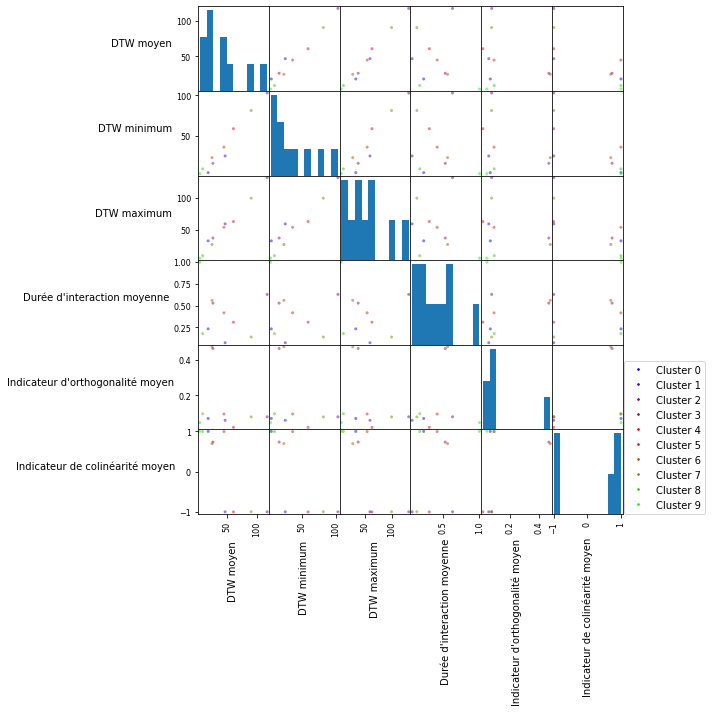

In [112]:
## On va tracer les courbes des colonnes les unes par rapport aux autres, 

# On converti le type des colonnes en float d'abbord
df_cluster[list(df_cluster.columns[1:])] = df_cluster[list(df_cluster.columns[1:])].apply(pd.to_numeric)
axes = pd.plotting.scatter_matrix(df_cluster,c=[plt.cm.brg(i/(len(df_cluster)-1))for i in range(len(df_cluster))],label = list(df_cluster.index),figsize=(10,10))
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')

handles = [plt.plot([],[],color=plt.cm.brg(i/(len(df_cluster)-1)), ls="", marker=".",markersize=np.sqrt(10))[0] for i in range(len(df_cluster))]
labels=list(df_cluster.index)
plt.legend(handles, labels, loc=(1.02,0))

plt.tight_layout()
plt.gcf().subplots_adjust(wspace=0, hspace=0)
plt.show()

In [113]:
df_cluster = liste_cluster_ward(df_61_finale,4)
df_cluster 

,Liste des trajectoires appartenant au cluster,DTW moyen,DTW minimum,DTW maximum,Durée d'interaction moyenne,Indicateur d'orthogonalité moyen,Indicateur de colinéarité moyen
Cluster,,,,,,,
Cluster 0,"[vehicle.car 2 /vehicle.truck 1 scene-0061, ve...",19.748797,3.118809,53.675439,0.417615,0.072727,0.995620
Cluster 1,"[vehicle.car 1 /vehicle.car 5 scene-0061, vehi...",99.537692,81.267757,132.050158,0.302278,0.078657,-0.995867
Cluster 2,"[vehicle.car 4 /vehicle.truck 1 scene-0061, ve...",25.706520,15.844434,36.836047,0.539483,0.466540,0.719433
Cluster 3,"[vehicle.bus.rigid 1/ego dans scene-0061, vehi...",51.412924,24.953401,62.784244,0.151939,0.046251,-0.998454


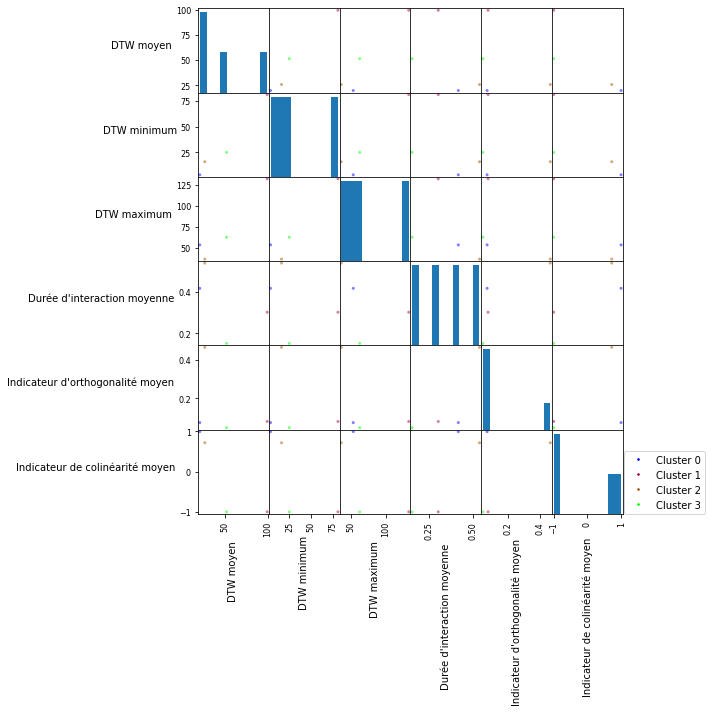

In [114]:
## On va tracer les courbes des colonnes les unes par rapport aux autres, 

# On converti le type des colonnes en float d'abbord
df_cluster[list(df_cluster.columns[1:])] = df_cluster[list(df_cluster.columns[1:])].apply(pd.to_numeric)
axes = pd.plotting.scatter_matrix(df_cluster,c=[plt.cm.brg(i/(len(df_cluster)-1))for i in range(len(df_cluster))],label = list(df_cluster.index),figsize=(10,10))
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')

handles = [plt.plot([],[],color=plt.cm.brg(i/(len(df_cluster)-1)), ls="", marker=".",markersize=np.sqrt(10))[0] for i in range(len(df_cluster))]
labels=list(df_cluster.index)
plt.legend(handles, labels, loc=(1.02,0))

plt.tight_layout()
plt.gcf().subplots_adjust(wspace=0, hspace=0)
plt.show()

#### Kmeans

In [115]:
from sklearn.cluster import KMeans

In [116]:
# Fonction qui trace les courbes des véhicules présents dans chaque clusters et 
# donne en légende les couples correspondants

def clustering_kmeans(df,nb_clusters):
    
    df = df.dropna()
       
    # On normalise les indicateurs 
    df[list(df.columns[5:])] = StandardScaler().fit_transform(df[list(df.columns[5:])])
    
    kmeans = KMeans(nb_clusters, random_state=0).fit(df[list(df.columns[5:])])
    labels = kmeans.labels_
    df['clusters']=labels
    
    # ON met les labels dans la dataframe
    df = df.sort_values(by=['clusters'])
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(labels)))
    
    fig, axs = plt.subplots(len(labels_unique))
    #fig.suptitle("Tracé des clusters obtenus avec l'algorithme DSCAN")
    plt.gcf().set_size_inches(15, 25)
    #plt.gcf().subplots_adjust(left = 0.3, bottom = 0.3,right = 0.7, top = 0.9, wspace = 0, hspace = 0.5)
    
    for s in labels_unique:
        
        # On s'occupe d'un cluster 
        df_bis = df[df['clusters']==s]
        
        nb_ligne = len(df_bis)
        
        Texte_legend = 'Couple de trajectoires \n'
        
        for j in range(0,nb_ligne):
            current_ligne = df_bis.iloc[j]
            
            scene_name = current_ligne['scene']
            veh1 = current_ligne['Catégorie Véhicule 1'] # catégorie du véhicule 1 
            veh2 = current_ligne['Catégorie Véhicule 2']# ici on a le nom de la catégorie 
            num_veh2 = current_ligne['Numéro Véhicule 2']-1 # Numéro du véhicule 2 
            
            scene_token = nusc.field2token('scene','name',scene_name)[0]
            sample_token = nusc.field2token('sample','scene_token',scene_token)# Ensemble des token des échantillons de la scene 
            
            # Ensemble des sample_annotation de la scène :

            sample_annotation_token = []
            for k in sample_token : 
                L = nusc.field2token('sample_annotation','sample_token',k)
                sample_annotation_token = sample_annotation_token + L

            # On créé la liste des token des instances présents dans les sample_annotation
            L_instance_token = []
            for k in sample_annotation_token :
                exemple = nusc.get('sample_annotation', k)
                L_instance_token.append(exemple['instance_token'])
            # Puisque pour un même objet, on peut avoir plusieurs annotations, on supprime les doublons de L
            L_instance_token = list(set(L_instance_token))
            
            ## Véhicule 1 
            if veh1 == 'vehicle.ego':              
                num_veh1_legend = ''
                Liste_ego_poses = get_poses(scene_token) 
                X1 =[]
                Y1 =[]
                Z1 =[]
                T1 = [] # liste des timestamps
                for k in range(0,len(Liste_ego_poses)):
                    X1.append(Liste_ego_poses[k]['translation'][0])
                    Y1.append(Liste_ego_poses[k]['translation'][1])
                    Z1.append(Liste_ego_poses[k]['translation'][2])
                    T1.append(Liste_ego_poses[k]['timestamp'])
            else :
                num_veh1 = current_ligne['Numéro Véhicule 1']-1 #numéro du véhicule dans la liste de tous 
                num_veh1_legend = str(num_veh1+1)
                
                catego_name = veh1
                catego_token = nusc.field2token('category','name',catego_name)
                category = nusc.get('category',catego_token[0])
                
                # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                L=[]
                for k in L_instance_category : 
                    instance_category = nusc.get('instance',k)
                    nbr_annotations = instance_category['nbr_annotations']
                    if nbr_annotations == 1:
                        L.append([instance_category['first_annotation_token']])
                    else : 
                        H = []
                        first_token = instance_category['first_annotation_token']
                        last_token = instance_category['last_annotation_token']
                        current_token = first_token 

                        i = 0 
                        while i!= nbr_annotations :
                            current_ann = nusc.get('sample_annotation', current_token)
                            H.append(current_ann['token'])
                            current_token = current_ann['next'] #On passe au suivant
                            i+=1
                        L.append(H)
                # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                # les token des sample_annotation pour un élément de cette catégorie. 

                # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                # on va pouvoir récupérer leurs positions 

                X = []
                Y = []
                Z = []
                T_time = []
                for k in L :
                    x = []
                    y = []
                    z = []
                    t = []
                    for i in k :
                        sample_annotation = nusc.get('sample_annotation',i)
                        x.append(sample_annotation['translation'][0])
                        y.append(sample_annotation['translation'][1])
                        z.append(sample_annotation['translation'][2])
                        t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                    X.append(x)
                    Y.append(y)
                    Z.append(z)
                    T_time.append(t)

                Immo, Mobile = immobile(X,Y)

                # On conserve uniquement les objets mobiles 
                X_mobile=[X[i] for i in Mobile]
                Y_mobile=[Y[i] for i in Mobile]
                Z_mobile=[Z[i] for i in Mobile]
                T_mobile = [T_time[i] for i in Mobile]
                
                X1 =X_mobile[num_veh1] 
                Y1 =Y_mobile[num_veh1] 
                Z1 =Z_mobile[num_veh1] 
                T1 =T_mobile[num_veh1] 
            
            catego_name = veh2
            catego_token = nusc.field2token('category','name',catego_name)
            category = nusc.get('category',catego_token[0])
                
            # Ensemble des instances appartenant à la fois à la scène et à la catégorie
            L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
            L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

            L=[]
            for k in L_instance_category : 
                instance_category = nusc.get('instance',k)
                nbr_annotations = instance_category['nbr_annotations']
                if nbr_annotations == 1:
                    L.append([instance_category['first_annotation_token']])
                else : 
                    H = []
                    first_token = instance_category['first_annotation_token']
                    last_token = instance_category['last_annotation_token']
                    current_token = first_token 

                    i = 0 
                    while i!= nbr_annotations :
                        current_ann = nusc.get('sample_annotation', current_token)
                        H.append(current_ann['token'])
                        current_token = current_ann['next'] #On passe au suivant
                        i+=1
                    L.append(H)
                # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                # les token des sample_annotation pour un élément de cette catégorie. 

                # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                # on va pouvoir récupérer leurs positions 

            X = []
            Y = []
            Z = []
            T_time = []
            for k in L :
                x = []
                y = []
                z = []
                t = []
                for i in k :
                    sample_annotation = nusc.get('sample_annotation',i)
                    x.append(sample_annotation['translation'][0])
                    y.append(sample_annotation['translation'][1])
                    z.append(sample_annotation['translation'][2])
                    t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                X.append(x)
                Y.append(y)
                Z.append(z)
                T_time.append(t)

            Immo, Mobile = immobile(X,Y)

            # On conserve uniquement les objets mobiles 
            X_mobile=[X[i] for i in Mobile]
            Y_mobile=[Y[i] for i in Mobile]
            Z_mobile=[Z[i] for i in Mobile]
            T_mobile = [T_time[i] for i in Mobile]
                
            X2 =X_mobile[num_veh2] 
            Y2 =Y_mobile[num_veh2] 
            Z2 =Z_mobile[num_veh2] 
            T2 =T_mobile[num_veh2] 
        
            axs[s].plot(X1,Y1)
            axs[s].text(X1[0], Y1[0],veh1 + ' '+num_veh1_legend,fontsize=8)
            axs[s].plot(X2,Y2)
            axs[s].text(X2[0], Y2[0],veh2 + ' '+str(num_veh2+1),fontsize=8)
            #axs[s].legend(loc='best')
            axs[s].set_title('Cluster '+str(s))
            axs[s].plot([],[],'w',label = veh1 + ' '+num_veh1_legend +'/'+veh2 + ' '+str(num_veh2+1) )
    
        axs[s].legend(loc='best')

    plt.tight_layout()
    plt.show()

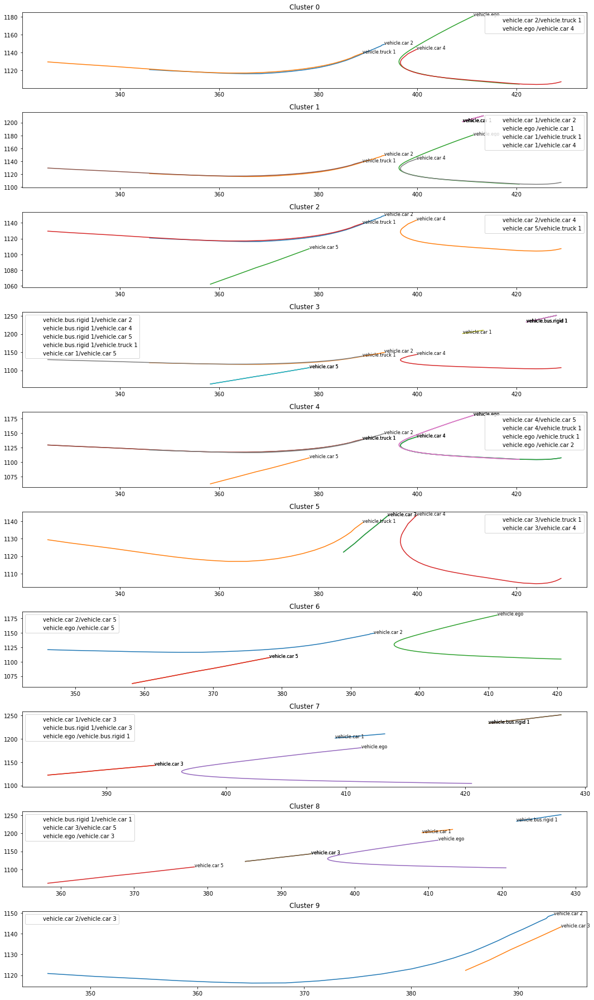

In [117]:
clustering_kmeans(df_61_finale,10)

In [118]:
# Elbow method pour trouver le nombre de cluster optimal 
distortions = []
K = range(1,15)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(df_61_normalise[list(df_61_normalise.columns[5:])])
    distortions.append(kmeanModel.inertia_)

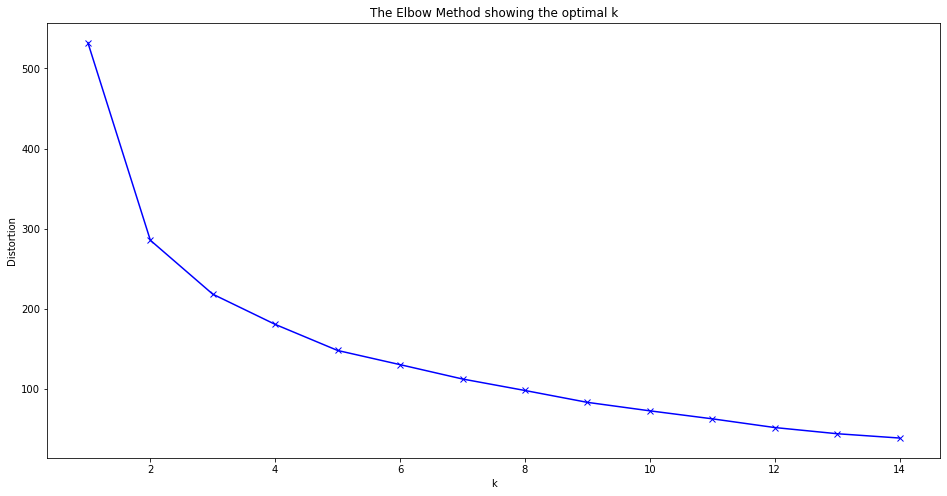

In [119]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

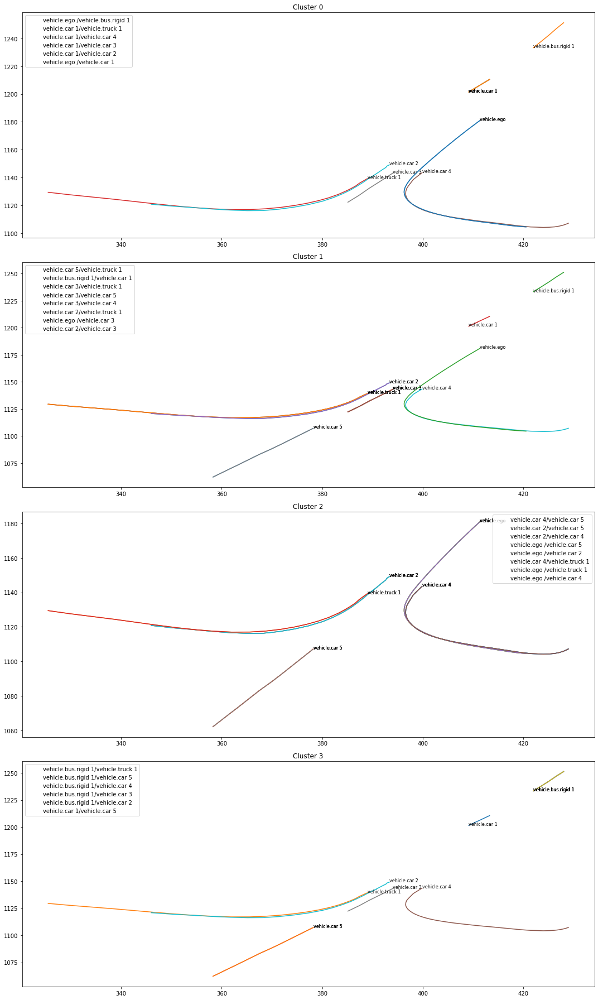

In [120]:
clustering_kmeans(df_61_finale,4)

In [121]:
# kmeans pour une df avec plusieurs scènes
# Fonction qui trace les courbes des véhicules présents dans chaque clusters et 
# donne en légende les couples correspondants

def clustering_kmeans_total(df,nb_clusters):
    
    # ON supprime les Nan de la df
    df = df.dropna()
    
    # On normalise les indicateurs 
    df[list(df.columns[5:])] = StandardScaler().fit_transform(df[list(df.columns[5:])])
    
    kmeans = KMeans(nb_clusters, random_state=0).fit(df[list(df.columns[5:])])
    labels = kmeans.labels_
    df['clusters']=labels
    
    # ON met les labels dans la dataframe
    df = df.sort_values(by=['scene'])
    liste_scene = list(df['scene'].unique())
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(labels)))
    
    nb_scene = len(df['scene'].unique())

    
    fig, axs = plt.subplots(len(labels_unique),nb_scene) # Ici on aura 10 scènes pour commencer 
    #fig.suptitle("Tracé des clusters obtenus avec l'algorithme DSCAN")
    plt.gcf().set_size_inches(20, 20)
    #plt.gcf().subplots_adjust(left = 0.3, bottom = 0.3,right = 0.7, top = 0.9, wspace = 0, hspace = 0.5)
    
    for s in labels_unique:
        
        # On s'occupe d'un cluster 
        df_new = df[df['clusters']==s]
        
        # On classe les lignes par scènes 
        df_new = df_new.sort_values(by=['scene'])
        # On cherche les scènes dans le cluster 
        scene_in_cluster = df_new['scene'].unique()
        
        for h in range(0,len(scene_in_cluster)) :
            # ON s'occupe d'une scene  
        
            # On récupère la place de cette scène dans l'ordre 
            num_scene = liste_scene.index(scene_in_cluster[h])
            
            df_bis = df_new[df_new['scene']==scene_in_cluster[h]]

        
            nb_ligne = len(df_bis)

            Texte_legend = 'Couple de trajectoires \n'

            for j in range(0,nb_ligne):
                current_ligne = df_bis.iloc[j]

                scene_name = current_ligne['scene']
                veh1 = current_ligne['Catégorie Véhicule 1'] # catégorie du véhicule 1 
                veh2 = current_ligne['Catégorie Véhicule 2']# ici on a le nom de la catégorie 
                num_veh2 = current_ligne['Numéro Véhicule 2']-1 # Numéro du véhicule 2 

                scene_token = nusc.field2token('scene','name',scene_name)[0]
                sample_token = nusc.field2token('sample','scene_token',scene_token)# Ensemble des token des échantillons de la scene 

                # Ensemble des sample_annotation de la scène :

                sample_annotation_token = []
                for k in sample_token : 
                    L = nusc.field2token('sample_annotation','sample_token',k)
                    sample_annotation_token = sample_annotation_token + L

                # On créé la liste des token des instances présents dans les sample_annotation
                L_instance_token = []
                for k in sample_annotation_token :
                    exemple = nusc.get('sample_annotation', k)
                    L_instance_token.append(exemple['instance_token'])
                # Puisque pour un même objet, on peut avoir plusieurs annotations, on supprime les doublons de L
                L_instance_token = list(set(L_instance_token))

                ## Véhicule 1 
                if veh1 == 'vehicle.ego':              
                    num_veh1_legend = ''
                    Liste_ego_poses = get_poses(scene_token) 
                    X1 =[]
                    Y1 =[]
                    Z1 =[]
                    T1 = [] # liste des timestamps
                    for k in range(0,len(Liste_ego_poses)):
                        X1.append(Liste_ego_poses[k]['translation'][0])
                        Y1.append(Liste_ego_poses[k]['translation'][1])
                        Z1.append(Liste_ego_poses[k]['translation'][2])
                        T1.append(Liste_ego_poses[k]['timestamp'])
                else :
                    num_veh1 = current_ligne['Numéro Véhicule 1']-1 #numéro du véhicule dans la liste de tous les véh de cette catégo
                    num_veh1_legend = str(num_veh1+1)

                    catego_name = veh1
                    catego_token = nusc.field2token('category','name',catego_name)
                    category = nusc.get('category',catego_token[0])

                    # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                    L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                    L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                    L=[]
                    for k in L_instance_category : 
                        instance_category = nusc.get('instance',k)
                        nbr_annotations = instance_category['nbr_annotations']
                        if nbr_annotations == 1:
                            L.append([instance_category['first_annotation_token']])
                        else : 
                            H = []
                            first_token = instance_category['first_annotation_token']
                            last_token = instance_category['last_annotation_token']
                            current_token = first_token 

                            i = 0 
                            while i!= nbr_annotations :
                                current_ann = nusc.get('sample_annotation', current_token)
                                H.append(current_ann['token'])
                                current_token = current_ann['next'] #On passe au suivant
                                i+=1
                            L.append(H)
                    # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                    # les token des sample_annotation pour un élément de cette catégorie. 

                    # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                    # on va pouvoir récupérer leurs positions 

                    X = []
                    Y = []
                    Z = []
                    T_time = []
                    for k in L :
                        x = []
                        y = []
                        z = []
                        t = []
                        for i in k :
                            sample_annotation = nusc.get('sample_annotation',i)
                            x.append(sample_annotation['translation'][0])
                            y.append(sample_annotation['translation'][1])
                            z.append(sample_annotation['translation'][2])
                            t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                        X.append(x)
                        Y.append(y)
                        Z.append(z)
                        T_time.append(t)

                    Immo, Mobile = immobile(X,Y)

                    # On conserve uniquement les objets mobiles 
                    X_mobile=[X[i] for i in Mobile]
                    Y_mobile=[Y[i] for i in Mobile]
                    Z_mobile=[Z[i] for i in Mobile]
                    T_mobile = [T_time[i] for i in Mobile]

                    X1 =X_mobile[num_veh1] 
                    Y1 =Y_mobile[num_veh1] 
                    Z1 =Z_mobile[num_veh1] 
                    T1 =T_mobile[num_veh1] 

                catego_name = veh2
                catego_token = nusc.field2token('category','name',catego_name)
                category = nusc.get('category',catego_token[0])

                # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                L=[]
                for k in L_instance_category : 
                    instance_category = nusc.get('instance',k)
                    nbr_annotations = instance_category['nbr_annotations']
                    if nbr_annotations == 1:
                        L.append([instance_category['first_annotation_token']])
                    else : 
                        H = []
                        first_token = instance_category['first_annotation_token']
                        last_token = instance_category['last_annotation_token']
                        current_token = first_token 

                        i = 0 
                        while i!= nbr_annotations :
                            current_ann = nusc.get('sample_annotation', current_token)
                            H.append(current_ann['token'])
                            current_token = current_ann['next'] #On passe au suivant
                            i+=1
                        L.append(H)
                    # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                    # les token des sample_annotation pour un élément de cette catégorie. 

                    # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                    # on va pouvoir récupérer leurs positions 

                X = []
                Y = []
                Z = []
                T_time = []
                for k in L :
                    x = []
                    y = []
                    z = []
                    t = []
                    for i in k :
                        sample_annotation = nusc.get('sample_annotation',i)
                        x.append(sample_annotation['translation'][0])
                        y.append(sample_annotation['translation'][1])
                        z.append(sample_annotation['translation'][2])
                        t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                    X.append(x)
                    Y.append(y)
                    Z.append(z)
                    T_time.append(t)

                Immo, Mobile = immobile(X,Y)

                # On conserve uniquement les objets mobiles 
                X_mobile=[X[i] for i in Mobile]
                Y_mobile=[Y[i] for i in Mobile]
                Z_mobile=[Z[i] for i in Mobile]
                T_mobile = [T_time[i] for i in Mobile]

                X2 =X_mobile[num_veh2] 
                Y2 =Y_mobile[num_veh2] 
                Z2 =Z_mobile[num_veh2] 
                T2 =T_mobile[num_veh2] 

                axs[s,num_scene].plot(X1,Y1)
                #axs[s,h].text(X1[0], Y1[0],veh1 + ' '+num_veh1_legend)#,fontsize=8)
                axs[s,num_scene].plot(X2,Y2)
                #axs[s,h].text(X2[0], Y2[0],veh2 + ' '+str(num_veh2+1))#,fontsize=8)
                #axs[s,h].legend(loc='best')
                ##axs[s,num_scene].set_title('Cluster '+str(s)+' dans '+ scene_name)
                #axs[s,h].plot([],[],'w',label = veh1 + ' '+num_veh1_legend +'/'+veh2 + ' '+str(num_veh2+1))   

    plt.tight_layout()
    plt.show()

In [122]:
# Fonction qui renvoie une df avec pour chaque cluster

def liste_cluster_kmeans(df,nb_clusters):
    
    df_cluster = pd.DataFrame()
    
    df = df.dropna()
    
    # On normalise les indicateurs 
    df_normalise = df.copy()
    df_normalise[list(df_normalise.columns[5:])] = StandardScaler().fit_transform(df_normalise[list(df_normalise.columns[5:])])
    
    kmeans = KMeans(nb_clusters, random_state=0).fit(df_normalise[list(df_normalise.columns[5:])])
    labels = kmeans.labels_
    df['clusters']=labels
    
    # ON met les labels dans la dataframe
    df = df.sort_values(by=['clusters'])
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(labels)))
    
    Colonne_index = ['Cluster '+str(labels_unique[k]) for k in range(0,len(labels_unique))]
    df_cluster['Cluster']=Colonne_index
    df_cluster = df_cluster.set_index('Cluster') # On met la liste des noms des clusters en index
    
    # ON prépare les listes qui seront dans la df_cluster
    L_liste_traj = []
    L_DTW_moy = []
    L_DTW_min = []
    L_DTW_max =[]
    L_duree_inter = []
    L_indic_ortho_moy = []
    L_indic_coli_moy = []
    
    for s in labels_unique:
        
        # On s'occupe d'un cluster 
        df_bis = df[df['clusters']==s]
        nb_ligne = len(df_bis)
        
        L_cluster_s =[]
        
        for j in range(0,nb_ligne):
            current_ligne = df_bis.iloc[j]
            L_cluster_s.append(current_ligne.name) # Nom du couple de traj 
        
        L_liste_traj.append(L_cluster_s)
        
        L_DTW_moy.append(np.mean(df_bis['DTW normalisée']))
        L_DTW_min.append(min(df_bis['DTW normalisée']))
        L_DTW_max.append(max(df_bis['DTW normalisée']))
        L_duree_inter.append(np.mean(df_bis["Durée d'interaction"]))
        L_indic_ortho_moy.append(np.mean(df_bis["Indicateur d'orthogonalité moyen"]))
        L_indic_coli_moy.append(np.mean(df_bis['Indicateur de colinéarité moyen']))
    
    df_cluster['Liste des trajectoires appartenant au cluster'] = L_liste_traj
    df_cluster['DTW moyen'] = L_DTW_moy
    df_cluster['DTW minimum'] = L_DTW_min
    df_cluster['DTW maximum'] = L_DTW_max
    df_cluster["Durée d'interaction moyenne"] = L_duree_inter
    df_cluster["Indicateur d'orthogonalité moyen" ] = L_indic_ortho_moy
    df_cluster["Indicateur de colinéarité moyen" ] = L_indic_coli_moy
    
    return df_cluster

In [123]:
df_cluster = liste_cluster_kmeans(df_61_finale,12)
df_cluster 

,Liste des trajectoires appartenant au cluster,DTW moyen,DTW minimum,DTW maximum,Durée d'interaction moyenne,Indicateur d'orthogonalité moyen,Indicateur de colinéarité moyen
Cluster,,,,,,,
Cluster 0,"[vehicle.car 4/ego dans scene-0061, vehicle.ca...",4.084715,3.118809,5.050621,1.000000,0.046449,0.997970
Cluster 1,"[vehicle.car 1 /vehicle.car 2 scene-0061, vehi...",46.739323,24.953401,59.050012,0.073077,0.059442,-0.997807
Cluster 2,"[vehicle.car 2/ego dans scene-0061, vehicle.ca...",26.205031,15.844434,36.836047,0.528689,0.463258,0.732269
Cluster 3,[vehicle.bus.rigid 1 /vehicle.car 3 scene-0061],102.953185,102.953185,102.953185,1.000000,0.077156,-0.996959
Cluster 4,"[vehicle.car 3 /vehicle.car 4 scene-0061, vehi...",11.082575,4.256271,21.718994,0.181230,0.064564,0.995959
Cluster 5,[vehicle.bus.rigid 1 /vehicle.truck 1 scene-00...,90.555702,81.267757,99.637751,0.138820,0.078416,-0.995385
Cluster 6,"[vehicle.car 2 /vehicle.car 4 scene-0061, vehi...",24.709498,22.840678,26.578317,0.561070,0.473105,0.693761
Cluster 7,[vehicle.bus.rigid 1 /vehicle.car 1 scene-0061...,28.768028,25.241409,32.294648,0.309662,0.077569,0.996787
Cluster 8,"[vehicle.car 2 /vehicle.car 5 scene-0061, vehi...",44.783092,35.890745,53.675439,0.417441,0.094718,0.992874


<AxesSubplot:xlabel='Cluster'>

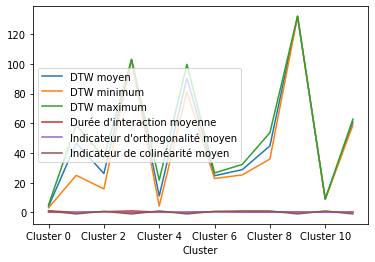

In [124]:
df_cluster.plot()

/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:15: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  from ipykernel import kernelapp as app


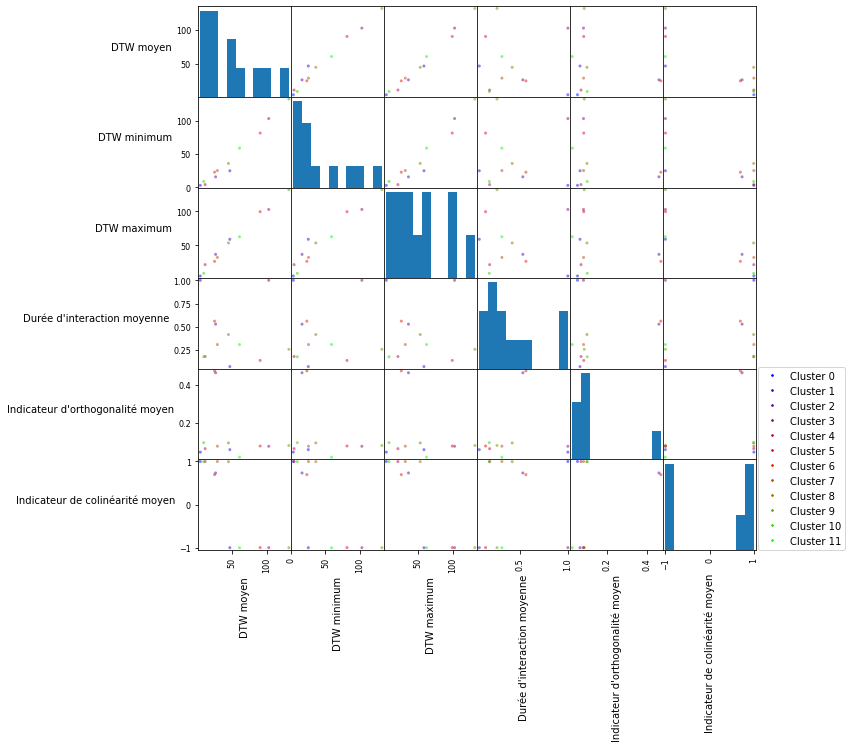

In [125]:
## On va tracer les courbes des colonnes les unes par rapport aux autres, 

# On converti le type des colonnes en float d'abbord
df_cluster[list(df_cluster.columns[1:])] = df_cluster[list(df_cluster.columns[1:])].apply(pd.to_numeric)
axes = pd.plotting.scatter_matrix(df_cluster,c=[plt.cm.brg(i/(len(df_cluster)-1))for i in range(len(df_cluster))],label = list(df_cluster.index),figsize=(10,10))
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')

handles = [plt.plot([],[],color=plt.cm.brg(i/(len(df_cluster)-1)), ls="", marker=".",markersize=np.sqrt(10))[0] for i in range(len(df_cluster))]
labels=list(df_cluster.index)
plt.legend(handles, labels, loc=(1.02,0))

plt.tight_layout()
plt.gcf().subplots_adjust(wspace=0, hspace=0)
plt.show()

In [126]:
df_cluster = liste_cluster_kmeans(df_61_finale,4)
df_cluster 

,Liste des trajectoires appartenant au cluster,DTW moyen,DTW minimum,DTW maximum,Durée d'interaction moyenne,Indicateur d'orthogonalité moyen,Indicateur de colinéarité moyen
Cluster,,,,,,,
Cluster 0,"[vehicle.bus.rigid 1/ego dans scene-0061, vehi...",51.412924,24.953401,62.784244,0.151939,0.046251,-0.998454
Cluster 1,"[vehicle.car 5 /vehicle.truck 1 scene-0061, ve...",16.181185,3.118809,32.294648,0.357864,0.107335,0.981602
Cluster 2,"[vehicle.car 4 /vehicle.car 5 scene-0061, vehi...",27.784701,5.050621,53.675439,0.568768,0.333480,0.802498
Cluster 3,[vehicle.bus.rigid 1 /vehicle.truck 1 scene-00...,99.537692,81.267757,132.050158,0.302278,0.078657,-0.995867


<AxesSubplot:xlabel='Cluster'>

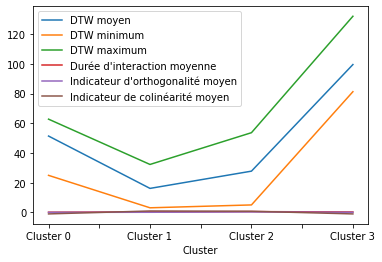

In [127]:
df_cluster.plot()

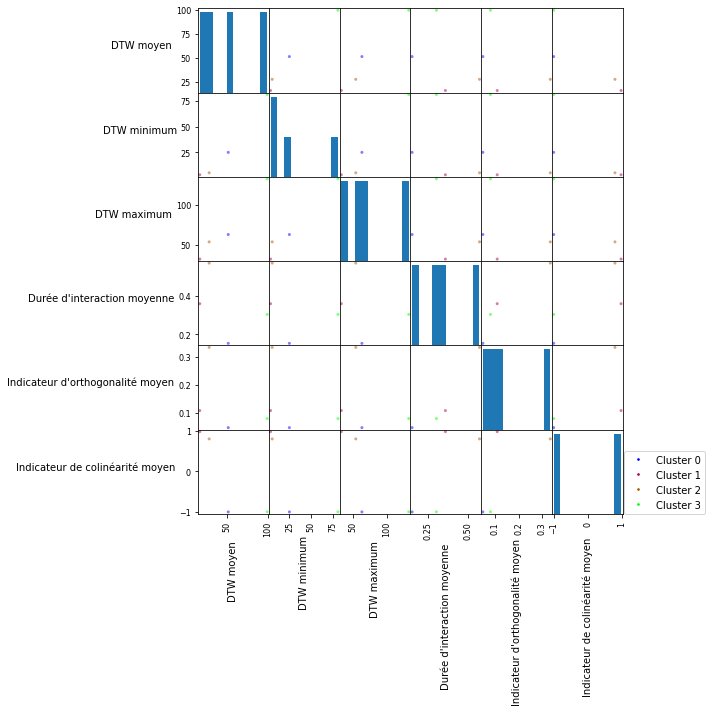

In [128]:
## On va tracer les courbes des colonnes les unes par rapport aux autres, 

# On converti le type des colonnes en float d'abbord
df_cluster[list(df_cluster.columns[1:])] = df_cluster[list(df_cluster.columns[1:])].apply(pd.to_numeric)
axes = pd.plotting.scatter_matrix(df_cluster,c=[plt.cm.brg(i/(len(df_cluster)-1))for i in range(len(df_cluster))],label = list(df_cluster.index),figsize=(10,10))
for ax in axes.flatten():
    ax.xaxis.label.set_rotation(90)
    ax.yaxis.label.set_rotation(0)
    ax.yaxis.label.set_ha('right')

handles = [plt.plot([],[],color=plt.cm.brg(i/(len(df_cluster)-1)), ls="", marker=".",markersize=np.sqrt(10))[0] for i in range(len(df_cluster))]
labels=list(df_cluster.index)
plt.legend(handles, labels, loc=(1.02,0))

plt.tight_layout()
plt.gcf().subplots_adjust(wspace=0, hspace=0)
plt.show()

### Comparaison des méthodes 

In [129]:
## On compare les résultats des méthodes, d'abbord pour la scène 61 
## On prend les individus moyens pour 4 clusters

##### Scène 61 

In [130]:
df_cluster_dbscan = liste_cluster_dbscan(df_61_finale,2,2)
df_cluster_dbscan.index = [df_cluster_dbscan.index[k]+' dbscan' for k in range(len(df_cluster_dbscan.index))]
df_cluster_kmeans = liste_cluster_kmeans(df_61_finale,5)
df_cluster_kmeans.index = [df_cluster_kmeans.index[k]+' kmeans' for k in range(len(df_cluster_kmeans.index))]
df_cluster_ward = liste_cluster_ward(df_61_finale,5)
df_cluster_ward.index = [df_cluster_ward.index[k]+' ward' for k in range(len(df_cluster_ward.index))]

Text(0.5, 1.0, 'Cluster ward')

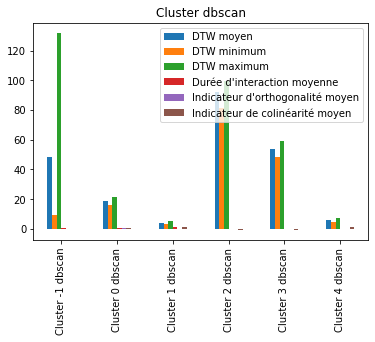

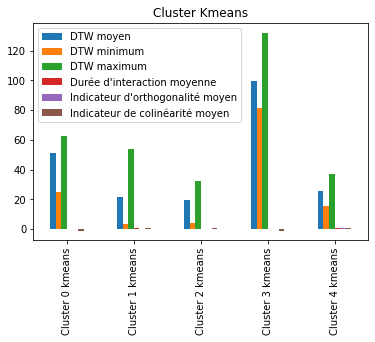

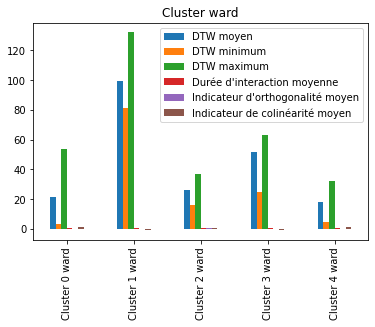

In [131]:
df_cluster_dbscan.plot.bar()
plt.title('Cluster dbscan')
df_cluster_kmeans.plot.bar()
plt.title('Cluster Kmeans')
df_cluster_ward.plot.bar()
plt.title('Cluster ward')

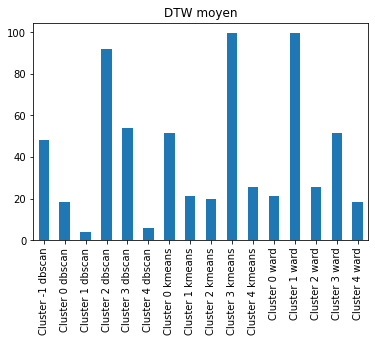

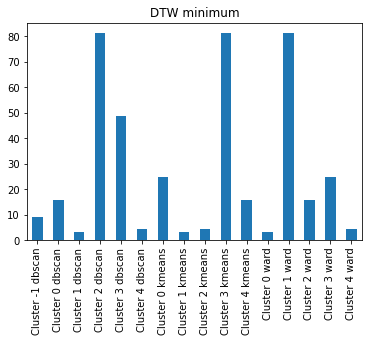

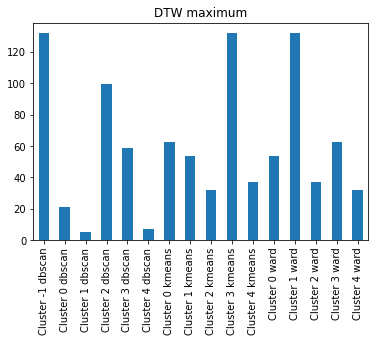

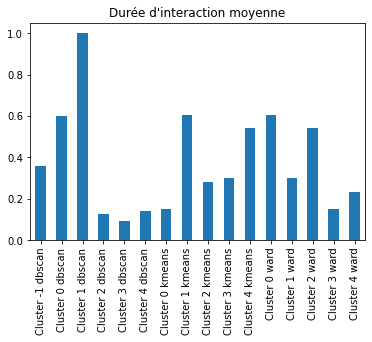

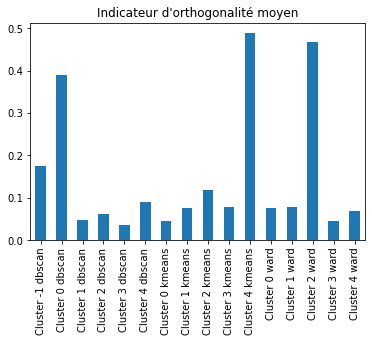

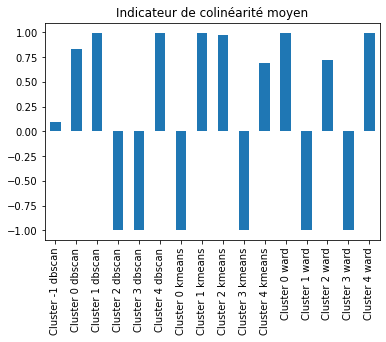

In [132]:
df_tte_methode = pd.concat([df_cluster_dbscan,df_cluster_kmeans,df_cluster_ward])
for column in df_tte_methode.columns[1:]:
    df_tte_methode[column].plot.bar()
    plt.title(column)
    plt.show()

##### Toutes les scènes

In [133]:
df_cluster_dbscan_10 = liste_cluster_dbscan(DF_finale,2,2)
df_cluster_dbscan_10.index = [df_cluster_dbscan_10.index[k]+' dbscan' for k in range(len(df_cluster_dbscan_10.index))]
df_cluster_kmeans_10 = liste_cluster_kmeans(DF_finale,24)
df_cluster_kmeans_10.index = [df_cluster_kmeans_10.index[k]+' kmeans' for k in range(len(df_cluster_kmeans_10.index))]
df_cluster_ward_10 = liste_cluster_ward(DF_finale,24)
df_cluster_ward_10.index = [df_cluster_ward_10.index[k]+' ward' for k in range(len(df_cluster_ward_10.index))]

Text(0.5, 1.0, 'Cluster ward')

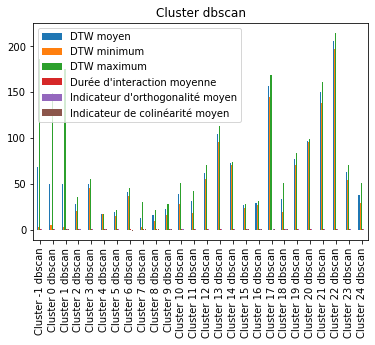

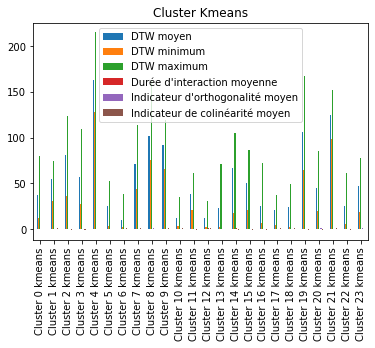

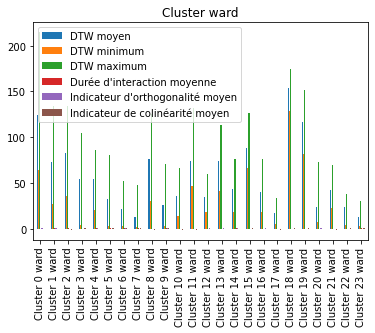

In [134]:
df_cluster_dbscan_10.plot.bar()
plt.title('Cluster dbscan')
df_cluster_kmeans_10.plot.bar()
plt.title('Cluster Kmeans')
df_cluster_ward_10.plot.bar()
plt.title('Cluster ward')

In [135]:
def dist_inter_cluster_kmeans(df,nb_cluster):
    # Liste des centroïdes des clusters et de leurs caractéristiques 
    liste_cluster = liste_cluster_kmeans(df,nb_cluster)
    nb_cluster = len(liste_cluster)
    
    #df en forme de matrice des distances 
    df = pd.DataFrame()
    df['Distance']=list(liste_cluster.index)
    
    for k in range(len(list(liste_cluster.index))):
        L = []
        for j in range(len(list(liste_cluster.index))):
            dist = [(liste_cluster[column].iloc[k]-liste_cluster[column].iloc[j])**2 for column in liste_cluster.columns[1:]]
            L.append(sqrt(sum(dist)))
        df[list(liste_cluster.index)[k]]=L
    df = df.set_index('Distance')
    return df

In [136]:
dist_inter_cluster_kmeans(df_61_finale,5)

,Cluster 0,Cluster 1,Cluster 2,Cluster 3,Cluster 4
Distance,,,,,
Cluster 0,0.000000,38.317461,48.749336,101.415435,37.805895
Cluster 1,38.317461,0.000000,21.487388,135.531017,21.525394
Cluster 2,48.749336,21.487388,0.000000,149.272237,13.815312
Cluster 3,101.415435,135.531017,149.272237,0.000000,137.207198
Cluster 4,37.805895,21.525394,13.815312,137.207198,0.000000


In [137]:
def dist_inter_cluster_ward(df,nb_cluster):
    # Liste des centroïdes des clusters et de leurs caractéristiques 
    liste_cluster = liste_cluster_ward(df,nb_cluster)
    nb_cluster = len(liste_cluster)
    
    #df en forme de matrice des distances 
    df = pd.DataFrame()
    df['Distance']=list(liste_cluster.index)
    
    for k in range(len(list(liste_cluster.index))):
        L = []
        for j in range(len(list(liste_cluster.index))):
            dist = [(liste_cluster[column].iloc[k]-liste_cluster[column].iloc[j])**2 for column in liste_cluster.columns[1:]]
            L.append(sqrt(sum(dist)))
        df[list(liste_cluster.index)[k]]=L
    df = df.set_index('Distance')
    return df

In [138]:
dist_inter_cluster_ward(df_61_finale,5)

,Cluster 0,Cluster 1,Cluster 2,Cluster 3,Cluster 4
Distance,,,,,
Cluster 0,0.000000,135.531017,21.559186,38.317461,21.649651
Cluster 1,135.531017,0.000000,137.113563,101.415435,150.029201
Cluster 2,21.559186,137.113563,0.000000,37.687922,14.568356
Cluster 3,38.317461,101.415435,37.687922,0.000000,49.678420
Cluster 4,21.649651,150.029201,14.568356,49.678420,0.000000


### Résultats dbscan et kmeans sur la df totale

#### Dbscan 

In [139]:
## Détermination du paramètre optimal 

# On supprime les Nan de la DF
DF_finale_bis = DF_finale.dropna()
# Normalisation de la df 
DF_finale_bis[list(DF_finale_bis.columns[5:])] = StandardScaler().fit_transform(DF_finale_bis[list(DF_finale_bis.columns[5:])])

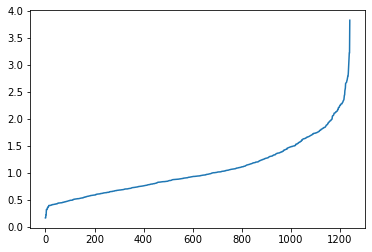

In [140]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(DF_finale_bis[list(DF_finale_bis.columns[5:])])
distances, indices = nbrs.kneighbors(DF_finale_bis[list(DF_finale_bis.columns[5:])])
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

/Users/tiffanydarini/opt/anaconda3/envs/nuscenes/lib/python3.7/site-packages/ipykernel_launcher.py:236: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations


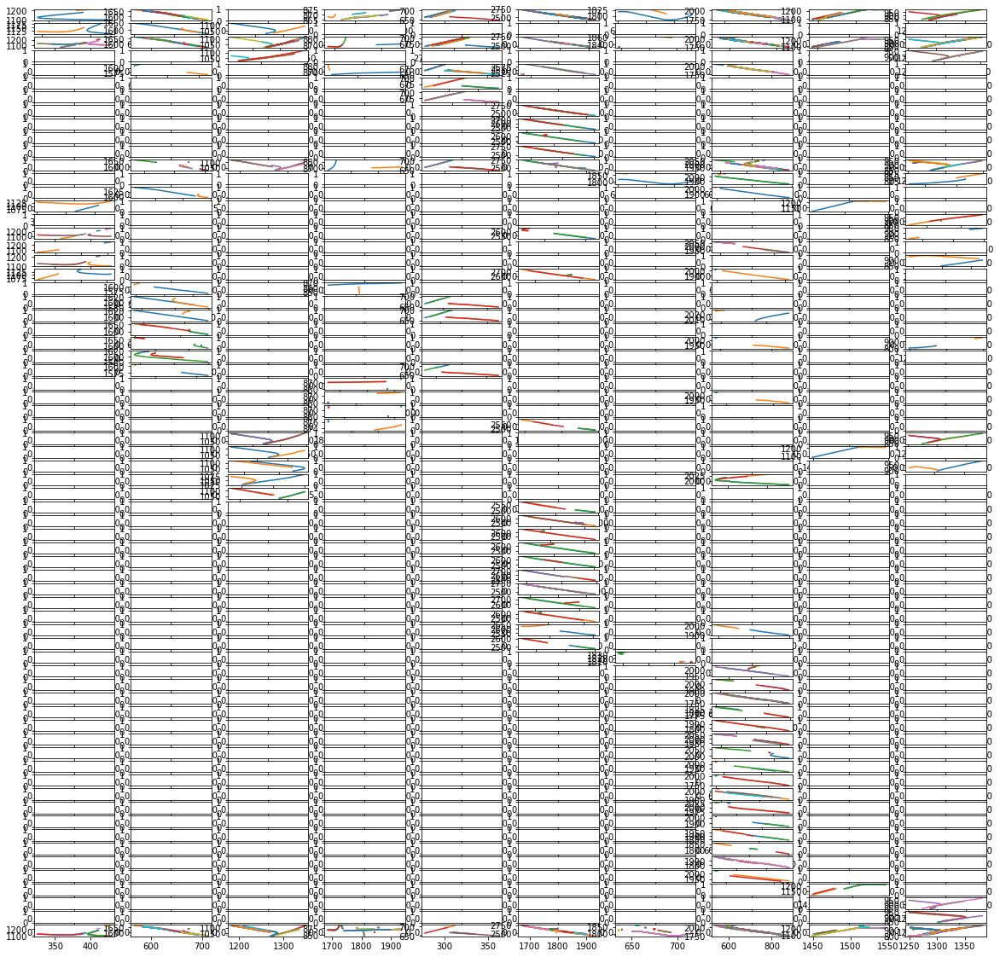

In [141]:
cluster_dbscan_total(DF_finale,1.5,2)

#### Kmeans

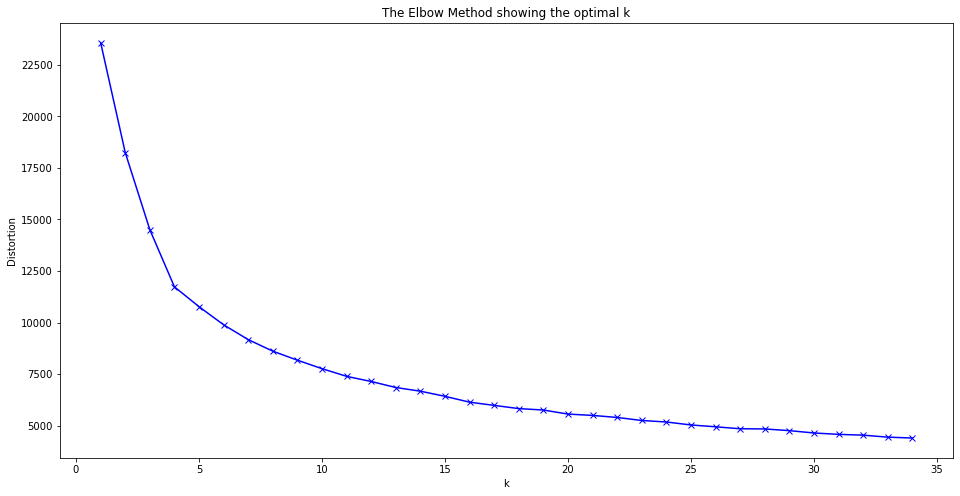

In [142]:
# Elbow method pour trouver le nombre de cluster optimal 
distortions = []
K = range(1,35)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(DF_finale_bis[list(DF_finale_bis.columns[5:])])
    distortions.append(kmeanModel.inertia_)

plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

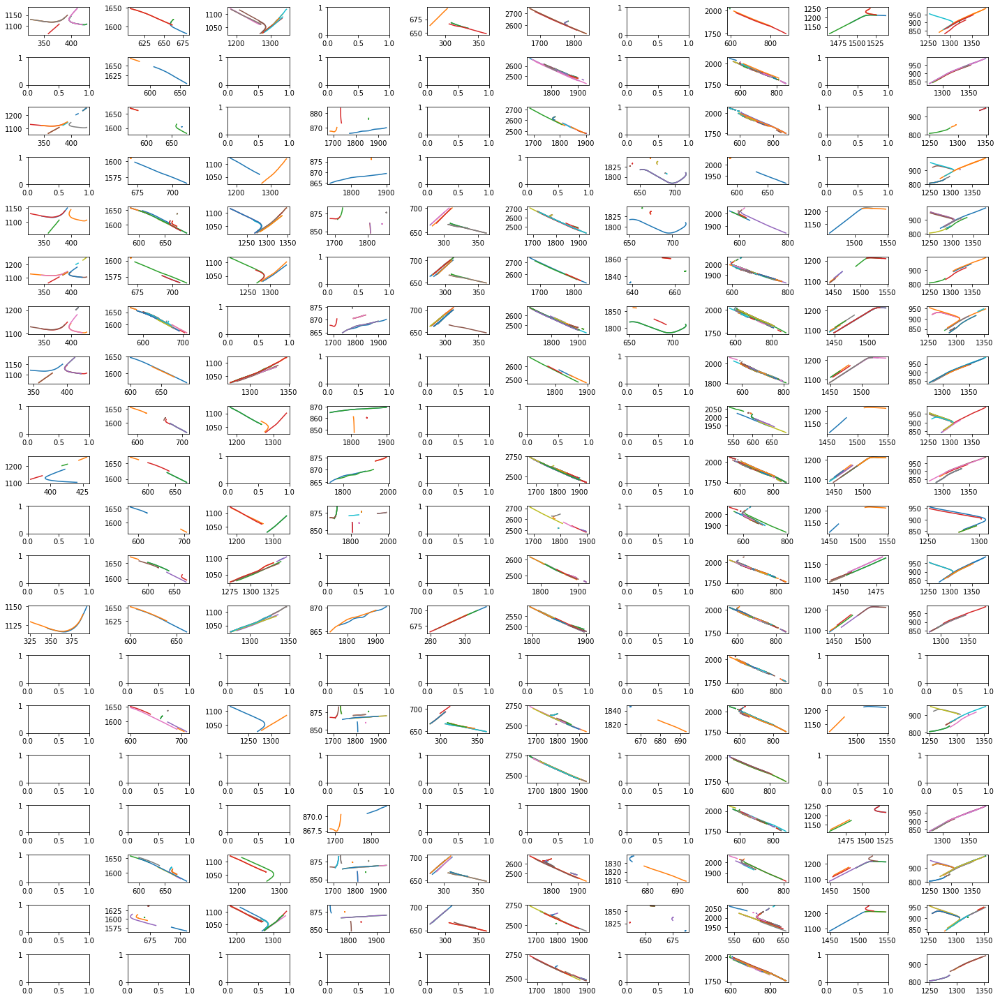

In [143]:
clustering_kmeans_total(DF_finale,20)

### Automatisation de la compréhension des clusters : approche manuelle 

#### Dbscan

In [144]:
def cluster_dbscan_total_modif(df,epsilon,nb_voisin):
    
    # ON supprime les Nan de la df
    df = df.dropna()
    
    # On normalise les indicateurs 
    df[list(df.columns[5:])] = StandardScaler().fit_transform(df[list(df.columns[5:])])
    
    labels = cluster (df[list(df.columns[5:])],epsilon,nb_voisin)
    df['clusters']=labels
    
    # ON met les labels dans la dataframe
    df = df.sort_values(by=['scene'])
    liste_scene = list(df['scene'].unique())
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(labels)))
    
    nb_scene = len(df['scene'].unique())

    
    fig, axs = plt.subplots(len(labels_unique[:2]),nb_scene) # Ici on aura 10 scènes pour commencer 
    #fig.suptitle("Tracé des clusters obtenus avec l'algorithme DSCAN")
    plt.gcf().set_size_inches(20, 20)
    #plt.gcf().subplots_adjust(left = 0.3, bottom = 0.3,right = 0.7, top = 0.9, wspace = 0, hspace = 0.5)
    
    for s in labels_unique[:2]:
        
        # On s'occupe d'un cluster 
        df_new = df[df['clusters']==s]
        
        # On classe les lignes par scènes 
        df_new = df_new.sort_values(by=['scene'])
        # On cherche les scènes dans le cluster 
        scene_in_cluster = df_new['scene'].unique()
        
        for h in range(0,len(scene_in_cluster)) :
            # ON s'occupe d'une scene  
        
            # On récupère la place de cette scène dans l'ordre 
            num_scene = liste_scene.index(scene_in_cluster[h])
            
            df_bis = df_new[df_new['scene']==scene_in_cluster[h]]

        
            nb_ligne = len(df_bis)

            Texte_legend = 'Couple de trajectoires \n'

            for j in range(0,nb_ligne):
                current_ligne = df_bis.iloc[j]

                scene_name = current_ligne['scene']
                veh1 = current_ligne['Catégorie Véhicule 1'] # catégorie du véhicule 1 
                veh2 = current_ligne['Catégorie Véhicule 2']# ici on a le nom de la catégorie 
                num_veh2 = current_ligne['Numéro Véhicule 2']-1 # Numéro du véhicule 2 

                scene_token = nusc.field2token('scene','name',scene_name)[0]
                sample_token = nusc.field2token('sample','scene_token',scene_token)# Ensemble des token des échantillons de la scene 

                # Ensemble des sample_annotation de la scène :

                sample_annotation_token = []
                for k in sample_token : 
                    L = nusc.field2token('sample_annotation','sample_token',k)
                    sample_annotation_token = sample_annotation_token + L

                # On créé la liste des token des instances présents dans les sample_annotation
                L_instance_token = []
                for k in sample_annotation_token :
                    exemple = nusc.get('sample_annotation', k)
                    L_instance_token.append(exemple['instance_token'])
                # Puisque pour un même objet, on peut avoir plusieurs annotations, on supprime les doublons de L
                L_instance_token = list(set(L_instance_token))

                ## Véhicule 1 
                if veh1 == 'vehicle.ego':              
                    num_veh1_legend = ''
                    Liste_ego_poses = get_poses(scene_token) 
                    X1 =[]
                    Y1 =[]
                    Z1 =[]
                    T1 = [] # liste des timestamps
                    for k in range(0,len(Liste_ego_poses)):
                        X1.append(Liste_ego_poses[k]['translation'][0])
                        Y1.append(Liste_ego_poses[k]['translation'][1])
                        Z1.append(Liste_ego_poses[k]['translation'][2])
                        T1.append(Liste_ego_poses[k]['timestamp'])
                else :
                    num_veh1 = current_ligne['Numéro Véhicule 1']-1 #numéro du véhicule dans la liste de tous les véh de cette catégo
                    num_veh1_legend = str(num_veh1+1)

                    catego_name = veh1
                    catego_token = nusc.field2token('category','name',catego_name)
                    category = nusc.get('category',catego_token[0])

                    # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                    L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                    L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                    L=[]
                    for k in L_instance_category : 
                        instance_category = nusc.get('instance',k)
                        nbr_annotations = instance_category['nbr_annotations']
                        if nbr_annotations == 1:
                            L.append([instance_category['first_annotation_token']])
                        else : 
                            H = []
                            first_token = instance_category['first_annotation_token']
                            last_token = instance_category['last_annotation_token']
                            current_token = first_token 

                            i = 0 
                            while i!= nbr_annotations :
                                current_ann = nusc.get('sample_annotation', current_token)
                                H.append(current_ann['token'])
                                current_token = current_ann['next'] #On passe au suivant
                                i+=1
                            L.append(H)
                    # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                    # les token des sample_annotation pour un élément de cette catégorie. 

                    # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                    # on va pouvoir récupérer leurs positions 

                    X = []
                    Y = []
                    Z = []
                    T_time = []
                    for k in L :
                        x = []
                        y = []
                        z = []
                        t = []
                        for i in k :
                            sample_annotation = nusc.get('sample_annotation',i)
                            x.append(sample_annotation['translation'][0])
                            y.append(sample_annotation['translation'][1])
                            z.append(sample_annotation['translation'][2])
                            t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                        X.append(x)
                        Y.append(y)
                        Z.append(z)
                        T_time.append(t)

                    Immo, Mobile = immobile(X,Y)

                    # On conserve uniquement les objets mobiles 
                    X_mobile=[X[i] for i in Mobile]
                    Y_mobile=[Y[i] for i in Mobile]
                    Z_mobile=[Z[i] for i in Mobile]
                    T_mobile = [T_time[i] for i in Mobile]

                    X1 =X_mobile[num_veh1] 
                    Y1 =Y_mobile[num_veh1] 
                    Z1 =Z_mobile[num_veh1] 
                    T1 =T_mobile[num_veh1] 

                catego_name = veh2
                catego_token = nusc.field2token('category','name',catego_name)
                category = nusc.get('category',catego_token[0])

                # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                L=[]
                for k in L_instance_category : 
                    instance_category = nusc.get('instance',k)
                    nbr_annotations = instance_category['nbr_annotations']
                    if nbr_annotations == 1:
                        L.append([instance_category['first_annotation_token']])
                    else : 
                        H = []
                        first_token = instance_category['first_annotation_token']
                        last_token = instance_category['last_annotation_token']
                        current_token = first_token 

                        i = 0 
                        while i!= nbr_annotations :
                            current_ann = nusc.get('sample_annotation', current_token)
                            H.append(current_ann['token'])
                            current_token = current_ann['next'] #On passe au suivant
                            i+=1
                        L.append(H)
                    # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                    # les token des sample_annotation pour un élément de cette catégorie. 

                    # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                    # on va pouvoir récupérer leurs positions 

                X = []
                Y = []
                Z = []
                T_time = []
                for k in L :
                    x = []
                    y = []
                    z = []
                    t = []
                    for i in k :
                        sample_annotation = nusc.get('sample_annotation',i)
                        x.append(sample_annotation['translation'][0])
                        y.append(sample_annotation['translation'][1])
                        z.append(sample_annotation['translation'][2])
                        t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                    X.append(x)
                    Y.append(y)
                    Z.append(z)
                    T_time.append(t)

                Immo, Mobile = immobile(X,Y)

                # On conserve uniquement les objets mobiles 
                X_mobile=[X[i] for i in Mobile]
                Y_mobile=[Y[i] for i in Mobile]
                Z_mobile=[Z[i] for i in Mobile]
                T_mobile = [T_time[i] for i in Mobile]

                X2 =X_mobile[num_veh2] 
                Y2 =Y_mobile[num_veh2] 
                Z2 =Z_mobile[num_veh2] 
                T2 =T_mobile[num_veh2] 

                axs[s,num_scene].plot(X1,Y1)
                #axs[s,h].text(X1[0], Y1[0],veh1 + ' '+num_veh1_legend)#,fontsize=8)
                axs[s,num_scene].plot(X2,Y2)
                #axs[s,h].text(X2[0], Y2[0],veh2 + ' '+str(num_veh2+1))#,fontsize=8)
                #axs[s,h].legend(loc='best')
                axs[s,num_scene].set_title('Cluster '+str(s)+' dans '+ scene_name)
                #axs[s,h].plot([],[],'w',label = veh1 + ' '+num_veh1_legend +'/'+veh2 + ' '+str(num_veh2+1))   

    plt.tight_layout()
    plt.show()

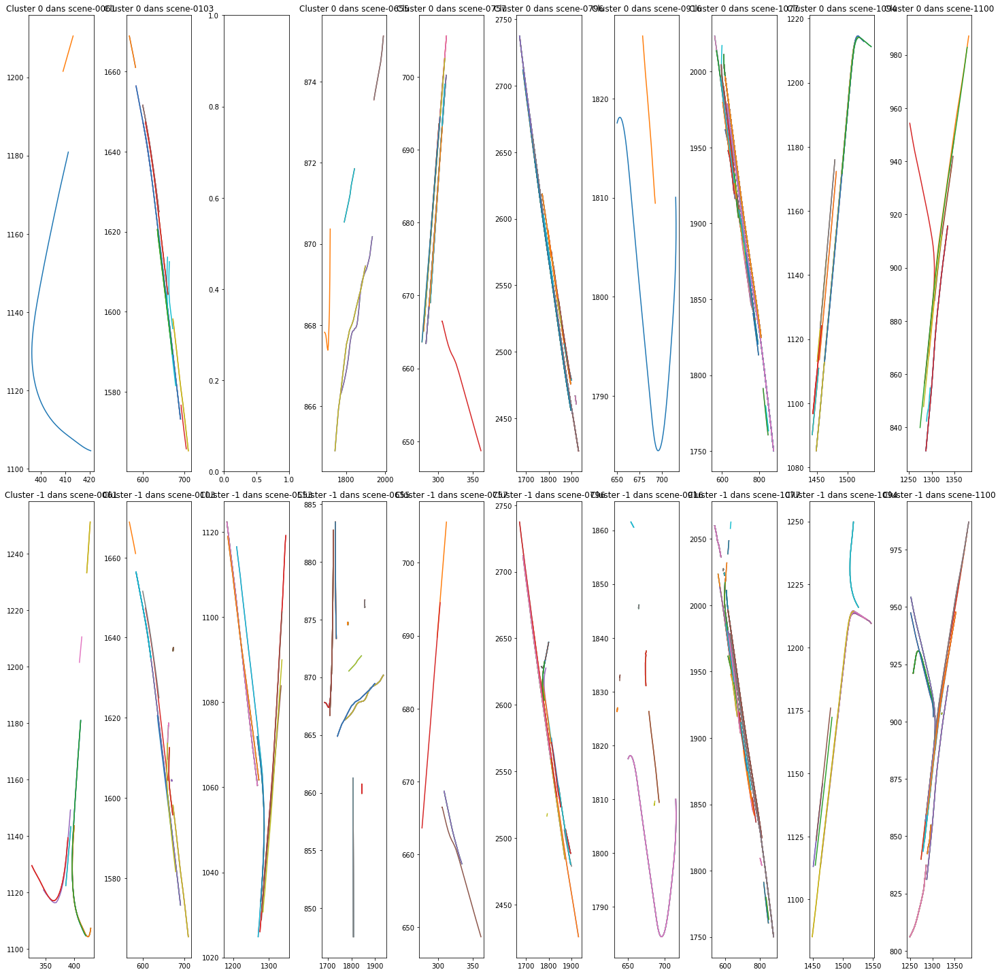

In [145]:
cluster_dbscan_total_modif(DF_finale,1.5,2)

In [146]:
def cluster_dbscan_total_modif(df,epsilon,nb_voisin):
    
    # ON supprime les Nan de la df
    df = df.dropna()
    
    # On normalise les indicateurs 
    df[list(df.columns[5:])] = StandardScaler().fit_transform(df[list(df.columns[5:])])
    
    labels = cluster (df[list(df.columns[5:])],epsilon,nb_voisin)
    df['clusters']=labels
    
    # ON met les labels dans la dataframe
    df = df.sort_values(by=['scene'])
    liste_scene = list(df['scene'].unique())
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(labels)))
    
    nb_scene = len(df['scene'].unique())

    
    fig, axs = plt.subplots(len(labels_unique[1:4]),3) # Ici on aura 10 scènes pour commencer 
    #fig.suptitle("Tracé des clusters obtenus avec l'algorithme DSCAN")
    plt.gcf().set_size_inches(20, 20)
    #plt.gcf().subplots_adjust(left = 0.3, bottom = 0.9,right = 0.7, top = 0.9, wspace = 0, hspace = 0.5)
    
    for s in labels_unique[1:4]:
        
        # On s'occupe d'un cluster 
        df_new = df[df['clusters']==s]
        
        # On classe les lignes par scènes 
        df_new = df_new.sort_values(by=['scene'])
        # On cherche les scènes dans le cluster 
        scene_in_cluster = df_new['scene'].unique()
        
        for h in range(0,3) :
            # ON s'occupe d'une scene  
        
            # On récupère la place de cette scène dans l'ordre 
            #num_scene = liste_scene.index(scene_in_cluster[h])
            
            df_bis = df_new[df_new['scene']==liste_scene[h]]

            nb_ligne = len(df_bis)

            Texte_legend = 'Couple de trajectoires \n'

            for j in range(0,nb_ligne):
                current_ligne = df_bis.iloc[j]

                scene_name = current_ligne['scene']
                veh1 = current_ligne['Catégorie Véhicule 1'] # catégorie du véhicule 1 
                veh2 = current_ligne['Catégorie Véhicule 2']# ici on a le nom de la catégorie 
                num_veh2 = current_ligne['Numéro Véhicule 2']-1 # Numéro du véhicule 2 

                scene_token = nusc.field2token('scene','name',scene_name)[0]
                sample_token = nusc.field2token('sample','scene_token',scene_token)# Ensemble des token des échantillons de la scene 

                # Ensemble des sample_annotation de la scène :

                sample_annotation_token = []
                for k in sample_token : 
                    L = nusc.field2token('sample_annotation','sample_token',k)
                    sample_annotation_token = sample_annotation_token + L

                # On créé la liste des token des instances présents dans les sample_annotation
                L_instance_token = []
                for k in sample_annotation_token :
                    exemple = nusc.get('sample_annotation', k)
                    L_instance_token.append(exemple['instance_token'])
                # Puisque pour un même objet, on peut avoir plusieurs annotations, on supprime les doublons de L
                L_instance_token = list(set(L_instance_token))

                ## Véhicule 1 
                if veh1 == 'vehicle.ego':              
                    num_veh1_legend = ''
                    Liste_ego_poses = get_poses(scene_token) 
                    X1 =[]
                    Y1 =[]
                    Z1 =[]
                    T1 = [] # liste des timestamps
                    for k in range(0,len(Liste_ego_poses)):
                        X1.append(Liste_ego_poses[k]['translation'][0])
                        Y1.append(Liste_ego_poses[k]['translation'][1])
                        Z1.append(Liste_ego_poses[k]['translation'][2])
                        T1.append(Liste_ego_poses[k]['timestamp'])
                else :
                    num_veh1 = current_ligne['Numéro Véhicule 1']-1 #numéro du véhicule dans la liste de tous les véh de cette catégo
                    num_veh1_legend = str(num_veh1+1)

                    catego_name = veh1
                    catego_token = nusc.field2token('category','name',catego_name)
                    category = nusc.get('category',catego_token[0])

                    # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                    L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                    L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                    L=[]
                    for k in L_instance_category : 
                        instance_category = nusc.get('instance',k)
                        nbr_annotations = instance_category['nbr_annotations']
                        if nbr_annotations == 1:
                            L.append([instance_category['first_annotation_token']])
                        else : 
                            H = []
                            first_token = instance_category['first_annotation_token']
                            last_token = instance_category['last_annotation_token']
                            current_token = first_token 

                            i = 0 
                            while i!= nbr_annotations :
                                current_ann = nusc.get('sample_annotation', current_token)
                                H.append(current_ann['token'])
                                current_token = current_ann['next'] #On passe au suivant
                                i+=1
                            L.append(H)
                    # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                    # les token des sample_annotation pour un élément de cette catégorie. 

                    # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                    # on va pouvoir récupérer leurs positions 

                    X = []
                    Y = []
                    Z = []
                    T_time = []
                    for k in L :
                        x = []
                        y = []
                        z = []
                        t = []
                        for i in k :
                            sample_annotation = nusc.get('sample_annotation',i)
                            x.append(sample_annotation['translation'][0])
                            y.append(sample_annotation['translation'][1])
                            z.append(sample_annotation['translation'][2])
                            t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                        X.append(x)
                        Y.append(y)
                        Z.append(z)
                        T_time.append(t)

                    Immo, Mobile = immobile(X,Y)

                    # On conserve uniquement les objets mobiles 
                    X_mobile=[X[i] for i in Mobile]
                    Y_mobile=[Y[i] for i in Mobile]
                    Z_mobile=[Z[i] for i in Mobile]
                    T_mobile = [T_time[i] for i in Mobile]

                    X1 =X_mobile[num_veh1] 
                    Y1 =Y_mobile[num_veh1] 
                    Z1 =Z_mobile[num_veh1] 
                    T1 =T_mobile[num_veh1] 

                catego_name = veh2
                catego_token = nusc.field2token('category','name',catego_name)
                category = nusc.get('category',catego_token[0])

                # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                L=[]
                for k in L_instance_category : 
                    instance_category = nusc.get('instance',k)
                    nbr_annotations = instance_category['nbr_annotations']
                    if nbr_annotations == 1:
                        L.append([instance_category['first_annotation_token']])
                    else : 
                        H = []
                        first_token = instance_category['first_annotation_token']
                        last_token = instance_category['last_annotation_token']
                        current_token = first_token 

                        i = 0 
                        while i!= nbr_annotations :
                            current_ann = nusc.get('sample_annotation', current_token)
                            H.append(current_ann['token'])
                            current_token = current_ann['next'] #On passe au suivant
                            i+=1
                        L.append(H)
                    # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                    # les token des sample_annotation pour un élément de cette catégorie. 

                    # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                    # on va pouvoir récupérer leurs positions 

                X = []
                Y = []
                Z = []
                T_time = []
                for k in L :
                    x = []
                    y = []
                    z = []
                    t = []
                    for i in k :
                        sample_annotation = nusc.get('sample_annotation',i)
                        x.append(sample_annotation['translation'][0])
                        y.append(sample_annotation['translation'][1])
                        z.append(sample_annotation['translation'][2])
                        t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                    X.append(x)
                    Y.append(y)
                    Z.append(z)
                    T_time.append(t)

                Immo, Mobile = immobile(X,Y)

                # On conserve uniquement les objets mobiles 
                X_mobile=[X[i] for i in Mobile]
                Y_mobile=[Y[i] for i in Mobile]
                Z_mobile=[Z[i] for i in Mobile]
                T_mobile = [T_time[i] for i in Mobile]

                X2 =X_mobile[num_veh2] 
                Y2 =Y_mobile[num_veh2] 
                Z2 =Z_mobile[num_veh2] 
                T2 =T_mobile[num_veh2]

                axs[s,h].plot(X1,Y1)
                axs[s,h].text(X1[0], Y1[0],veh1 + ' '+num_veh1_legend)#,fontsize=8)
                axs[s,h].plot(X2,Y2)
                axs[s,h].text(X2[0], Y2[0],veh2 + ' '+str(num_veh2+1))#,fontsize=8)
                axs[s,h].legend(loc='best')
                axs[s,h].set_title('Cluster '+str(s)+' dans '+ scene_name)
                axs[s,h].plot([],[],'w',label = veh1 + ' '+num_veh1_legend +'/'+veh2 + ' '+str(num_veh2+1))   

    plt.tight_layout()
    plt.show()

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


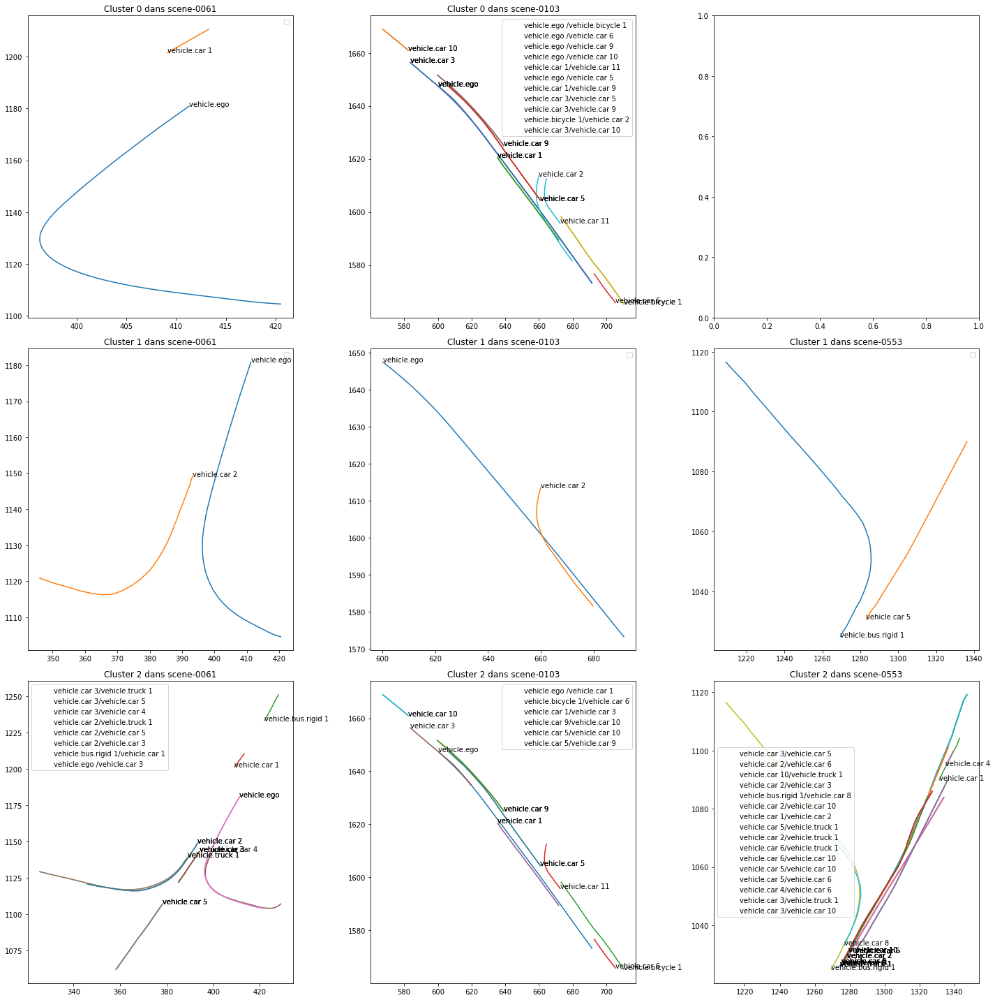

In [147]:
cluster_dbscan_total_modif(DF_finale,1.5,2)

In [148]:
#On trace le résultat du clustering par cluster 

def cluster_dbscan_total_cluster(df,epsilon,nb_voisin,num_cluster):
    
    # ON supprime les Nan de la df
    df = df.dropna()
    
    # On normalise les indicateurs 
    df[list(df.columns[5:])] = StandardScaler().fit_transform(df[list(df.columns[5:])])
    
    labels = cluster (df[list(df.columns[5:])],epsilon,nb_voisin)
    df['clusters']=labels
    
    # On garde uniquement la scène voulue 
    df = df[df['clusters']==num_cluster]
    liste_scene = list(df['scene'].unique())
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(df['clusters'].values)))
    
    nb_scene = len(df['scene'].unique())

    
    fig, axs = plt.subplots(3) # Ici on aura 10 scènes pour commencer 
    #fig.suptitle("Tracé des clusters obtenus avec l'algorithme DSCAN")
    plt.gcf().set_size_inches(20, 20)
    #plt.gcf().subplots_adjust(left = 0.3, bottom = 0.3,right = 0.7, top = 0.9, wspace = 0, hspace = 0.5)
    
    counter = -1 
    for s in labels_unique:
        
        # On s'occupe d'un cluster 
        df_new = df[df['clusters']==s]
        
        # On classe les lignes par scènes 
        df_new = df_new.sort_values(by=['scene'])
        # On cherche les scènes dans le cluster 
        scene_in_cluster = df_new['scene'].unique()
        
        for h in range(0,len(scene_in_cluster[:3])) :
            # ON s'occupe d'une scene  
        
            # On récupère la place de cette scène dans l'ordre 
            num_scene = liste_scene.index(scene_in_cluster[h])
            
            df_bis = df_new[df_new['scene']==scene_in_cluster[h]]

        
            nb_ligne = len(df_bis)

            Texte_legend = 'Couple de trajectoires \n'

            for j in range(0,nb_ligne):
                current_ligne = df_bis.iloc[j]

                scene_name = current_ligne['scene']
                veh1 = current_ligne['Catégorie Véhicule 1'] # catégorie du véhicule 1 
                veh2 = current_ligne['Catégorie Véhicule 2']# ici on a le nom de la catégorie 
                num_veh2 = current_ligne['Numéro Véhicule 2']-1 # Numéro du véhicule 2 

                scene_token = nusc.field2token('scene','name',scene_name)[0]
                sample_token = nusc.field2token('sample','scene_token',scene_token)# Ensemble des token des échantillons de la scene 

                # Ensemble des sample_annotation de la scène :

                sample_annotation_token = []
                for k in sample_token : 
                    L = nusc.field2token('sample_annotation','sample_token',k)
                    sample_annotation_token = sample_annotation_token + L

                # On créé la liste des token des instances présents dans les sample_annotation
                L_instance_token = []
                for k in sample_annotation_token :
                    exemple = nusc.get('sample_annotation', k)
                    L_instance_token.append(exemple['instance_token'])
                # Puisque pour un même objet, on peut avoir plusieurs annotations, on supprime les doublons de L
                L_instance_token = list(set(L_instance_token))

                ## Véhicule 1 
                if veh1 == 'vehicle.ego':              
                    num_veh1_legend = ''
                    Liste_ego_poses = get_poses(scene_token) 
                    X1 =[]
                    Y1 =[]
                    Z1 =[]
                    T1 = [] # liste des timestamps
                    for k in range(0,len(Liste_ego_poses)):
                        X1.append(Liste_ego_poses[k]['translation'][0])
                        Y1.append(Liste_ego_poses[k]['translation'][1])
                        Z1.append(Liste_ego_poses[k]['translation'][2])
                        T1.append(Liste_ego_poses[k]['timestamp'])
                else :
                    num_veh1 = current_ligne['Numéro Véhicule 1']-1 #numéro du véhicule dans la liste de tous les véh de cette catégo
                    num_veh1_legend = str(num_veh1+1)

                    catego_name = veh1
                    catego_token = nusc.field2token('category','name',catego_name)
                    category = nusc.get('category',catego_token[0])

                    # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                    L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                    L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                    L=[]
                    for k in L_instance_category : 
                        instance_category = nusc.get('instance',k)
                        nbr_annotations = instance_category['nbr_annotations']
                        if nbr_annotations == 1:
                            L.append([instance_category['first_annotation_token']])
                        else : 
                            H = []
                            first_token = instance_category['first_annotation_token']
                            last_token = instance_category['last_annotation_token']
                            current_token = first_token 

                            i = 0 
                            while i!= nbr_annotations :
                                current_ann = nusc.get('sample_annotation', current_token)
                                H.append(current_ann['token'])
                                current_token = current_ann['next'] #On passe au suivant
                                i+=1
                            L.append(H)
                    # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                    # les token des sample_annotation pour un élément de cette catégorie. 

                    # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                    # on va pouvoir récupérer leurs positions 

                    X = []
                    Y = []
                    Z = []
                    T_time = []
                    for k in L :
                        x = []
                        y = []
                        z = []
                        t = []
                        for i in k :
                            sample_annotation = nusc.get('sample_annotation',i)
                            x.append(sample_annotation['translation'][0])
                            y.append(sample_annotation['translation'][1])
                            z.append(sample_annotation['translation'][2])
                            t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                        X.append(x)
                        Y.append(y)
                        Z.append(z)
                        T_time.append(t)

                    Immo, Mobile = immobile(X,Y)

                    # On conserve uniquement les objets mobiles 
                    X_mobile=[X[i] for i in Mobile]
                    Y_mobile=[Y[i] for i in Mobile]
                    Z_mobile=[Z[i] for i in Mobile]
                    T_mobile = [T_time[i] for i in Mobile]

                    X1 =X_mobile[num_veh1] 
                    Y1 =Y_mobile[num_veh1] 
                    Z1 =Z_mobile[num_veh1] 
                    T1 =T_mobile[num_veh1] 

                catego_name = veh2
                catego_token = nusc.field2token('category','name',catego_name)
                category = nusc.get('category',catego_token[0])

                # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                L=[]
                for k in L_instance_category : 
                    instance_category = nusc.get('instance',k)
                    nbr_annotations = instance_category['nbr_annotations']
                    if nbr_annotations == 1:
                        L.append([instance_category['first_annotation_token']])
                    else : 
                        H = []
                        first_token = instance_category['first_annotation_token']
                        last_token = instance_category['last_annotation_token']
                        current_token = first_token 

                        i = 0 
                        while i!= nbr_annotations :
                            current_ann = nusc.get('sample_annotation', current_token)
                            H.append(current_ann['token'])
                            current_token = current_ann['next'] #On passe au suivant
                            i+=1
                        L.append(H)
                    # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                    # les token des sample_annotation pour un élément de cette catégorie. 

                    # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                    # on va pouvoir récupérer leurs positions 

                X = []
                Y = []
                Z = []
                T_time = []
                for k in L :
                    x = []
                    y = []
                    z = []
                    t = []
                    for i in k :
                        sample_annotation = nusc.get('sample_annotation',i)
                        x.append(sample_annotation['translation'][0])
                        y.append(sample_annotation['translation'][1])
                        z.append(sample_annotation['translation'][2])
                        t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                    X.append(x)
                    Y.append(y)
                    Z.append(z)
                    T_time.append(t)

                Immo, Mobile = immobile(X,Y)

                # On conserve uniquement les objets mobiles 
                X_mobile=[X[i] for i in Mobile]
                Y_mobile=[Y[i] for i in Mobile]
                Z_mobile=[Z[i] for i in Mobile]
                T_mobile = [T_time[i] for i in Mobile]

                X2 =X_mobile[num_veh2] 
                Y2 =Y_mobile[num_veh2] 
                Z2 =Z_mobile[num_veh2] 
                T2 =T_mobile[num_veh2] 
                
               # print(counter)

                axs[h].plot(X1,Y1)
                axs[h].text(X1[0], Y1[0],veh1 + ' '+num_veh1_legend)#,fontsize=8)
                axs[h].plot(X2,Y2)
                axs[h].text(X2[0], Y2[0],veh2 + ' '+str(num_veh2+1))#,fontsize=8)
                axs[h].set_title('Cluster '+str(s)+' dans '+ scene_name)
                axs[h].plot([],[],'w',label = veh1 + ' '+num_veh1_legend +'/'+veh2 + ' '+str(num_veh2+1)) 
                axs[h].legend(loc='best')

    plt.tight_layout()
    plt.show()

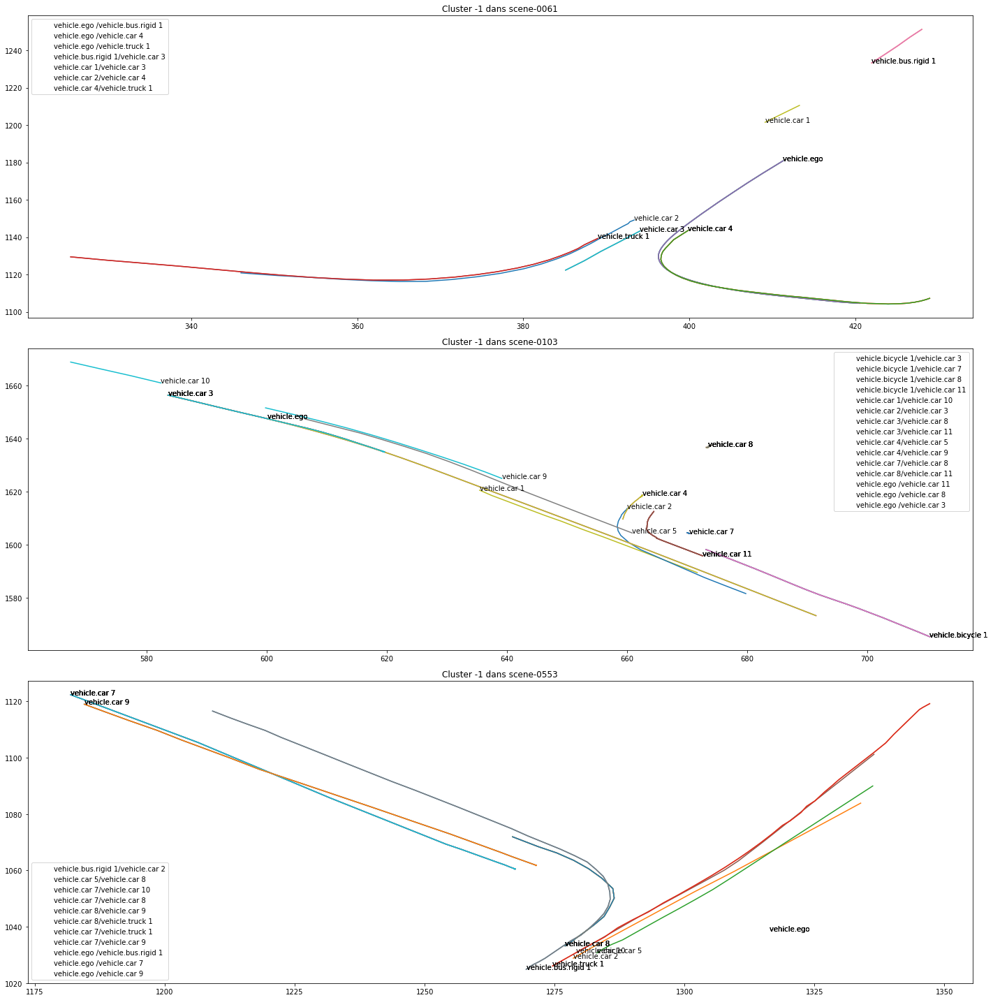

In [149]:
cluster_dbscan_total_cluster(DF_finale,1.5,2,-1)

In [150]:
def description_cluster_dbscan(df,epsilon,nb_voisin):
    
    df_cluster = pd.DataFrame()
    
    # ON supprime les Nan de la df
    df = df.dropna()
    
    # On normalise les indicateurs 
    df[list(df.columns[5:])] = StandardScaler().fit_transform(df[list(df.columns[5:])])
    
    labels = cluster (df[list(df.columns[5:])],epsilon,nb_voisin)
    df['clusters']=labels
    
    # ON met les labels dans la dataframe
    df = df.sort_values(by=['scene'])
    liste_scene = list(df['scene'].unique())
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(labels)))
    
    nb_scene = len(df['scene'].unique())

    Colonne = []
    for k in liste_scene :
        Colonne.append('Nbre élément '+k)
        Colonne.append('Éléments '+k)
        
    df_cluster['Colonne']=Colonne
    df_cluster =df_cluster.set_index('Colonne')

    for s in labels_unique:
        
        L = [] # liste qu'on va mettre dans la df 
        
        # On s'occupe d'un cluster 
        df_new = df[df['clusters']==s]
        
        # On classe les lignes par scènes 
        df_new = df_new.sort_values(by=['scene'])
        # On cherche les scènes dans le cluster 
        scene_in_cluster = df_new['scene'].unique()
        
        for h in range(0,nb_scene) :
            
            # ON s'occupe d'une scene  
            df_bis = df_new[df_new['scene']==liste_scene[h]]
            
            # On regarde combien d'éléments sont dans le cluster s et dans la scène 
            nb_ligne = len(df_bis)
            L.append(len(df_bis))
            
            if nb_ligne ==0:
                L.append(np.nan) # Il n'y a pas d'élément de cette scène dans le cluster 
            else : 
                L_element = []
                for j in range(0,nb_ligne):
                    L_element.append(df_bis.iloc[j].name)
                L.append(L_element)
                    
        df_cluster['Cluster ' +str(s)]=L
    return df_cluster.transpose()

In [151]:
description_cluster_dbscan(DF_finale,1.5,2)

Colonne,Nbre élément scene-0061,Éléments scene-0061,Nbre élément scene-0103,Éléments scene-0103,Nbre élément scene-0553,Éléments scene-0553,Nbre élément scene-0655,Éléments scene-0655,Nbre élément scene-0757,Éléments scene-0757,Nbre élément scene-0796,Éléments scene-0796,Nbre élément scene-0916,Éléments scene-0916,Nbre élément scene-1077,Éléments scene-1077,Nbre élément scene-1094,Éléments scene-1094,Nbre élément scene-1100,Éléments scene-1100
Cluster -1,7,"[vehicle.bus.rigid 1/ego dans scene-0061, vehi...",15,"[vehicle.car 11/ego dans scene-0103, vehicle.c...",11,"[vehicle.car 7/ego dans scene-0553, vehicle.ca...",31,"[vehicle.car 5 /vehicle.car 8 scene-0655, vehi...",3,"[vehicle.car 6/ego dans scene-0757, vehicle.ca...",27,"[vehicle.car 19 /vehicle.truck 1 scene-0796, v...",10,"[vehicle.car 1 /vehicle.truck 1 scene-0916, ve...",79,"[vehicle.car 8/ego dans scene-1077, vehicle.ca...",10,[vehicle.bus.rigid 1 /vehicle.car 1 scene-1094...,31,[vehicle.bus.rigid 1 /vehicle.car 9 scene-1100...
Cluster 0,1,[vehicle.car 1/ego dans scene-0061],12,"[vehicle.bicycle 1/ego dans scene-0103, vehicl...",0,NaN,5,"[vehicle.car 1 /vehicle.truck 1 scene-0655, ve...",16,"[vehicle.car 4 /vehicle.truck 1 scene-0757, ve...",51,"[vehicle.car 5 /vehicle.car 11 scene-0796, veh...",1,[vehicle.truck 1/ego dans scene-0916],96,"[vehicle.car 1/ego dans scene-1077, vehicle.ca...",12,"[vehicle.bus.rigid 1/ego dans scene-1094, vehi...",7,"[vehicle.car 2 /vehicle.car 5 scene-1100, vehi..."
Cluster 1,1,[vehicle.car 2/ego dans scene-0061],1,[vehicle.car 2/ego dans scene-0103],1,[vehicle.bus.rigid 1 /vehicle.car 5 scene-0553],0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN
Cluster 2,9,"[vehicle.car 3 /vehicle.truck 1 scene-0061, ve...",7,"[vehicle.car 1/ego dans scene-0103, vehicle.bi...",17,"[vehicle.car 3 /vehicle.car 5 scene-0553, vehi...",2,"[vehicle.car 6 /vehicle.truck 1 scene-0655, ve...",12,"[vehicle.car 4/ego dans scene-0757, vehicle.ca...",29,"[vehicle.car 4 /vehicle.car 17 scene-0796, veh...",2,"[vehicle.car 1 /vehicle.car 6 scene-0916, vehi...",425,"[vehicle.car 2 /vehicle.car 16 scene-1077, veh...",14,"[vehicle.car 2 /vehicle.car 7 scene-1094, vehi...",25,"[vehicle.car 8 /vehicle.car 11 scene-1100, veh..."
Cluster 3,0,NaN,0,NaN,7,"[vehicle.car 2/ego dans scene-0553, vehicle.ca...",0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,4,"[vehicle.car 3/ego dans scene-1100, vehicle.ca..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Cluster 62,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,4,"[vehicle.car 32 /vehicle.car 48 scene-1077, ve...",0,NaN,0,NaN
Cluster 63,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,2,"[vehicle.car 33 /vehicle.car 40 scene-1077, ve...",0,NaN,0,NaN
Cluster 64,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,2,"[vehicle.car 1 /vehicle.car 2 scene-1094, vehi...",0,NaN
Cluster 65,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,4,"[vehicle.car 5 /vehicle.car 12 scene-1100, veh..."


#### Kmeans

In [152]:
def cluster_kmeans_total_modif(df,nb_clusters):
    
    # ON supprime les Nan de la df
    df = df.dropna()
    
    # On normalise les indicateurs 
    df[list(df.columns[5:])] = StandardScaler().fit_transform(df[list(df.columns[5:])])
    
    kmeans = KMeans(nb_clusters, random_state=0).fit(df[list(df.columns[5:])])
    labels = kmeans.labels_
    df['clusters']=labels
    
    # ON met les labels dans la dataframe
    df = df.sort_values(by=['scene'])
    liste_scene = list(df['scene'].unique())
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(labels)))
    
    nb_scene = len(df['scene'].unique())

    
    fig, axs = plt.subplots(len(labels_unique[:4]),nb_scene) # Ici on aura 10 scènes pour commencer 
    #fig.suptitle("Tracé des clusters obtenus avec l'algorithme DSCAN")
    plt.gcf().set_size_inches(20, 20)
    #plt.gcf().subplots_adjust(left = 0.3, bottom = 0.3,right = 0.7, top = 0.9, wspace = 0, hspace = 0.5)
    
    for s in labels_unique[:4]:
        
        # On s'occupe d'un cluster 
        df_new = df[df['clusters']==s]
        
        # On classe les lignes par scènes 
        df_new = df_new.sort_values(by=['scene'])
        # On cherche les scènes dans le cluster 
        scene_in_cluster = df_new['scene'].unique()
        
        for h in range(0,len(scene_in_cluster)) :
            # ON s'occupe d'une scene  
        
            # On récupère la place de cette scène dans l'ordre 
            num_scene = liste_scene.index(scene_in_cluster[h])
            
            df_bis = df_new[df_new['scene']==scene_in_cluster[h]]

        
            nb_ligne = len(df_bis)

            Texte_legend = 'Couple de trajectoires \n'

            for j in range(0,nb_ligne):
                current_ligne = df_bis.iloc[j]

                scene_name = current_ligne['scene']
                veh1 = current_ligne['Catégorie Véhicule 1'] # catégorie du véhicule 1 
                veh2 = current_ligne['Catégorie Véhicule 2']# ici on a le nom de la catégorie 
                num_veh2 = current_ligne['Numéro Véhicule 2']-1 # Numéro du véhicule 2 

                scene_token = nusc.field2token('scene','name',scene_name)[0]
                sample_token = nusc.field2token('sample','scene_token',scene_token)# Ensemble des token des échantillons de la scene 

                # Ensemble des sample_annotation de la scène :

                sample_annotation_token = []
                for k in sample_token : 
                    L = nusc.field2token('sample_annotation','sample_token',k)
                    sample_annotation_token = sample_annotation_token + L

                # On créé la liste des token des instances présents dans les sample_annotation
                L_instance_token = []
                for k in sample_annotation_token :
                    exemple = nusc.get('sample_annotation', k)
                    L_instance_token.append(exemple['instance_token'])
                # Puisque pour un même objet, on peut avoir plusieurs annotations, on supprime les doublons de L
                L_instance_token = list(set(L_instance_token))

                ## Véhicule 1 
                if veh1 == 'vehicle.ego':              
                    num_veh1_legend = ''
                    Liste_ego_poses = get_poses(scene_token) 
                    X1 =[]
                    Y1 =[]
                    Z1 =[]
                    T1 = [] # liste des timestamps
                    for k in range(0,len(Liste_ego_poses)):
                        X1.append(Liste_ego_poses[k]['translation'][0])
                        Y1.append(Liste_ego_poses[k]['translation'][1])
                        Z1.append(Liste_ego_poses[k]['translation'][2])
                        T1.append(Liste_ego_poses[k]['timestamp'])
                else :
                    num_veh1 = current_ligne['Numéro Véhicule 1']-1 #numéro du véhicule dans la liste de tous les véh de cette catégo
                    num_veh1_legend = str(num_veh1+1)

                    catego_name = veh1
                    catego_token = nusc.field2token('category','name',catego_name)
                    category = nusc.get('category',catego_token[0])

                    # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                    L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                    L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                    L=[]
                    for k in L_instance_category : 
                        instance_category = nusc.get('instance',k)
                        nbr_annotations = instance_category['nbr_annotations']
                        if nbr_annotations == 1:
                            L.append([instance_category['first_annotation_token']])
                        else : 
                            H = []
                            first_token = instance_category['first_annotation_token']
                            last_token = instance_category['last_annotation_token']
                            current_token = first_token 

                            i = 0 
                            while i!= nbr_annotations :
                                current_ann = nusc.get('sample_annotation', current_token)
                                H.append(current_ann['token'])
                                current_token = current_ann['next'] #On passe au suivant
                                i+=1
                            L.append(H)
                    # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                    # les token des sample_annotation pour un élément de cette catégorie. 

                    # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                    # on va pouvoir récupérer leurs positions 

                    X = []
                    Y = []
                    Z = []
                    T_time = []
                    for k in L :
                        x = []
                        y = []
                        z = []
                        t = []
                        for i in k :
                            sample_annotation = nusc.get('sample_annotation',i)
                            x.append(sample_annotation['translation'][0])
                            y.append(sample_annotation['translation'][1])
                            z.append(sample_annotation['translation'][2])
                            t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                        X.append(x)
                        Y.append(y)
                        Z.append(z)
                        T_time.append(t)

                    Immo, Mobile = immobile(X,Y)

                    # On conserve uniquement les objets mobiles 
                    X_mobile=[X[i] for i in Mobile]
                    Y_mobile=[Y[i] for i in Mobile]
                    Z_mobile=[Z[i] for i in Mobile]
                    T_mobile = [T_time[i] for i in Mobile]

                    X1 =X_mobile[num_veh1] 
                    Y1 =Y_mobile[num_veh1] 
                    Z1 =Z_mobile[num_veh1] 
                    T1 =T_mobile[num_veh1] 

                catego_name = veh2
                catego_token = nusc.field2token('category','name',catego_name)
                category = nusc.get('category',catego_token[0])

                # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                L=[]
                for k in L_instance_category : 
                    instance_category = nusc.get('instance',k)
                    nbr_annotations = instance_category['nbr_annotations']
                    if nbr_annotations == 1:
                        L.append([instance_category['first_annotation_token']])
                    else : 
                        H = []
                        first_token = instance_category['first_annotation_token']
                        last_token = instance_category['last_annotation_token']
                        current_token = first_token 

                        i = 0 
                        while i!= nbr_annotations :
                            current_ann = nusc.get('sample_annotation', current_token)
                            H.append(current_ann['token'])
                            current_token = current_ann['next'] #On passe au suivant
                            i+=1
                        L.append(H)
                    # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                    # les token des sample_annotation pour un élément de cette catégorie. 

                    # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                    # on va pouvoir récupérer leurs positions 

                X = []
                Y = []
                Z = []
                T_time = []
                for k in L :
                    x = []
                    y = []
                    z = []
                    t = []
                    for i in k :
                        sample_annotation = nusc.get('sample_annotation',i)
                        x.append(sample_annotation['translation'][0])
                        y.append(sample_annotation['translation'][1])
                        z.append(sample_annotation['translation'][2])
                        t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                    X.append(x)
                    Y.append(y)
                    Z.append(z)
                    T_time.append(t)

                Immo, Mobile = immobile(X,Y)

                # On conserve uniquement les objets mobiles 
                X_mobile=[X[i] for i in Mobile]
                Y_mobile=[Y[i] for i in Mobile]
                Z_mobile=[Z[i] for i in Mobile]
                T_mobile = [T_time[i] for i in Mobile]

                X2 =X_mobile[num_veh2] 
                Y2 =Y_mobile[num_veh2] 
                Z2 =Z_mobile[num_veh2] 
                T2 =T_mobile[num_veh2] 

                axs[s,num_scene].plot(X1,Y1)
                #axs[s,h].text(X1[0], Y1[0],veh1 + ' '+num_veh1_legend)#,fontsize=8)
                axs[s,num_scene].plot(X2,Y2)
                #axs[s,h].text(X2[0], Y2[0],veh2 + ' '+str(num_veh2+1))#,fontsize=8)
                #axs[s,h].legend(loc='best')
                axs[s,num_scene].set_title('Cluster '+str(s)+' dans '+ scene_name)
                #axs[s,h].plot([],[],'w',label = veh1 + ' '+num_veh1_legend +'/'+veh2 + ' '+str(num_veh2+1))   

    plt.tight_layout()
    plt.show()

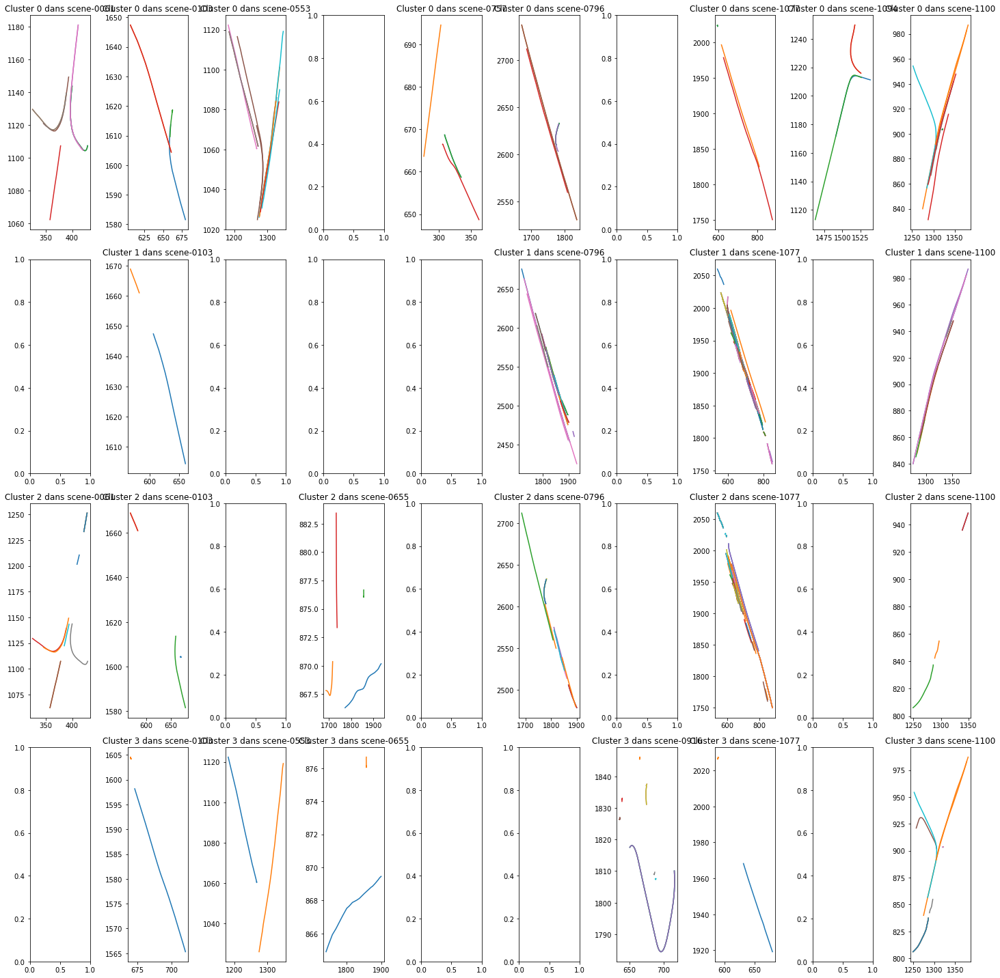

In [153]:
cluster_kmeans_total_modif(DF_finale,20)

In [154]:
def cluster_kmeans_total_modif(df,nb_clusters):
    
    # ON supprime les Nan de la df
    df = df.dropna()
    
    # On normalise les indicateurs 
    df[list(df.columns[5:])] = StandardScaler().fit_transform(df[list(df.columns[5:])])
    
    kmeans = KMeans(nb_clusters, random_state=0).fit(df[list(df.columns[5:])])
    labels = kmeans.labels_
    df['clusters']=labels
    
    # ON met les labels dans la dataframe
    df = df.sort_values(by=['scene'])
    liste_scene = list(df['scene'].unique())
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(labels)))
    
    nb_scene = len(df['scene'].unique())

    
    fig, axs = plt.subplots(len(labels_unique),3) # Ici on aura 10 scènes pour commencer 
    #fig.suptitle("Tracé des clusters obtenus avec l'algorithme DSCAN")
    plt.gcf().set_size_inches(20, 20)
    #plt.gcf().subplots_adjust(left = 0.3, bottom = 0.9,right = 0.7, top = 0.9, wspace = 0, hspace = 0.5)
    
    for s in labels_unique:
        
        # On s'occupe d'un cluster 
        df_new = df[df['clusters']==s]
        
        # On classe les lignes par scènes 
        df_new = df_new.sort_values(by=['scene'])
        # On cherche les scènes dans le cluster 
        scene_in_cluster = df_new['scene'].unique()
        
        for h in range(0,3) :
            # ON s'occupe d'une scene  
        
            # On récupère la place de cette scène dans l'ordre 
            #num_scene = liste_scene.index(scene_in_cluster[h])
            
            df_bis = df_new[df_new['scene']==liste_scene[h]]

            nb_ligne = len(df_bis)

            Texte_legend = 'Couple de trajectoires \n'

            for j in range(0,nb_ligne):
                current_ligne = df_bis.iloc[j]

                scene_name = current_ligne['scene']
                veh1 = current_ligne['Catégorie Véhicule 1'] # catégorie du véhicule 1 
                veh2 = current_ligne['Catégorie Véhicule 2']# ici on a le nom de la catégorie 
                num_veh2 = current_ligne['Numéro Véhicule 2']-1 # Numéro du véhicule 2 

                scene_token = nusc.field2token('scene','name',scene_name)[0]
                sample_token = nusc.field2token('sample','scene_token',scene_token)# Ensemble des token des échantillons de la scene 

                # Ensemble des sample_annotation de la scène :

                sample_annotation_token = []
                for k in sample_token : 
                    L = nusc.field2token('sample_annotation','sample_token',k)
                    sample_annotation_token = sample_annotation_token + L

                # On créé la liste des token des instances présents dans les sample_annotation
                L_instance_token = []
                for k in sample_annotation_token :
                    exemple = nusc.get('sample_annotation', k)
                    L_instance_token.append(exemple['instance_token'])
                # Puisque pour un même objet, on peut avoir plusieurs annotations, on supprime les doublons de L
                L_instance_token = list(set(L_instance_token))

                ## Véhicule 1 
                if veh1 == 'vehicle.ego':              
                    num_veh1_legend = ''
                    Liste_ego_poses = get_poses(scene_token) 
                    X1 =[]
                    Y1 =[]
                    Z1 =[]
                    T1 = [] # liste des timestamps
                    for k in range(0,len(Liste_ego_poses)):
                        X1.append(Liste_ego_poses[k]['translation'][0])
                        Y1.append(Liste_ego_poses[k]['translation'][1])
                        Z1.append(Liste_ego_poses[k]['translation'][2])
                        T1.append(Liste_ego_poses[k]['timestamp'])
                else :
                    num_veh1 = current_ligne['Numéro Véhicule 1']-1 #numéro du véhicule dans la liste de tous les véh de cette catégo
                    num_veh1_legend = str(num_veh1+1)

                    catego_name = veh1
                    catego_token = nusc.field2token('category','name',catego_name)
                    category = nusc.get('category',catego_token[0])

                    # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                    L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                    L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                    L=[]
                    for k in L_instance_category : 
                        instance_category = nusc.get('instance',k)
                        nbr_annotations = instance_category['nbr_annotations']
                        if nbr_annotations == 1:
                            L.append([instance_category['first_annotation_token']])
                        else : 
                            H = []
                            first_token = instance_category['first_annotation_token']
                            last_token = instance_category['last_annotation_token']
                            current_token = first_token 

                            i = 0 
                            while i!= nbr_annotations :
                                current_ann = nusc.get('sample_annotation', current_token)
                                H.append(current_ann['token'])
                                current_token = current_ann['next'] #On passe au suivant
                                i+=1
                            L.append(H)
                    # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                    # les token des sample_annotation pour un élément de cette catégorie. 

                    # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                    # on va pouvoir récupérer leurs positions 

                    X = []
                    Y = []
                    Z = []
                    T_time = []
                    for k in L :
                        x = []
                        y = []
                        z = []
                        t = []
                        for i in k :
                            sample_annotation = nusc.get('sample_annotation',i)
                            x.append(sample_annotation['translation'][0])
                            y.append(sample_annotation['translation'][1])
                            z.append(sample_annotation['translation'][2])
                            t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                        X.append(x)
                        Y.append(y)
                        Z.append(z)
                        T_time.append(t)

                    Immo, Mobile = immobile(X,Y)

                    # On conserve uniquement les objets mobiles 
                    X_mobile=[X[i] for i in Mobile]
                    Y_mobile=[Y[i] for i in Mobile]
                    Z_mobile=[Z[i] for i in Mobile]
                    T_mobile = [T_time[i] for i in Mobile]

                    X1 =X_mobile[num_veh1] 
                    Y1 =Y_mobile[num_veh1] 
                    Z1 =Z_mobile[num_veh1] 
                    T1 =T_mobile[num_veh1] 

                catego_name = veh2
                catego_token = nusc.field2token('category','name',catego_name)
                category = nusc.get('category',catego_token[0])

                # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                L=[]
                for k in L_instance_category : 
                    instance_category = nusc.get('instance',k)
                    nbr_annotations = instance_category['nbr_annotations']
                    if nbr_annotations == 1:
                        L.append([instance_category['first_annotation_token']])
                    else : 
                        H = []
                        first_token = instance_category['first_annotation_token']
                        last_token = instance_category['last_annotation_token']
                        current_token = first_token 

                        i = 0 
                        while i!= nbr_annotations :
                            current_ann = nusc.get('sample_annotation', current_token)
                            H.append(current_ann['token'])
                            current_token = current_ann['next'] #On passe au suivant
                            i+=1
                        L.append(H)
                    # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                    # les token des sample_annotation pour un élément de cette catégorie. 

                    # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                    # on va pouvoir récupérer leurs positions 

                X = []
                Y = []
                Z = []
                T_time = []
                for k in L :
                    x = []
                    y = []
                    z = []
                    t = []
                    for i in k :
                        sample_annotation = nusc.get('sample_annotation',i)
                        x.append(sample_annotation['translation'][0])
                        y.append(sample_annotation['translation'][1])
                        z.append(sample_annotation['translation'][2])
                        t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                    X.append(x)
                    Y.append(y)
                    Z.append(z)
                    T_time.append(t)

                Immo, Mobile = immobile(X,Y)

                # On conserve uniquement les objets mobiles 
                X_mobile=[X[i] for i in Mobile]
                Y_mobile=[Y[i] for i in Mobile]
                Z_mobile=[Z[i] for i in Mobile]
                T_mobile = [T_time[i] for i in Mobile]

                X2 =X_mobile[num_veh2] 
                Y2 =Y_mobile[num_veh2] 
                Z2 =Z_mobile[num_veh2] 
                T2 =T_mobile[num_veh2]

                axs[s,h].plot(X1,Y1)
                #axs[s,h].text(X1[0], Y1[0],veh1 + ' '+num_veh1_legend)#,fontsize=8)
                axs[s,h].plot(X2,Y2)
                #axs[s,h].text(X2[0], Y2[0],veh2 + ' '+str(num_veh2+1))#,fontsize=8)
                #axs[s,h].legend(loc='best')
                axs[s,h].set_title('Cluster '+str(s)+' dans '+ scene_name)
                #axs[s,h].plot([],[],'w',label = veh1 + ' '+num_veh1_legend +'/'+veh2 + ' '+str(num_veh2+1))   

    plt.tight_layout()
    plt.show()

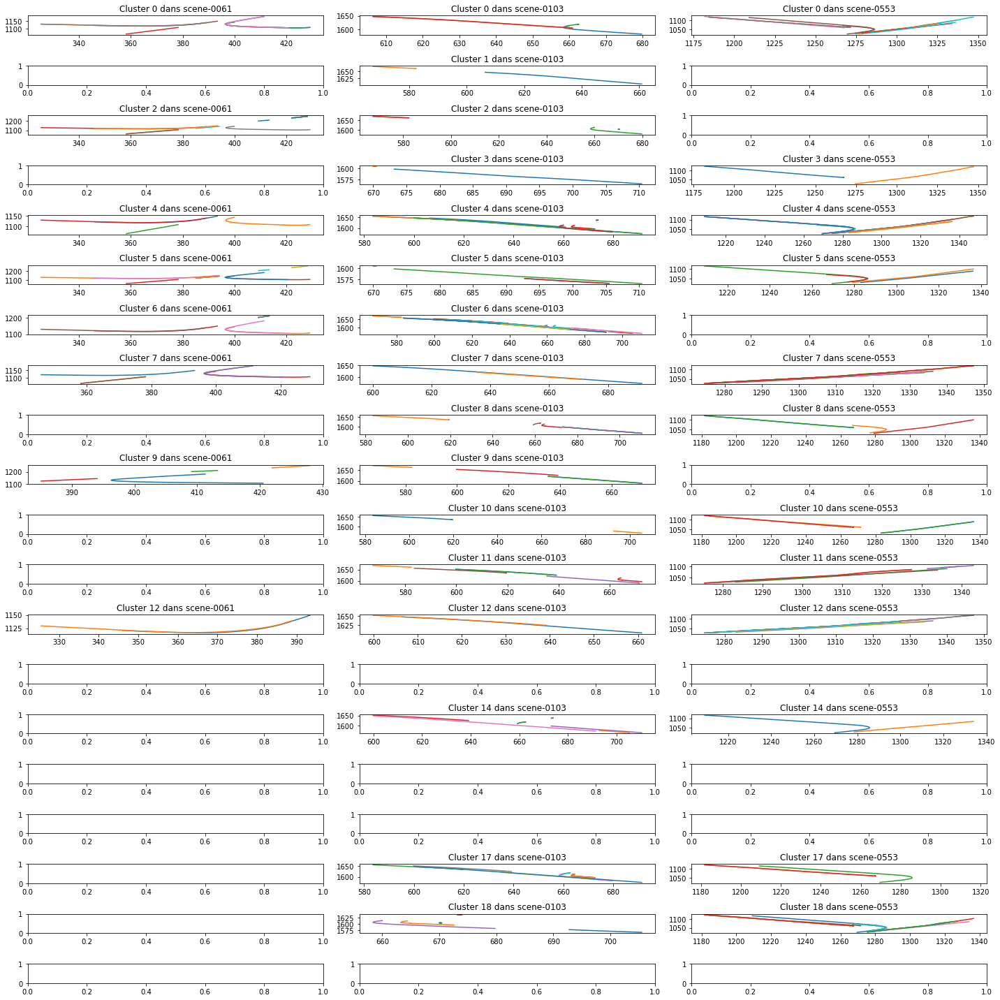

In [155]:
cluster_kmeans_total_modif(DF_finale,20)

In [156]:
#On trace le résultat du clustering par cluster 

def cluster_kmeans_total_cluster(df,nb_clusters,num_cluster):
    
    # ON supprime les Nan de la df
    df = df.dropna()
    
    # On normalise les indicateurs 
    df[list(df.columns[5:])] = StandardScaler().fit_transform(df[list(df.columns[5:])])

    kmeans = KMeans(nb_clusters, random_state=0).fit(df[list(df.columns[5:])])
    labels = kmeans.labels_
    df['clusters']=labels
    
    # On garde uniquement la scène voulue 
    df = df[df['clusters']==num_cluster]
    liste_scene = list(df['scene'].unique())
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(df['clusters'].values)))
    
    nb_scene = len(df['scene'].unique())

    
    fig, axs = plt.subplots(3) # Ici on aura 10 scènes pour commencer 
    #fig.suptitle("Tracé des clusters obtenus avec l'algorithme DSCAN")
    plt.gcf().set_size_inches(20, 20)
    #plt.gcf().subplots_adjust(left = 0.3, bottom = 0.3,right = 0.7, top = 0.9, wspace = 0, hspace = 0.5)
    
    counter = -1 
    for s in labels_unique:
        
        # On s'occupe d'un cluster 
        df_new = df[df['clusters']==s]
        
        # On classe les lignes par scènes 
        df_new = df_new.sort_values(by=['scene'])
        # On cherche les scènes dans le cluster 
        scene_in_cluster = df_new['scene'].unique()
        
        for h in range(0,len(scene_in_cluster[:3])) :
            # ON s'occupe d'une scene  
        
            # On récupère la place de cette scène dans l'ordre 
            num_scene = liste_scene.index(scene_in_cluster[h])
            
            df_bis = df_new[df_new['scene']==scene_in_cluster[h]]

        
            nb_ligne = len(df_bis)

            Texte_legend = 'Couple de trajectoires \n'

            for j in range(0,nb_ligne):
                current_ligne = df_bis.iloc[j]

                scene_name = current_ligne['scene']
                veh1 = current_ligne['Catégorie Véhicule 1'] # catégorie du véhicule 1 
                veh2 = current_ligne['Catégorie Véhicule 2']# ici on a le nom de la catégorie 
                num_veh2 = current_ligne['Numéro Véhicule 2']-1 # Numéro du véhicule 2 

                scene_token = nusc.field2token('scene','name',scene_name)[0]
                sample_token = nusc.field2token('sample','scene_token',scene_token)# Ensemble des token des échantillons de la scene 

                # Ensemble des sample_annotation de la scène :

                sample_annotation_token = []
                for k in sample_token : 
                    L = nusc.field2token('sample_annotation','sample_token',k)
                    sample_annotation_token = sample_annotation_token + L

                # On créé la liste des token des instances présents dans les sample_annotation
                L_instance_token = []
                for k in sample_annotation_token :
                    exemple = nusc.get('sample_annotation', k)
                    L_instance_token.append(exemple['instance_token'])
                # Puisque pour un même objet, on peut avoir plusieurs annotations, on supprime les doublons de L
                L_instance_token = list(set(L_instance_token))

                ## Véhicule 1 
                if veh1 == 'vehicle.ego':              
                    num_veh1_legend = ''
                    Liste_ego_poses = get_poses(scene_token) 
                    X1 =[]
                    Y1 =[]
                    Z1 =[]
                    T1 = [] # liste des timestamps
                    for k in range(0,len(Liste_ego_poses)):
                        X1.append(Liste_ego_poses[k]['translation'][0])
                        Y1.append(Liste_ego_poses[k]['translation'][1])
                        Z1.append(Liste_ego_poses[k]['translation'][2])
                        T1.append(Liste_ego_poses[k]['timestamp'])
                else :
                    num_veh1 = current_ligne['Numéro Véhicule 1']-1 #numéro du véhicule dans la liste de tous les véh de cette catégo
                    num_veh1_legend = str(num_veh1+1)

                    catego_name = veh1
                    catego_token = nusc.field2token('category','name',catego_name)
                    category = nusc.get('category',catego_token[0])

                    # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                    L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                    L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                    L=[]
                    for k in L_instance_category : 
                        instance_category = nusc.get('instance',k)
                        nbr_annotations = instance_category['nbr_annotations']
                        if nbr_annotations == 1:
                            L.append([instance_category['first_annotation_token']])
                        else : 
                            H = []
                            first_token = instance_category['first_annotation_token']
                            last_token = instance_category['last_annotation_token']
                            current_token = first_token 

                            i = 0 
                            while i!= nbr_annotations :
                                current_ann = nusc.get('sample_annotation', current_token)
                                H.append(current_ann['token'])
                                current_token = current_ann['next'] #On passe au suivant
                                i+=1
                            L.append(H)
                    # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                    # les token des sample_annotation pour un élément de cette catégorie. 

                    # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                    # on va pouvoir récupérer leurs positions 

                    X = []
                    Y = []
                    Z = []
                    T_time = []
                    for k in L :
                        x = []
                        y = []
                        z = []
                        t = []
                        for i in k :
                            sample_annotation = nusc.get('sample_annotation',i)
                            x.append(sample_annotation['translation'][0])
                            y.append(sample_annotation['translation'][1])
                            z.append(sample_annotation['translation'][2])
                            t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                        X.append(x)
                        Y.append(y)
                        Z.append(z)
                        T_time.append(t)

                    Immo, Mobile = immobile(X,Y)

                    # On conserve uniquement les objets mobiles 
                    X_mobile=[X[i] for i in Mobile]
                    Y_mobile=[Y[i] for i in Mobile]
                    Z_mobile=[Z[i] for i in Mobile]
                    T_mobile = [T_time[i] for i in Mobile]

                    X1 =X_mobile[num_veh1] 
                    Y1 =Y_mobile[num_veh1] 
                    Z1 =Z_mobile[num_veh1] 
                    T1 =T_mobile[num_veh1] 

                catego_name = veh2
                catego_token = nusc.field2token('category','name',catego_name)
                category = nusc.get('category',catego_token[0])

                # Ensemble des instances appartenant à la fois à la scène et à la catégorie
                L_instance_category = nusc.field2token('instance','category_token',catego_token[0]) # instance dans la catégorie
                L_instance_category = [x for x in L_instance_category if x in L_instance_token]# et dans la scène 

                L=[]
                for k in L_instance_category : 
                    instance_category = nusc.get('instance',k)
                    nbr_annotations = instance_category['nbr_annotations']
                    if nbr_annotations == 1:
                        L.append([instance_category['first_annotation_token']])
                    else : 
                        H = []
                        first_token = instance_category['first_annotation_token']
                        last_token = instance_category['last_annotation_token']
                        current_token = first_token 

                        i = 0 
                        while i!= nbr_annotations :
                            current_ann = nusc.get('sample_annotation', current_token)
                            H.append(current_ann['token'])
                            current_token = current_ann['next'] #On passe au suivant
                            i+=1
                        L.append(H)
                    # Il peut y avoir plusieurs éléments de la catégorie dans la scène, ici chaque ligne de L représente 
                    # les token des sample_annotation pour un élément de cette catégorie. 

                    # Maintenant qu'on a les token de tous les sample_annotation pour tous les éléments d'une même catégorie, 
                    # on va pouvoir récupérer leurs positions 

                X = []
                Y = []
                Z = []
                T_time = []
                for k in L :
                    x = []
                    y = []
                    z = []
                    t = []
                    for i in k :
                        sample_annotation = nusc.get('sample_annotation',i)
                        x.append(sample_annotation['translation'][0])
                        y.append(sample_annotation['translation'][1])
                        z.append(sample_annotation['translation'][2])
                        t.append(nusc.get('sample',sample_annotation['sample_token'])['timestamp'])
                    X.append(x)
                    Y.append(y)
                    Z.append(z)
                    T_time.append(t)

                Immo, Mobile = immobile(X,Y)

                # On conserve uniquement les objets mobiles 
                X_mobile=[X[i] for i in Mobile]
                Y_mobile=[Y[i] for i in Mobile]
                Z_mobile=[Z[i] for i in Mobile]
                T_mobile = [T_time[i] for i in Mobile]

                X2 =X_mobile[num_veh2] 
                Y2 =Y_mobile[num_veh2] 
                Z2 =Z_mobile[num_veh2] 
                T2 =T_mobile[num_veh2] 
                
               # print(counter)

                axs[h].plot(X1,Y1)
                axs[h].text(X1[0], Y1[0],veh1 + ' '+num_veh1_legend)#,fontsize=8)
                axs[h].plot(X2,Y2)
                axs[h].text(X2[0], Y2[0],veh2 + ' '+str(num_veh2+1))#,fontsize=8)
                axs[h].set_title('Cluster '+str(s)+' dans '+ scene_name)
                axs[h].plot([],[],'w',label = veh1 + ' '+num_veh1_legend +'/'+veh2 + ' '+str(num_veh2+1)) 
                axs[h].legend(loc='best')

    plt.tight_layout()
    plt.show()


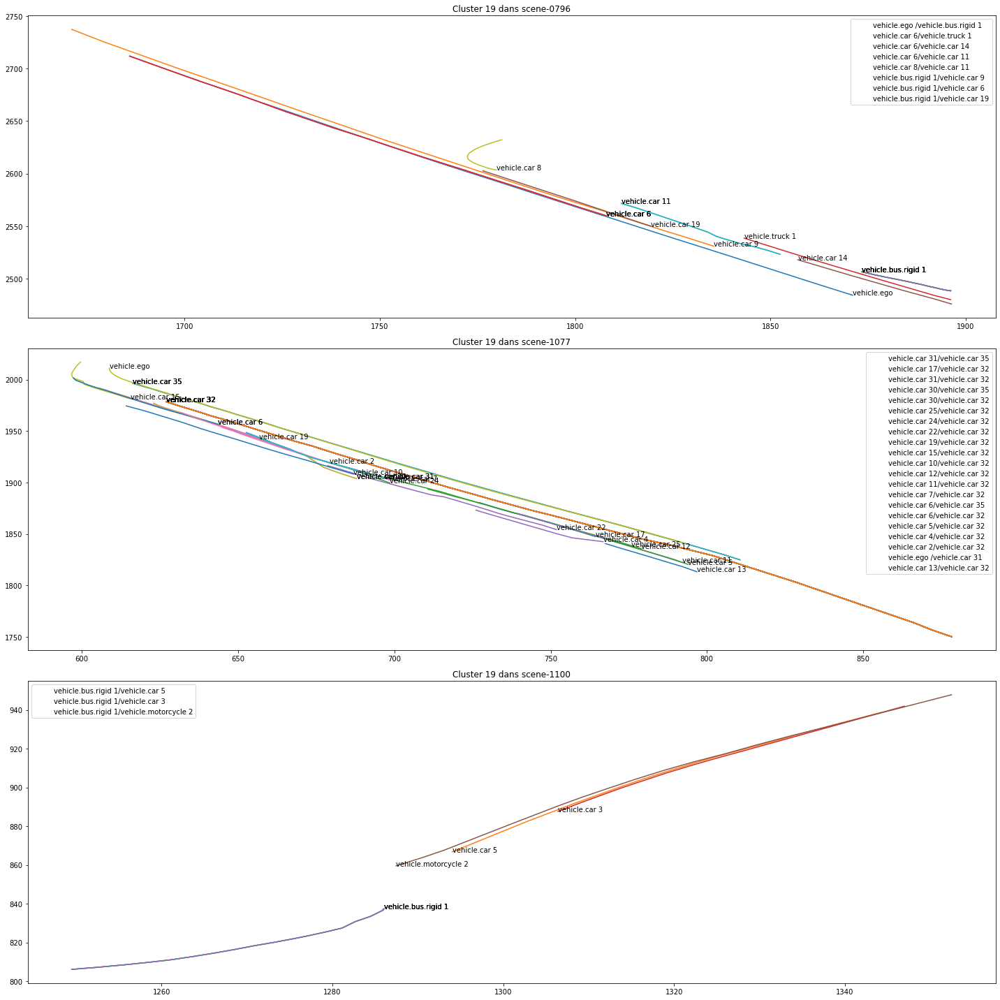

In [157]:
# Handball 
cluster_kmeans_total_cluster(DF_finale,20,19)

In [158]:
def description_cluster_kmeans(df,nb_clusters):
    
    df_cluster = pd.DataFrame()
    
    # ON supprime les Nan de la df
    df = df.dropna()
    
    # On normalise les indicateurs 
    df[list(df.columns[5:])] = StandardScaler().fit_transform(df[list(df.columns[5:])])
    
    kmeans = KMeans(nb_clusters, random_state=0).fit(df[list(df.columns[5:])])
    labels = kmeans.labels_
    df['clusters']=labels
    
    # ON met les labels dans la dataframe
    df = df.sort_values(by=['scene'])
    liste_scene = list(df['scene'].unique())
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(labels)))
    
    nb_scene = len(df['scene'].unique())

    Colonne = []
    for k in liste_scene :
        Colonne.append('Nbre élément '+k)
        Colonne.append('Éléments '+k)
        
    df_cluster['Colonne']=Colonne
    df_cluster =df_cluster.set_index('Colonne')

    for s in labels_unique:
        
        L = [] # liste qu'on va mettre dans la df 
        
        # On s'occupe d'un cluster 
        df_new = df[df['clusters']==s]
        
        # On classe les lignes par scènes 
        df_new = df_new.sort_values(by=['scene'])
        # On cherche les scènes dans le cluster 
        scene_in_cluster = df_new['scene'].unique()
        
        for h in range(0,nb_scene) :
            
            # ON s'occupe d'une scene  
            df_bis = df_new[df_new['scene']==liste_scene[h]]
            
            # On regarde combien d'éléments sont dans le cluster s et dans la scène 
            nb_ligne = len(df_bis)
            L.append(len(df_bis))
            
            if nb_ligne ==0:
                L.append(np.nan) # Il n'y a pas d'élément de cette scène dans le cluster 
            else : 
                L_element = []
                for j in range(0,nb_ligne):
                    L_element.append(df_bis.iloc[j].name)
                L.append(L_element)
                    
        df_cluster['Cluster ' +str(s)]=L
    return df_cluster.transpose()

In [159]:
description_cluster_kmeans(DF_finale,20)

Colonne,Nbre élément scene-0061,Éléments scene-0061,Nbre élément scene-0103,Éléments scene-0103,Nbre élément scene-0553,Éléments scene-0553,Nbre élément scene-0655,Éléments scene-0655,Nbre élément scene-0757,Éléments scene-0757,Nbre élément scene-0796,Éléments scene-0796,Nbre élément scene-0916,Éléments scene-0916,Nbre élément scene-1077,Éléments scene-1077,Nbre élément scene-1094,Éléments scene-1094,Nbre élément scene-1100,Éléments scene-1100
Cluster 0,4,"[vehicle.car 4 /vehicle.truck 1 scene-0061, ve...",2,"[vehicle.car 2 /vehicle.car 5 scene-0103, vehi...",10,"[vehicle.car 10/ego dans scene-0553, vehicle.c...",0,NaN,2,"[vehicle.car 1/ego dans scene-0757, vehicle.tr...",3,"[vehicle.car 3 /vehicle.car 9 scene-0796, vehi...",0,NaN,2,"[vehicle.car 21 /vehicle.car 35 scene-1077, ve...",2,"[vehicle.car 1 /vehicle.car 5 scene-1094, vehi...",7,"[vehicle.car 1/ego dans scene-1100, vehicle.ca..."
Cluster 1,0,NaN,1,[vehicle.car 5 /vehicle.car 10 scene-0103],0,NaN,0,NaN,0,NaN,14,[vehicle.bus.rigid 1 /vehicle.car 11 scene-079...,0,NaN,69,"[vehicle.car 10 /vehicle.car 49 scene-1077, ve...",0,NaN,4,"[vehicle.car 1 /vehicle.car 11 scene-1100, veh..."
Cluster 2,6,"[vehicle.car 1 /vehicle.car 5 scene-0061, vehi...",2,"[vehicle.car 7 /vehicle.car 10 scene-0103, veh...",0,NaN,2,"[vehicle.truck 1/ego dans scene-0655, vehicle....",0,NaN,6,"[vehicle.car 16 /vehicle.car 19 scene-0796, ve...",0,NaN,31,"[vehicle.car 42/ego dans scene-1077, vehicle.c...",0,NaN,2,"[vehicle.car 10 /vehicle.car 12 scene-1100, ve..."
Cluster 3,0,NaN,1,[vehicle.bicycle 1 /vehicle.car 7 scene-0103],1,[vehicle.car 7 /vehicle.truck 1 scene-0553],1,[vehicle.car 1 /vehicle.car 5 scene-0655],0,NaN,0,NaN,5,"[vehicle.car 1/ego dans scene-0916, vehicle.ca...",1,[vehicle.car 2 /vehicle.car 33 scene-1077],0,NaN,6,[vehicle.bus.rigid 1 /vehicle.car 1 scene-1100...
Cluster 4,2,"[vehicle.car 2 /vehicle.car 4 scene-0061, vehi...",7,"[vehicle.car 5 /vehicle.car 11 scene-0103, veh...",6,"[vehicle.car 8 /vehicle.truck 1 scene-0553, ve...",4,"[vehicle.car 2 /vehicle.car 4 scene-0655, vehi...",4,"[vehicle.car 5/ego dans scene-0757, vehicle.ca...",10,"[vehicle.car 5 /vehicle.car 8 scene-0796, vehi...",2,"[vehicle.car 3/ego dans scene-0916, vehicle.ca...",9,"[vehicle.car 9 /vehicle.car 15 scene-1077, veh...",1,[vehicle.car 4/ego dans scene-1094],5,"[vehicle.car 1 /vehicle.car 6 scene-1100, vehi..."
Cluster 5,6,"[vehicle.car 3 /vehicle.truck 1 scene-0061, ve...",2,"[vehicle.car 6 /vehicle.car 7 scene-0103, vehi...",2,"[vehicle.car 5 /vehicle.car 10 scene-0553, veh...",0,NaN,12,"[vehicle.truck 1 /vehicle.truck 2 scene-0757, ...",2,"[vehicle.car 9 /vehicle.car 19 scene-0796, veh...",2,"[vehicle.car 2 /vehicle.car 6 scene-0916, vehi...",47,"[vehicle.car 6 /vehicle.car 23 scene-1077, veh...",3,[vehicle.bus.rigid 1 /vehicle.motorcycle 1 sce...,2,"[vehicle.car 3 /vehicle.car 7 scene-1100, vehi..."
Cluster 6,4,"[vehicle.car 1 /vehicle.car 4 scene-0061, vehi...",11,"[vehicle.car 5/ego dans scene-0103, vehicle.ca...",0,NaN,4,"[vehicle.car 6/ego dans scene-0655, vehicle.ca...",16,"[vehicle.car 4 /vehicle.truck 1 scene-0757, ve...",13,"[vehicle.car 5 /vehicle.car 11 scene-0796, veh...",2,"[vehicle.car 6/ego dans scene-0916, vehicle.tr...",30,"[vehicle.car 3/ego dans scene-1077, vehicle.ca...",7,"[vehicle.bus.rigid 1/ego dans scene-1094, vehi...",6,[vehicle.car 12 /vehicle.motorcycle 2 scene-11...
Cluster 7,3,"[vehicle.car 2 /vehicle.car 5 scene-0061, vehi...",1,[vehicle.car 1/ego dans scene-0103],7,"[vehicle.car 2 /vehicle.truck 1 scene-0553, ve...",0,NaN,0,NaN,2,"[vehicle.car 4 /vehicle.truck 1 scene-0796, ve...",0,NaN,71,"[vehicle.car 2 /vehicle.car 19 scene-1077, veh...",4,[vehicle.bus.rigid 1 /vehicle.car 6 scene-1094...,6,"[vehicle.car 1 /vehicle.car 5 scene-1100, vehi..."
Cluster 8,0,NaN,3,"[vehicle.bicycle 1 /vehicle.car 3 scene-0103, ...",2,"[vehicle.car 7 /vehicle.car 8 scene-0553, vehi...",2,"[vehicle.car 1 /vehicle.car 4 scene-0655, vehi...",0,NaN,0,NaN,0,NaN,8,"[vehicle.car 9 /vehicle.car 21 sc

### Automatisation de la compréhension des clusters : approche automatique 

In [160]:
# Fonction qui renvoie une df avec pour chaque cluster les valeurs moyennes de chaque indicateur normalisé

def centroide_dbscan(df,epsilon,nb_voisin):
    
    df_cluster = pd.DataFrame()
    
    df = df.dropna()
    
    # On normalise les indicateurs 
    df[list(df.columns[5:])] = StandardScaler().fit_transform(df[list(df.columns[5:])])
    
    labels = cluster (df[list(df.columns[5:])],epsilon,nb_voisin)
    df['clusters']=labels
    
    # ON met les labels dans la dataframe
    df = df.sort_values(by=['clusters'])
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(labels)))
    
    Colonne_index = ['Cluster '+str(labels_unique[k]) for k in range(0,len(labels_unique))]
    df_cluster['Cluster']=Colonne_index
    df_cluster = df_cluster.set_index('Cluster') # On met la liste des noms des clusters en index
    
    # ON prépare les listes qui seront dans la df_cluster
    L_liste_traj = []
    L_nbr_element = [] 
    L_vit_veh1 = []
    L_vit_veh2 = []
    L_duree = []
    L_DTW_moy = []
    L_dist_moy = []
    L_DTW_min = []
    L_DTW_max =[]
    L_TL_horizon =[]
    L_TL_vertical = []
    L_indic_ortho_moy = []
    L_indic_ortho_min = []
    L_indic_ortho_max = []
    L_indic_coli_moy = []
    L_indic_coli_min = []
    L_indic_coli_max = []
    L_sens = []
    L_dist_mat_min = []
    L_dist_mat_max = []
    L_dist_mat_moy = []
    
    for s in labels_unique:
        
        # On s'occupe d'un cluster 
        df_bis = df[df['clusters']==s]
        nb_ligne = len(df_bis)
        
        L_cluster_s =[]
        
        for j in range(0,nb_ligne):
            current_ligne = df_bis.iloc[j]
            L_cluster_s.append(current_ligne.name) # Nom du couple de traj 
        
        L_liste_traj.append(L_cluster_s)
        L_nbr_element.append(len(L_cluster_s))
        
        L_vit_veh1.append(np.mean(df_bis['Vitesse moyenne veh 1']))
        L_vit_veh2.append(np.mean(df_bis['Vitesse moyenne veh 2']))
        L_duree.append(np.mean(df_bis["Durée d'interaction"]))
        L_DTW_moy.append(np.mean(df_bis['DTW normalisée']))
        L_dist_moy.append(np.mean(df_bis['Distance instantannée moyenne']))
        L_DTW_min.append(np.mean(df_bis["Distance instantannée minimale"]))
        L_DTW_max.append(np.mean(df_bis['Distance instantannée maximale']))
        L_TL_horizon.append(np.mean(df_bis['TimeLag moyen horizontal']))
        L_TL_vertical.append(np.mean(df_bis['TimeLag moyen vertical']))
        L_indic_ortho_moy.append(np.mean(df_bis["Indicateur d'orthogonalité moyen"]))
        L_indic_ortho_min.append(np.mean(df_bis["Indicateur d'orthogonalité min"]))
        L_indic_ortho_max.append(np.mean(df_bis["Indicateur d'orthogonalité max"]))
  
        L_indic_coli_moy.append(np.mean(df_bis['Indicateur de colinéarité moyen']))
        L_indic_coli_min.append(np.mean(df_bis['Indicateur de colinéarité min']))
        L_indic_coli_max.append(np.mean(df_bis['Indicateur de colinéarité max']))
        
        L_sens.append(np.mean(df_bis['Sens']))
        
        L_dist_mat_min.append(np.mean(df_bis['Distance minimale dans matrice distance']))
        L_dist_mat_max.append(np.mean(df_bis['Distance maximale dans matrice distance']))
        L_dist_mat_moy.append(np.mean(df_bis['Distance moyenne dans matrice distance']))
            
    df_cluster['Liste des trajectoires appartenant au cluster'] = L_liste_traj
    df_cluster['Nbre élement dans cluster']=L_nbr_element
    df_cluster['Vitesse veh 1 moyenne'] = L_vit_veh1
    df_cluster['Vitesse veh 2 moyenne'] = L_vit_veh2
    df_cluster['Durée interaction moyenne'] =  L_duree
    df_cluster['DTW moyen'] = L_DTW_moy
    df_cluster['Distance instantannée moyenne moyenne'] = L_dist_moy
    df_cluster['Distance instantannée minimale moyenne'] = L_DTW_min
    df_cluster['Distance instantannée maximale moyenne'] = L_DTW_max
    df_cluster['TimeLag horizontal moyen'] =  L_TL_horizon
    df_cluster['TimeLag vertical moyen'] =  L_TL_vertical
    df_cluster["Indicateur d'orthogonalité moyen" ] = L_indic_ortho_moy
    df_cluster["Indicateur d'orthogonalité minimal moyen" ] = L_indic_ortho_min
    df_cluster["Indicateur d'orthogonalité maximal moyen" ] = L_indic_ortho_max
    df_cluster["Indicateur de colinéarité moyen" ] = L_indic_coli_moy
    df_cluster["Indicateur de colinéarité minimal moyen" ] = L_indic_coli_min
    df_cluster["Indicateur de colinéarité maximal moyen" ] = L_indic_coli_max
    df_cluster['Sens'] = L_sens
    df_cluster["Distance minimale moyenne" ] = L_dist_mat_min
    df_cluster["Distance maximale moyenne" ] = L_dist_mat_max
    df_cluster["Distance moyenne moyenne" ] = L_dist_mat_moy
    
    return df_cluster

In [161]:
centroide_dbscan(DF_finale,1.5,2)

,Liste des trajectoires appartenant au cluster,Nbre élement dans cluster,Vitesse veh 1 moyenne,Vitesse veh 2 moyenne,Durée interaction moyenne,DTW moyen,Distance instantannée moyenne moyenne,Distance instantannée minimale moyenne,Distance instantannée maximale moyenne,TimeLag horizontal moyen,...,Indicateur d'orthogonalité moyen,Indicateur d'orthogonalité minimal moyen,Indicateur d'orthogonalité maximal moyen,Indicateur de colinéarité moyen,Indicateur de colinéarité minimal moyen,Indicateur de colinéarité maximal moyen,Sens,Distance minimale moyenne,Distance maximale moyenne,Distance moyenne moyenne
Cluster,,,,,,,,,,,,,,,,,,,,,
Cluster -1,"[vehicle.bus.rigid 1/ego dans scene-0061, vehi...",224,-0.667375,-0.583956,0.261736,0.157093,0.162525,0.060252,0.269239,0.607747,...,0.734775,0.448288,0.900265,-0.396594,-0.609841,-0.194490,-0.416028,0.124952,0.034095,0.111860
Cluster 0,"[vehicle.car 4 /vehicle.car 12 scene-0796, veh...",201,0.557281,0.460907,-0.419953,-0.336539,-0.378809,-0.742701,0.153860,-0.475238,...,-0.669767,-0.536977,-0.647631,-1.476960,-1.305938,-1.580677,-1.349242,-0.601155,-0.240761,-0.614323
Cluster 1,"[vehicle.car 2/ego dans scene-0061, vehicle.ca...",3,-0.870286,-0.821340,0.634145,-0.826262,-0.724241,-0.707895,-0.297505,1.519735,...,0.370029,-0.485931,1.639390,0.672598,0.059415,0.775178,0.741157,-0.783449,-0.204313,-0.783986
Cluster 2,"[vehicle.car 22 /vehicle.car 24 scene-1077, ve...",542,0.267127,0.195397,0.113548,0.004452,0.026522,0.215129,-0.223371,-0.068981,...,-0.567575,-0.434793,-0.611472,0.868279,0.929797,0.772567,0.741157,0.115026,0.022014,0.116223
Cluster 3,"[vehicle.car 8/ego dans scene-0553, vehicle.tr...",11,-2.039609,-0.255633,0.545179,-0.851386,-0.576992,-0.638435,-0.279493,-0.609063,...,1.786665,-0.234685,1.705967,-0.084972,-0.835160,0.766724,0.741157,-0.529364,-0.875105,-0.787498
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Cluster 62,"[vehicle.car 32 /vehicle.car 34 scene-1077, ve...",4,1.928158,0.647258,-0.894926,1.713630,1.283300,0.373051,1.972206,-0.609063,...,-0.598331,-0.426972,-0.667050,-1.476981,-1.304438,-1.594079,-1.349242,0.717933,1.550959,1.437600
Cluster 63,"[vehicle.car 33 /vehicle.car 40 scene-1077, ve...",2,-1.978441,-0.016938,1.297611,0.439020,0.483678,0.025232,0.582078,-0.609063,...,0.661233,0.933585,0.355158,-1.333833,-1.181001,-1.445043,-1.349242,0.254709,0.276821,0.432034
Cluster 64,"[vehicle.car 1 /vehicle.car 6 scene-1094, vehi...",2,-0.955443,-0.662246,0.269170,0.092915,-0.166217,-0.896451,0.644405,-0.609063,...,0.449422,-0.581901,1.104993,-1.273231,-1.306559,-1.161496,-1.349242,-0.608878,0.173489,-0.166003


In [162]:
# Fonction qui renvoie une df avec pour chaque cluster les valeurs moyennes de chaque indicateur

def centroide_dbscan_realval(df,epsilon,nb_voisin):
    
    df_cluster = pd.DataFrame()
    
    df = df.dropna()
    
    # On normalise les indicateurs 
    df_bis = df.copy()
    df_bis[list(df_bis.columns[5:])] = StandardScaler().fit_transform(df_bis[list(df_bis.columns[5:])])
    
    labels = cluster (df_bis[list(df_bis.columns[5:])],epsilon,nb_voisin)
    df['clusters']=labels
    
    # ON met les labels dans la dataframe
    df = df.sort_values(by=['clusters'])
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(labels)))
    
    Colonne_index = ['Cluster '+str(labels_unique[k]) for k in range(0,len(labels_unique))]
    df_cluster['Cluster']=Colonne_index
    df_cluster = df_cluster.set_index('Cluster') # On met la liste des noms des clusters en index
    
    # ON prépare les listes qui seront dans la df_cluster
    L_liste_traj = []
    L_nbr_element = [] 
    L_vit_veh1 = []
    L_vit_veh2 = []
    L_duree = []
    L_DTW_moy = []
    L_dist_moy = []
    L_DTW_min = []
    L_DTW_max =[]
    L_TL_horizon =[]
    L_TL_vertical = []
    L_indic_ortho_moy = []
    L_indic_ortho_min = []
    L_indic_ortho_max = []
    L_indic_coli_moy = []
    L_indic_coli_min = []
    L_indic_coli_max = []
    L_sens = []
    L_dist_mat_min = []
    L_dist_mat_max = []
    L_dist_mat_moy = []
    
    for s in labels_unique:
        
        # On s'occupe d'un cluster 
        df_bis = df[df['clusters']==s]
        nb_ligne = len(df_bis)
        
        L_cluster_s =[]
        
        for j in range(0,nb_ligne):
            current_ligne = df_bis.iloc[j]
            L_cluster_s.append(current_ligne.name) # Nom du couple de traj 
        
        L_liste_traj.append(L_cluster_s)
        L_nbr_element.append(len(L_cluster_s))
        
        L_vit_veh1.append(np.mean(df_bis['Vitesse moyenne veh 1']))
        L_vit_veh2.append(np.mean(df_bis['Vitesse moyenne veh 2']))
        L_duree.append(np.mean(df_bis["Durée d'interaction"]))
        L_DTW_moy.append(np.mean(df_bis['DTW normalisée']))
        L_dist_moy.append(np.mean(df_bis['Distance instantannée moyenne']))
        L_DTW_min.append(np.mean(df_bis["Distance instantannée minimale"]))
        L_DTW_max.append(np.mean(df_bis['Distance instantannée maximale']))
        L_TL_horizon.append(np.mean(df_bis['TimeLag moyen horizontal']))
        L_TL_vertical.append(np.mean(df_bis['TimeLag moyen vertical']))
        L_indic_ortho_moy.append(np.mean(df_bis["Indicateur d'orthogonalité moyen"]))
        L_indic_ortho_min.append(np.mean(df_bis["Indicateur d'orthogonalité min"]))
        L_indic_ortho_max.append(np.mean(df_bis["Indicateur d'orthogonalité max"]))
  
        L_indic_coli_moy.append(np.mean(df_bis['Indicateur de colinéarité moyen']))
        L_indic_coli_min.append(np.mean(df_bis['Indicateur de colinéarité min']))
        L_indic_coli_max.append(np.mean(df_bis['Indicateur de colinéarité max']))
        
        L_sens.append(np.mean(df_bis['Sens']))
        
        L_dist_mat_min.append(np.mean(df_bis['Distance minimale dans matrice distance']))
        L_dist_mat_max.append(np.mean(df_bis['Distance maximale dans matrice distance']))
        L_dist_mat_moy.append(np.mean(df_bis['Distance moyenne dans matrice distance']))
            
    df_cluster['Liste des trajectoires appartenant au cluster'] = L_liste_traj
    df_cluster['Nbre élement dans cluster']=L_nbr_element
    df_cluster['Vitesse veh 1 moyenne'] = L_vit_veh1
    df_cluster['Vitesse veh 2 moyenne'] = L_vit_veh2
    df_cluster['Durée interaction moyenne'] =  L_duree
    df_cluster['DTW moyen'] = L_DTW_moy
    df_cluster['Distance instantannée moyenne moyenne'] = L_dist_moy
    df_cluster['Distance instantannée minimale moyenne'] = L_DTW_min
    df_cluster['Distance instantannée maximale moyenne'] = L_DTW_max
    df_cluster['TimeLag horizontal moyen'] =  L_TL_horizon
    df_cluster['TimeLag vertical moyen'] =  L_TL_vertical
    df_cluster["Indicateur d'orthogonalité moyen" ] = L_indic_ortho_moy
    df_cluster["Indicateur d'orthogonalité minimal moyen" ] = L_indic_ortho_min
    df_cluster["Indicateur d'orthogonalité maximal moyen" ] = L_indic_ortho_max
    df_cluster["Indicateur de colinéarité moyen" ] = L_indic_coli_moy
    df_cluster["Indicateur de colinéarité minimal moyen" ] = L_indic_coli_min
    df_cluster["Indicateur de colinéarité maximal moyen" ] = L_indic_coli_max
    df_cluster['Sens'] = L_sens
    df_cluster["Distance minimale moyenne" ] = L_dist_mat_min
    df_cluster["Distance maximale moyenne" ] = L_dist_mat_max
    df_cluster["Distance moyenne moyenne" ] = L_dist_mat_moy
    
    return df_cluster

In [163]:
centroide_dbscan_realval(DF_finale,1.5,2)

,Liste des trajectoires appartenant au cluster,Nbre élement dans cluster,Vitesse veh 1 moyenne,Vitesse veh 2 moyenne,Durée interaction moyenne,DTW moyen,Distance instantannée moyenne moyenne,Distance instantannée minimale moyenne,Distance instantannée maximale moyenne,TimeLag horizontal moyen,...,Indicateur d'orthogonalité moyen,Indicateur d'orthogonalité minimal moyen,Indicateur d'orthogonalité maximal moyen,Indicateur de colinéarité moyen,Indicateur de colinéarité minimal moyen,Indicateur de colinéarité maximal moyen,Sens,Distance minimale moyenne,Distance maximale moyenne,Distance moyenne moyenne
Cluster,,,,,,,,,,,,,,,,,,,,,
Cluster -1,"[vehicle.bus.rigid 1/ego dans scene-0061, vehi...",224,6.347002,7.000171,0.473711,57.014634,54.372262,38.371125,73.635605,3.029004,...,0.507079,0.312650,0.699543,-0.080590,-0.382469,0.183692,0.446429,46.498985,106.215783,72.399201
Cluster 0,"[vehicle.car 4 /vehicle.car 12 scene-0796, veh...",201,11.995101,11.352167,0.304564,38.092361,37.492475,12.824691,69.435247,0.333131,...,0.051146,0.016761,0.126063,-0.996531,-0.999445,-0.981221,0.000000,13.526416,91.794853,41.034774
Cluster 1,"[vehicle.car 2/ego dans scene-0061, vehicle.ca...",3,5.411179,6.011436,0.566117,19.319936,26.721269,13.932066,53.003309,5.299213,...,0.388678,0.032091,0.973382,0.825878,0.210717,0.998574,1.000000,5.248441,93.707218,33.706855
Cluster 2,"[vehicle.car 22 /vehicle.car 24 scene-1077, ve...",542,10.656918,10.246280,0.436941,51.163509,50.131455,43.298624,55.702153,1.344425,...,0.084319,0.047449,0.139459,0.991779,0.982167,0.996380,1.000000,46.048261,105.581933,72.587636
Cluster 3,"[vehicle.car 8/ego dans scene-0553, vehicle.tr...",11,0.018279,8.367682,0.544042,18.356873,31.312769,16.141973,53.659006,0.000000,...,0.848537,0.107544,0.998048,0.183605,-0.582177,0.991470,1.000000,16.786446,58.512637,33.555200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Cluster 62,"[vehicle.car 32 /vehicle.car 34 scene-1077, ve...",4,18.317571,12.128343,0.186708,116.680987,89.320121,48.323026,135.632114,0.000000,...,0.074335,0.049797,0.118868,-0.996549,-0.998114,-0.992484,0.000000,73.426285,185.801295,129.659047
Cluster 63,"[vehicle.car 33 /vehicle.car 40 scene-1077, ve...",2,0.300381,9.361875,0.730743,67.821670,64.386424,37.256933,85.024492,0.000000,...,0.483207,0.458392,0.497586,-0.875188,-0.888708,-0.867238,0.000000,52.391236,118.950904,86.227786
Cluster 64,"[vehicle.car 1 /vehicle.car 6 scene-1094, vehi...",2,5.018437,6.674082,0.475556,54.554516,44.121493,7.933055,87.293535,0.000000,...,0.414450,0.003270,0.775393,-0.823808,-0.999995,-0.628953,0.000000,13.175730,113.529387,60.398092


In [164]:
# Fonction qui renvoie une df avec pour chaque cluster les valeurs moyennes de chaque indicateur normalisé

def centroide_kmeans(df,nb_clusters):
    
    df_cluster = pd.DataFrame()
    
    df = df.dropna()
    
    # On normalise les indicateurs 
    df[list(df.columns[5:])] = StandardScaler().fit_transform(df[list(df.columns[5:])])
    
    kmeans = KMeans(nb_clusters, random_state=0).fit(df[list(df.columns[5:])])
    labels = kmeans.labels_
    df['clusters']=labels
    
    # ON met les labels dans la dataframe
    df = df.sort_values(by=['clusters'])
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(labels)))
    
    Colonne_index = ['Cluster '+str(labels_unique[k]) for k in range(0,len(labels_unique))]
    df_cluster['Cluster']=Colonne_index
    df_cluster = df_cluster.set_index('Cluster') # On met la liste des noms des clusters en index
    
    # ON prépare les listes qui seront dans la df_cluster
    L_liste_traj = []
    L_nbr_element = []
    L_vit_veh1 = []
    L_vit_veh2 = []
    L_duree = []
    L_DTW_moy = []
    L_dist_moy = []
    L_DTW_min = []
    L_DTW_max =[]
    L_TL_horizon =[]
    L_TL_vertical = []
    L_indic_ortho_moy = []
    L_indic_ortho_min = []
    L_indic_ortho_max = []
    L_indic_coli_moy = []
    L_indic_coli_min = []
    L_indic_coli_max = []
    L_sens = []
    L_dist_mat_min = []
    L_dist_mat_max = []
    L_dist_mat_moy = []
    
    for s in labels_unique:
        
        # On s'occupe d'un cluster 
        df_bis = df[df['clusters']==s]
        nb_ligne = len(df_bis)
        
        L_cluster_s =[]
        
        for j in range(0,nb_ligne):
            current_ligne = df_bis.iloc[j]
            L_cluster_s.append(current_ligne.name) # Nom du couple de traj 
        
        L_liste_traj.append(L_cluster_s)
        L_nbr_element.append(len(L_cluster_s))
        
        L_vit_veh1.append(np.mean(df_bis['Vitesse moyenne veh 1']))
        L_vit_veh2.append(np.mean(df_bis['Vitesse moyenne veh 2']))
        L_duree.append(np.mean(df_bis["Durée d'interaction"]))
        L_DTW_moy.append(np.mean(df_bis['DTW normalisée']))
        L_dist_moy.append(np.mean(df_bis['Distance instantannée moyenne']))
        L_DTW_min.append(np.mean(df_bis["Distance instantannée minimale"]))
        L_DTW_max.append(np.mean(df_bis['Distance instantannée maximale']))
        L_TL_horizon.append(np.mean(df_bis['TimeLag moyen horizontal']))
        L_TL_vertical.append(np.mean(df_bis['TimeLag moyen vertical']))
        L_indic_ortho_moy.append(np.mean(df_bis["Indicateur d'orthogonalité moyen"]))
        L_indic_ortho_min.append(np.mean(df_bis["Indicateur d'orthogonalité min"]))
        L_indic_ortho_max.append(np.mean(df_bis["Indicateur d'orthogonalité max"]))
  
        L_indic_coli_moy.append(np.mean(df_bis['Indicateur de colinéarité moyen']))
        L_indic_coli_min.append(np.mean(df_bis['Indicateur de colinéarité min']))
        L_indic_coli_max.append(np.mean(df_bis['Indicateur de colinéarité max']))
        
        L_sens.append(np.mean(df_bis['Sens']))
        
        L_dist_mat_min.append(np.mean(df_bis['Distance minimale dans matrice distance']))
        L_dist_mat_max.append(np.mean(df_bis['Distance maximale dans matrice distance']))
        L_dist_mat_moy.append(np.mean(df_bis['Distance moyenne dans matrice distance']))
            
    df_cluster['Liste des trajectoires appartenant au cluster'] = L_liste_traj
    df_cluster['Nbre élement dans cluster']=L_nbr_element
    df_cluster['Vitesse veh 1 moyenne'] = L_vit_veh1
    df_cluster['Vitesse veh 2 moyenne'] = L_vit_veh2
    df_cluster['Durée interaction moyenne'] =  L_duree
    df_cluster['DTW moyen'] = L_DTW_moy
    df_cluster['Distance instantannée moyenne moyenne'] = L_dist_moy
    df_cluster['Distance instantannée minimale moyenne'] = L_DTW_min
    df_cluster['Distance instantannée maximale moyenne'] = L_DTW_max
    df_cluster['TimeLag horizontal moyen'] =  L_TL_horizon
    df_cluster['TimeLag vertical moyen'] =  L_TL_vertical
    df_cluster["Indicateur d'orthogonalité moyen" ] = L_indic_ortho_moy
    df_cluster["Indicateur d'orthogonalité minimal moyen" ] = L_indic_ortho_min
    df_cluster["Indicateur d'orthogonalité maximal moyen" ] = L_indic_ortho_max
    df_cluster["Indicateur de colinéarité moyen" ] = L_indic_coli_moy
    df_cluster["Indicateur de colinéarité minimal moyen" ] = L_indic_coli_min
    df_cluster["Indicateur de colinéarité maximal moyen" ] = L_indic_coli_max
    df_cluster['Sens'] = L_sens
    df_cluster["Distance minimale moyenne" ] = L_dist_mat_min
    df_cluster["Distance maximale moyenne" ] = L_dist_mat_max
    df_cluster["Distance moyenne moyenne" ] = L_dist_mat_moy
    
    return df_cluster

In [165]:
centroide_kmeans(DF_finale,20)

,Liste des trajectoires appartenant au cluster,Nbre élement dans cluster,Vitesse veh 1 moyenne,Vitesse veh 2 moyenne,Durée interaction moyenne,DTW moyen,Distance instantannée moyenne moyenne,Distance instantannée minimale moyenne,Distance instantannée maximale moyenne,TimeLag horizontal moyen,...,Indicateur d'orthogonalité moyen,Indicateur d'orthogonalité minimal moyen,Indicateur d'orthogonalité maximal moyen,Indicateur de colinéarité moyen,Indicateur de colinéarité minimal moyen,Indicateur de colinéarité maximal moyen,Sens,Distance minimale moyenne,Distance maximale moyenne,Distance moyenne moyenne
Cluster,,,,,,,,,,,,,,,,,,,,,
Cluster 0,"[vehicle.car 5/ego dans scene-1094, vehicle.ca...",32,-1.717620,-0.235071,0.641815,-0.719337,-0.480748,-0.632226,-0.063029,0.198669,...,1.278700,-0.272464,1.615195,0.070546,-0.767805,0.691300,0.479857,-0.546649,-0.448034,-0.597271
Cluster 1,"[vehicle.car 4 /vehicle.car 29 scene-1077, veh...",88,0.429509,0.184255,-0.363341,0.947801,0.945503,1.052729,0.587207,0.013577,...,-0.487195,-0.344554,-0.577644,0.864185,0.928983,0.768903,0.741157,0.914658,0.634387,0.983441
Cluster 2,[vehicle.bus.rigid 1 /vehicle.car 2 scene-0061...,49,-0.370279,-0.097544,-0.562725,1.511665,1.370655,1.285763,1.183172,-0.424599,...,0.099319,0.168645,-0.022626,-1.378392,-1.244804,-1.464001,-1.349242,1.394891,0.811856,1.335780
Cluster 3,[vehicle.bus.rigid 1 /vehicle.car 7 scene-1100...,15,-1.305364,-1.580987,1.575460,0.059017,0.125930,-0.263088,0.572679,4.850316,...,0.753806,-0.037036,1.227280,-0.544595,-0.981106,-0.069016,-0.513083,-0.208021,0.016497,-0.046953
Cluster 4,"[vehicle.car 2 /vehicle.car 4 scene-0655, vehi...",50,-0.681819,-1.056808,0.517083,-0.710540,-0.764957,-0.714887,-0.568120,-0.039774,...,0.625155,-0.309867,1.391574,0.493467,-0.094014,0.761238,0.741157,-0.643698,-0.662111,-0.754862
Cluster 5,"[vehicle.car 23 /vehicle.car 40 scene-1077, ve...",78,-0.006533,0.172646,-0.419055,-0.870603,-0.956306,-0.645265,-1.125634,-0.340741,...,-0.546093,-0.399133,-0.614344,0.865998,0.928100,0.770473,0.741157,-0.621029,-0.982443,-0.876012
Cluster 6,"[vehicle.car 12 /vehicle.car 14 scene-0796, ve...",93,0.204169,0.056515,-0.675611,-0.661864,-0.744763,-0.692608,-0.633771,-0.445315,...,-0.594038,-0.464840,-0.585924,-1.471936,-1.303447,-1.569964,-1.349242,-0.557264,-0.948533,-0.901417
Cluster 7,"[vehicle.car 25 /vehicle.car 34 scene-1077, ve...",94,0.042210,0.073413,0.801985,-0.577821,-0.379077,-0.238009,-0.536719,1.215229,...,-0.613271,-0.509295,-0.594179,0.871109,0.930721,0.775165,0.741157,-0.647018,0.025261,-0.315004
Cluster 8,"[vehicle.car 9 /vehicle.car 21 scene-1077, veh...",21,-0.155254,-1.565576,0.770665,-0.107083,-0.128351,-0.344357,-0.006890,2.190355,...,1.793437,1.941861,1.500476,0.075319,-0.017069,0.113318,0.542071,-0.232562,-0.142699,-0.124040


In [166]:
# Fonction qui renvoie une df avec pour chaque cluster les valeurs moyennes de chaque indicateur normalisé

def centroide_kmeans_realval(df,nb_clusters):
    
    df_cluster = pd.DataFrame()
    
    df = df.dropna()
    
    df_bis = df.copy()
    
    # On normalise les indicateurs 
    df_bis[list(df_bis.columns[5:])] = StandardScaler().fit_transform(df_bis[list(df_bis.columns[5:])])
    
    kmeans = KMeans(nb_clusters, random_state=0).fit(df_bis[list(df_bis.columns[5:])])
    labels = kmeans.labels_
    df['clusters']=labels
    
    # ON met les labels dans la dataframe
    df = df.sort_values(by=['clusters'])
    
    # Liste des labels uniques et dans l'ordre
    labels_unique = sorted(list(set(labels)))
    
    Colonne_index = ['Cluster '+str(labels_unique[k]) for k in range(0,len(labels_unique))]
    df_cluster['Cluster']=Colonne_index
    df_cluster = df_cluster.set_index('Cluster') # On met la liste des noms des clusters en index
    
    # ON prépare les listes qui seront dans la df_cluster
    L_liste_traj = []
    L_nbr_element = []
    L_vit_veh1 = []
    L_vit_veh2 = []
    L_duree = []
    L_DTW_moy = []
    L_dist_moy = []
    L_DTW_min = []
    L_DTW_max =[]
    L_TL_horizon =[]
    L_TL_vertical = []
    L_indic_ortho_moy = []
    L_indic_ortho_min = []
    L_indic_ortho_max = []
    L_indic_coli_moy = []
    L_indic_coli_min = []
    L_indic_coli_max = []
    L_sens = []
    L_dist_mat_min = []
    L_dist_mat_max = []
    L_dist_mat_moy = []
    
    for s in labels_unique:
        
        # On s'occupe d'un cluster 
        df_bis = df[df['clusters']==s]
        nb_ligne = len(df_bis)
        
        L_cluster_s =[]
        
        for j in range(0,nb_ligne):
            current_ligne = df_bis.iloc[j]
            L_cluster_s.append(current_ligne.name) # Nom du couple de traj 
        
        L_liste_traj.append(L_cluster_s)
        L_nbr_element.append(len(L_cluster_s))
        
        L_vit_veh1.append(np.mean(df_bis['Vitesse moyenne veh 1']))
        L_vit_veh2.append(np.mean(df_bis['Vitesse moyenne veh 2']))
        L_duree.append(np.mean(df_bis["Durée d'interaction"]))
        L_DTW_moy.append(np.mean(df_bis['DTW normalisée']))
        L_dist_moy.append(np.mean(df_bis['Distance instantannée moyenne']))
        L_DTW_min.append(np.mean(df_bis["Distance instantannée minimale"]))
        L_DTW_max.append(np.mean(df_bis['Distance instantannée maximale']))
        L_TL_horizon.append(np.mean(df_bis['TimeLag moyen horizontal']))
        L_TL_vertical.append(np.mean(df_bis['TimeLag moyen vertical']))
        L_indic_ortho_moy.append(np.mean(df_bis["Indicateur d'orthogonalité moyen"]))
        L_indic_ortho_min.append(np.mean(df_bis["Indicateur d'orthogonalité min"]))
        L_indic_ortho_max.append(np.mean(df_bis["Indicateur d'orthogonalité max"]))
  
        L_indic_coli_moy.append(np.mean(df_bis['Indicateur de colinéarité moyen']))
        L_indic_coli_min.append(np.mean(df_bis['Indicateur de colinéarité min']))
        L_indic_coli_max.append(np.mean(df_bis['Indicateur de colinéarité max']))
        
        L_sens.append(np.mean(df_bis['Sens']))
        
        L_dist_mat_min.append(np.mean(df_bis['Distance minimale dans matrice distance']))
        L_dist_mat_max.append(np.mean(df_bis['Distance maximale dans matrice distance']))
        L_dist_mat_moy.append(np.mean(df_bis['Distance moyenne dans matrice distance']))
            
    df_cluster['Liste des trajectoires appartenant au cluster'] = L_liste_traj
    df_cluster['Nbre élement dans cluster']=L_nbr_element
    df_cluster['Vitesse veh 1 moyenne'] = L_vit_veh1
    df_cluster['Vitesse veh 2 moyenne'] = L_vit_veh2
    df_cluster['Durée interaction moyenne'] =  L_duree
    df_cluster['DTW moyen'] = L_DTW_moy
    df_cluster['Distance instantannée moyenne moyenne'] = L_dist_moy
    df_cluster['Distance instantannée minimale moyenne'] = L_DTW_min
    df_cluster['Distance instantannée maximale moyenne'] = L_DTW_max
    df_cluster['TimeLag horizontal moyen'] =  L_TL_horizon
    df_cluster['TimeLag vertical moyen'] =  L_TL_vertical
    df_cluster["Indicateur d'orthogonalité moyen" ] = L_indic_ortho_moy
    df_cluster["Indicateur d'orthogonalité minimal moyen" ] = L_indic_ortho_min
    df_cluster["Indicateur d'orthogonalité maximal moyen" ] = L_indic_ortho_max
    df_cluster["Indicateur de colinéarité moyen" ] = L_indic_coli_moy
    df_cluster["Indicateur de colinéarité minimal moyen" ] = L_indic_coli_min
    df_cluster["Indicateur de colinéarité maximal moyen" ] = L_indic_coli_max
    df_cluster['Sens'] = L_sens
    df_cluster["Distance minimale moyenne" ] = L_dist_mat_min
    df_cluster["Distance maximale moyenne" ] = L_dist_mat_max
    df_cluster["Distance moyenne moyenne" ] = L_dist_mat_moy
    
    return df_cluster

In [167]:
centroide_kmeans_realval(DF_finale,20)

,Liste des trajectoires appartenant au cluster,Nbre élement dans cluster,Vitesse veh 1 moyenne,Vitesse veh 2 moyenne,Durée interaction moyenne,DTW moyen,Distance instantannée moyenne moyenne,Distance instantannée minimale moyenne,Distance instantannée maximale moyenne,TimeLag horizontal moyen,...,Indicateur d'orthogonalité moyen,Indicateur d'orthogonalité minimal moyen,Indicateur d'orthogonalité maximal moyen,Indicateur de colinéarité moyen,Indicateur de colinéarité minimal moyen,Indicateur de colinéarité maximal moyen,Sens,Distance minimale moyenne,Distance maximale moyenne,Distance moyenne moyenne
Cluster,,,,,,,,,,,,,,,,,,,,,
Cluster 0,"[vehicle.car 5/ego dans scene-1094, vehicle.ca...",32,1.503287,8.453324,0.568020,23.418684,34.313815,16.339529,61.539410,2.010687,...,0.683645,0.096198,0.964418,0.315454,-0.522478,0.928085,0.875000,16.001541,80.919875,41.771254
Cluster 1,"[vehicle.car 4 /vehicle.car 29 scene-1077, veh...",88,11.405818,10.199872,0.318611,87.324641,78.786965,69.947373,85.211243,1.549938,...,0.110411,0.074549,0.151993,0.988308,0.981445,0.993300,1.000000,82.359569,137.711366,110.043530
Cluster 2,[vehicle.bus.rigid 1 /vehicle.car 2 scene-0061...,49,7.717206,9.026143,0.269138,108.939099,92.044021,77.361487,106.907349,0.459188,...,0.300802,0.228670,0.357621,-0.912965,-0.945259,-0.883169,0.000000,104.166987,147.022670,125.261355
Cluster 3,[vehicle.bus.rigid 1 /vehicle.car 7 scene-1100...,15,3.404604,2.847407,0.799686,53.255137,53.231172,28.083873,84.682328,13.590023,...,0.513257,0.166901,0.820699,-0.206066,-0.711535,0.289137,0.400000,31.378661,105.292450,65.539928
Cluster 4,"[vehicle.car 2 /vehicle.car 4 scene-0655, vehi...",50,6.280387,5.030681,0.537071,23.755877,25.451647,13.709599,43.151568,1.417130,...,0.471495,0.084966,0.881569,0.674010,0.074727,0.986859,1.000000,11.594566,69.687857,34.964752
Cluster 5,"[vehicle.car 23 /vehicle.car 40 scene-1077, ve...",78,9.394799,10.151519,0.304786,17.620231,19.485053,15.924669,22.855261,0.667934,...,0.091292,0.058158,0.138395,0.989845,0.980663,0.994620,1.000000,12.623970,52.880939,29.732182
Cluster 6,"[vehicle.car 12 /vehicle.car 14 scene-0796, ve...",93,10.366554,9.667820,0.241127,25.621767,26.081345,14.418435,40.761533,0.407617,...,0.075728,0.038425,0.148925,-0.992272,-0.997237,-0.972218,0.000000,15.519538,54.660087,28.634919
Cluster 7,"[vehicle.car 25 /vehicle.car 34 scene-1077, ve...",94,9.619601,9.738202,0.607763,28.843378,37.484122,28.881762,44.294721,4.541207,...,0.069485,0.025075,0.145866,0.994178,0.982985,0.998563,1.000000,11.443774,105.752260,53.962589
Cluster 8,"[vehicle.car 9 /vehicle.car 21 scene-1077, veh...",21,8.708898,2.911593,0.599992,46.888060,45.302199,25.498239,63.583122,6.968587,...,0.850736,0.761191,0.921916,0.319501,0.142926,0.442366,0.904762,30.264261,96.939882,62.210507


### Distance inter-cluster 

In [168]:
def dist_inter_cluster_dbscan(df,eps,nb_voisin):
    # Liste des centroïdes des clusters et de leurs caractéristiques 
    liste_cluster = liste_cluster_dbscan(df,eps,nb_voisin)
    nb_cluster = len(liste_cluster)
    
    #df en forme de matrice des distances 
    df = pd.DataFrame()
    df['Distance']=list(liste_cluster.index)
    
    for k in range(len(list(liste_cluster.index))):
        L = []
        for j in range(len(list(liste_cluster.index))):
            dist = [(liste_cluster[column].iloc[k]-liste_cluster[column].iloc[j])**2 for column in liste_cluster.columns[1:]]
            L.append(sqrt(sum(dist)))
        df[list(liste_cluster.index)[k]]=L
    df = df.set_index('Distance')
    return df

In [169]:
dist_inter_cluster_dbscan(DF_finale,1.5,2)

,Cluster -1,Cluster 0,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5,Cluster 6,Cluster 7,Cluster 8,...,Cluster 57,Cluster 58,Cluster 59,Cluster 60,Cluster 61,Cluster 62,Cluster 63,Cluster 64,Cluster 65,Cluster 66
Distance,,,,,,,,,,,,,,,,,,,,,
Cluster -1,0.000000,92.330614,167.948515,13.123661,158.756362,125.662760,174.291674,170.205070,188.104122,169.697513,...,113.048437,159.267407,246.413103,141.578414,146.046764,137.249717,131.736067,141.578133,139.621531,136.178529
Cluster 0,92.330614,0.000000,75.915888,79.785326,66.633590,34.742101,82.292617,78.470223,96.407452,77.751068,...,99.498036,69.612748,280.738789,139.348759,60.629677,133.751459,70.944067,66.111867,51.315980,59.987793
Cluster 1,167.948515,75.915888,0.000000,155.313192,13.687742,43.738068,6.413364,6.068525,26.344811,2.570285,...,139.279800,21.768644,322.745978,174.320750,39.597681,169.271880,83.670204,60.898619,35.949543,60.022789
Cluster 2,13.123661,79.785326,155.313192,0.000000,146.027086,113.366236,161.643087,157.662041,175.257386,157.085520,...,108.691323,147.069781,251.588462,139.808547,134.312063,135.187227,122.280694,130.805249,127.568552,125.301026
Cluster 3,158.756362,66.633590,13.687742,146.027086,0.000000,37.502507,18.799045,19.210918,30.223433,16.211548,...,139.110337,29.022744,323.804013,175.672779,43.051195,170.450571,85.983173,64.509881,35.855242,62.303324
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Cluster 62,137.249717,133.751459,169.271880,135.187227,170.450571,137.511056,173.610942,166.844288,195.517722,169.139272,...,34.275151,148.394452,153.503111,5.937574,129.733816,0.000000,85.774690,109.013453,134.723783,109.279344
Cluster 63,131.736067,70.944067,83.670204,122.280694,85.983173,57.935425,87.869418,81.086291,109.825481,83.447522,...,57.999834,62.627513,239.157034,90.764690,44.097105,85.774690,0.000000,23.331364,50.316226,23.818037
Cluster 64,141.578133,66.111867,60.898619,130.805249,64.509881,42.796896,64.807984,57.998688,86.847791,60.517363,...,81.029294,39.525207,262.279832,113.940955,21.645720,109.013453,23.331364,0.000000,30.082171,6.573810


### Variance intra-cluster 

In [170]:
def variance_intra_cluster_dbscan(df,epsilon,nb_voisin):
    
    df_sortante = pd.DataFrame()
    
    # ON supprime les Nan de la df
    df = df.dropna()
    
    # On normalise les indicateurs 
    df[list(df.columns[5:])] = StandardScaler().fit_transform(df[list(df.columns[5:])])
    
    labels = cluster (df[list(df.columns[5:])],epsilon,nb_voisin)
    df['clusters']=labels
    
    df_centroide = centroide_dbscan(df,epsilon,nb_voisin)
    df_centroide = df_centroide[list(df_centroide.columns[2:])]
    
    labels_unique = list(set(labels)) # Liste des labels dans l'ordre
    
    ## On prépare la df 
    df_sortante['Cluster'] = labels_unique
    df_sortante = df_sortante.set_index('Cluster')
    
    Moyenne = []
    Variance = []
    
    for k in range(0,len(labels_unique)):
        
        num_cluster = labels_unique[k]
        df_bis = df[df['clusters']==num_cluster]
        df_bis = df_bis[list(df_bis.columns[5:len(df_bis.columns)-1])]
        
        centroide_cluster = df_centroide[df_centroide.index=='Cluster '+str(num_cluster)].iloc[0]
        
        L = [] # liste qui contiendra les distances de chaque point/ au centroide

        for j in range(0,len(df_bis)):
            
            l = [(df_bis.iloc[j][df_bis.columns[i]]-centroide_cluster[df_centroide.columns[i]])**2 for i in range(0,len(df_bis.columns))]
            L.append(sqrt(sum(l)))
        
        Moyenne.append(mean(L))
        L_variance = [(L[i]-mean(L))**2 for i in range(0,len(L))]
        Variance.append(sum(L_variance)/(len(L)-1))
    
    df_sortante['Distance inter-cluster moyenne']=Moyenne
    df_sortante['Variance']=Variance 
    
    return df_sortante
    

In [171]:
variance_intra_cluster_dbscan(DF_finale,1.5,2)

,Distance inter-cluster moyenne,Variance
Cluster,,
0,2.036317,5.630856e-01
1,0.884329,1.101311e-01
2,3.102857,1.700000e+00
3,1.432943,2.283710e-01
4,1.730743,3.169844e-01
...,...,...
63,0.547673,6.162976e-32
64,0.366111,1.540744e-31
65,0.823536,8.274477e-02


In [172]:
def variance_intra_cluster_kmeans(df,nb_clusters):
    
    df_sortante = pd.DataFrame()
    
    # ON supprime les Nan de la df
    df = df.dropna()
    
    # On normalise les indicateurs 
    df[list(df.columns[5:])] = StandardScaler().fit_transform(df[list(df.columns[5:])])
    
    kmeans = KMeans(nb_clusters, random_state=0).fit(df[list(df.columns[5:])])
    labels = kmeans.labels_
    df['clusters']=labels
    
    df_centroide = centroide_kmeans(df,nb_clusters)
    df_centroide = df_centroide[list(df_centroide.columns[2:])]
    
    labels_unique = list(set(labels)) # Liste des labels dans l'ordre
    
    ## On prépare la df 
    df_sortante['Cluster'] = labels_unique
    df_sortante = df_sortante.set_index('Cluster')
    
    Moyenne = []
    Variance = []
    
    for k in range(0,len(labels_unique)):
        
        num_cluster = labels_unique[k]
        df_bis = df[df['clusters']==num_cluster]
        df_bis = df_bis[list(df_bis.columns[5:len(df_bis.columns)-1])]
        
        centroide_cluster = df_centroide[df_centroide.index=='Cluster '+str(num_cluster)].iloc[0]
        
        L = [] # liste qui contiendra les distances de chaque point/ au centroide

        for j in range(0,len(df_bis)):
            
            l = [(df_bis.iloc[j][df_bis.columns[i]]-centroide_cluster[df_centroide.columns[i]])**2 for i in range(0,len(df_bis.columns))]
            L.append(sqrt(sum(l)))
        
        Moyenne.append(mean(L))
        L_variance = [(L[i]-mean(L))**2 for i in range(0,len(L))]
        Variance.append(sum(L_variance)/(len(L)-1))
    
    df_sortante['Distance inter-cluster moyenne']=Moyenne
    df_sortante['Variance']=Variance 
    
    return df_sortante

In [173]:
variance_intra_cluster_kmeans(DF_finale,20)

,Distance inter-cluster moyenne,Variance
Cluster,,
0,7.324039,0.453218
1,5.494832,0.419204
2,4.973163,1.566884
3,7.507023,1.201692
4,4.960594,0.279140
5,3.067764,0.437853
6,10.247353,0.560373
7,5.402016,0.137475
8,6.610867,0.814153
